In [14]:
import os, sys
sys.path.append(os.path.join('/home/ring/sumo-svn/', 'tools'))
import traci
import traci.constants as tc
import numpy as np
from sumolib import checkBinary
import datetime
import matplotlib
import matplotlib.pyplot as plt
import torch

In [2]:
#reset the environment
def reset():
    sumoBinary = checkBinary('sumo-gui')
    traci.start([sumoBinary, "-c", "map_grid_lock_add2TL_copy.sumocfg",
                             "--tripinfo-output", "tripinfo.xml", '--start','true','--quit-on-end','true','--time-to-teleport','-1'])

In [3]:
id = {'virtual' : '270329335' ,'KasemRat': 'cluster_272448137_272555800_272555808_7660045934_7710268409'}
detecters = {'QA' : ['156261350#0'], 'QB' : ['-453962283#3'], 'QC' : ['459551209#0', '459551209#3'], 'QD' : ['27702347#0', '27702347#4', '27702347#6']}

In [4]:
import sumolib
import lxml.etree as ET
def get_edge_id(POI):
    root = ET.Element('additionals')
    net = sumolib.net.readNet('map_grid_lock_add2TL_copy_newTLS.net.xml')
    output = []
    for key in POI:
        edgeID = net.getEdge(key)
        numOfLane = edgeID.getLaneNumber()
        for lane_index in range(numOfLane):
            output.append(key+'_'+str(lane_index))
    return output    

In [9]:
def get_state():
    occupancy = []
    for key in ['QA', 'QB', 'QC', 'QD']:
        occupancy.append(sum([traci.lanearea.getLastStepOccupancy(e) for e in get_edge_id(detecters[key])])/len(get_edge_id(detecters[key])))
    current_phase = [traci.trafficlight.getPhase(id[key]) for key in ['virtual','KasemRat']]
    for i in current_phase:
        current_phase_binary = [0, 0, 0]
        current_phase_binary[int(i//2)] = 1
        occupancy+= current_phase_binary
    return occupancy

In [10]:
def initial(max_occupancy):
    occupancy = state[0:4]
    print(occupancy)
    s1 = state[4:7]
    s2 = state[7:9]
    if ((occupancy[0] >= max_occupancy) or (occupancy[3] >= max_occupancy)) and s1[1] != 1:
        print(occupancy)
        print('set0')
        traci.trafficlight.setPhase(id['virtual'], 2)
    elif ((occupancy[0] >= max_occupancy) or (occupancy[3] >= max_occupancy)) and s2[0] != 1:
        traci.trafficlight.setPhase(id['KasemRat'], 0)
    elif occupancy[2] >= max_occupancy:
        print(occupancy)
        print('set2')
        traci.trafficlight.setPhase(id['KasemRat'], 2)
    else:
        traci.trafficlight.setPhase(id['virtual'], 0)
    for i in range(5):
        traci.simulationStep()
    reward = -sum(get_state())    
    return reward

In [18]:
reward_memory = []
def plot_durations():
    print('show')
    plt.figure(2)
    plt.clf()
    durations_t = torch.tensor(reward_memory, dtype=torch.float)
    plt.title('Training...')
    plt.xlabel('Step')
    plt.ylabel('Reward')
    plt.plot(durations_t.numpy())
    # Take 100 episode averages and plot them too
    if len(durations_t) >= 100:
        means = durations_t.unfold(0, 100, 1).mean(1).view(-1)
        means = torch.cat((torch.zeros(99), means))
        plt.plot(means.numpy())

    plt.pause(0.001)  # pause a bit so that plots are updated

In [19]:
traci.close()

[0.0, 0.0, 0.0, 0.0]
show


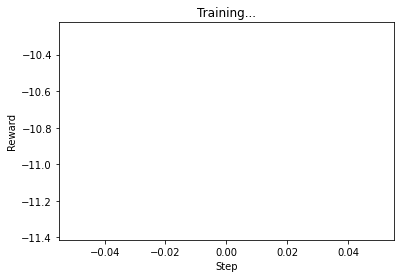

[0.0, 0.0, 8.81831169220976, 0.0]
show


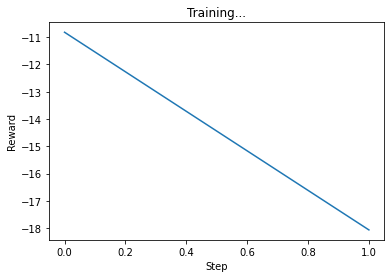

[0.0, 0.0, 16.067782894979423, 0.0]
show


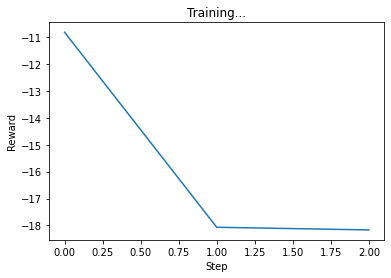

[0.0, 0.0, 16.166341431316717, 0.0]
show


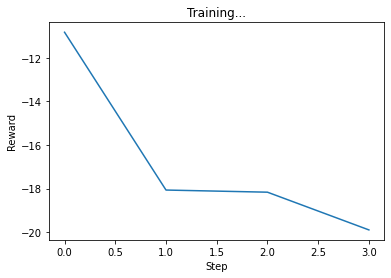

[0.0, 0.0, 17.899592152070632, 0.0]
show


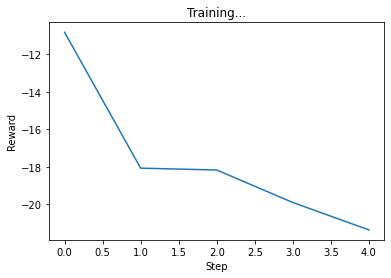

[1.8350440624129567, 0.0, 17.52676374436763, 0.0]
show


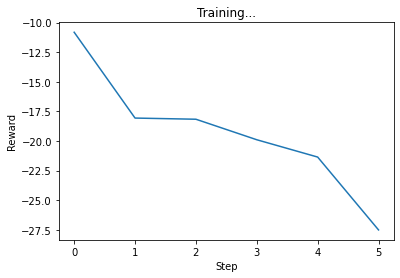

[4.279891304347826, 0.0, 21.235858225237195, 0.0]
show


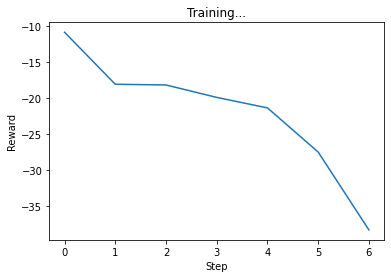

[7.133152173913045, 6.439473134016308, 22.796659128910978, 0.0]
show


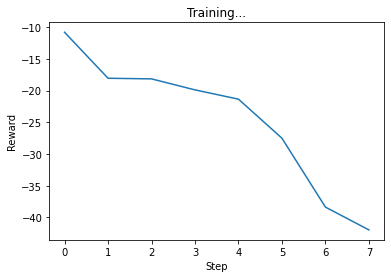

[8.559782608695654, 11.409742513476138, 19.994779610745667, 0.0]
show


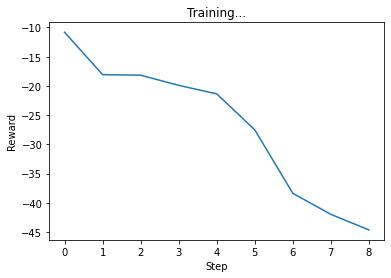

[9.986413043478262, 14.019908683823, 18.622492776693996, 0.0]
show


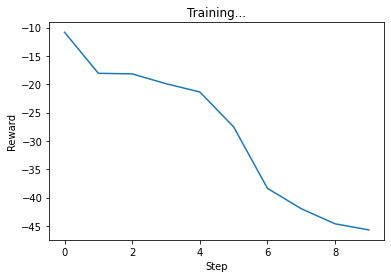

[9.986413043478262, 16.09868283504077, 15.397939185622702, 2.221420843851424]
show


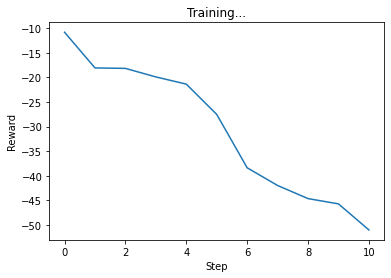

[9.986413043478262, 16.09868283504077, 18.467009217365618, 4.442841687702848]
show


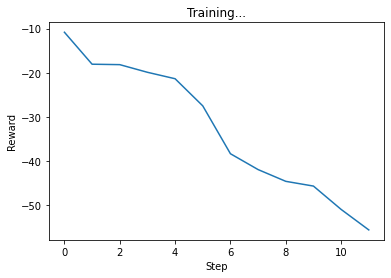

[9.986413043478262, 16.09868283504077, 21.93184201676884, 5.629493407041392]
show


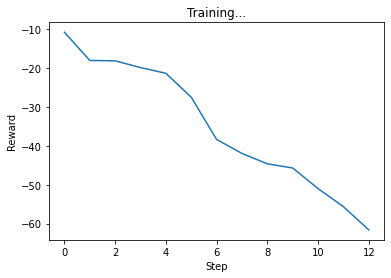

[9.986413043478262, 16.09868283504077, 21.60015148394345, 11.931180900189112]
show


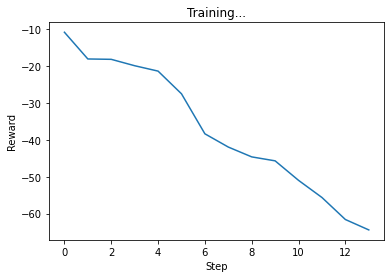

[9.986413043478262, 16.09868283504077, 18.457990401523453, 17.8968228386569]
show


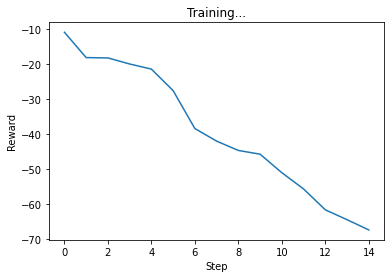

[9.986413043478262, 16.09868283504077, 16.065528299267825, 23.215467077912734]
show


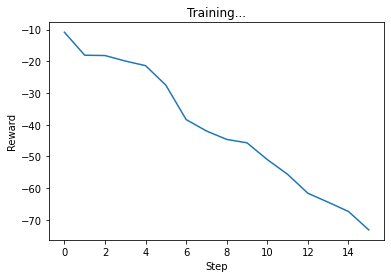

[9.986413043478262, 16.09868283504077, 22.47150963582653, 22.61937378798184]
show


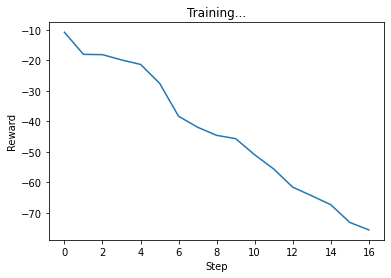

[9.986413043478262, 15.52017944879031, 20.672502977532492, 27.463125477734735]
show


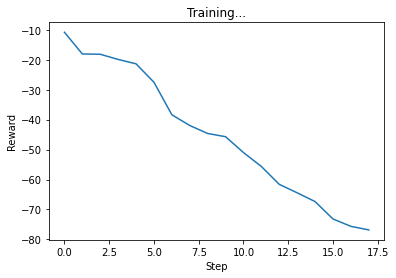

[9.986413043478262, 16.605823037394135, 19.532524950155683, 28.710398190855482]
show


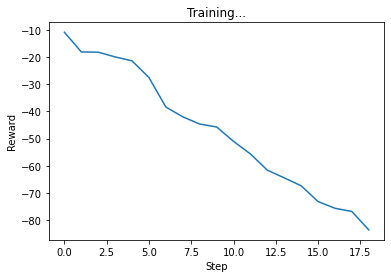

[9.986413043478262, 16.285492663682284, 21.2402551233319, 34.10723998423355]
show


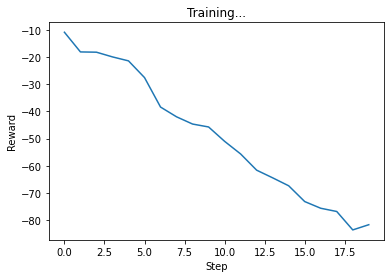

[9.986413043478262, 16.09868283504077, 17.768437876203006, 35.8474578378982]
show


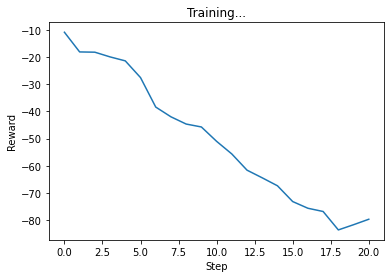

[9.986413043478262, 16.09868283504077, 14.539731426318559, 37.06444620324618]
show


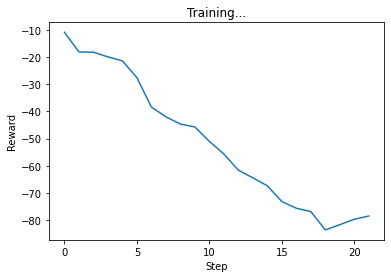

[9.986413043478262, 16.09868283504077, 11.93204989966883, 38.491172755680736]
show


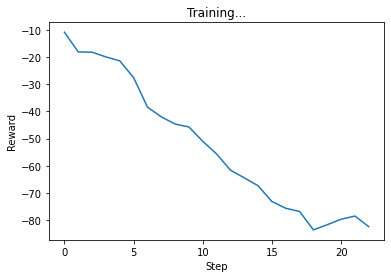

[9.986413043478262, 12.878946268032616, 17.356620454688358, 40.21321734959766]
show


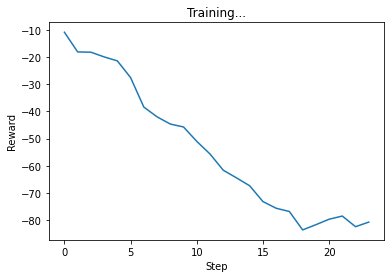

[9.986413043478262, 12.878946268032616, 15.577302285317499, 40.29029952560104]
show


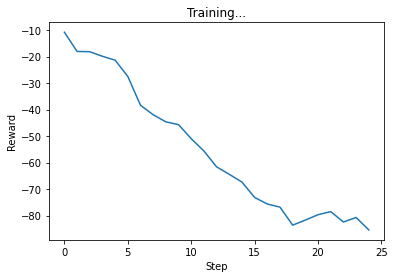

[9.986413043478262, 16.09868283504077, 19.572890794953324, 37.76233909510946]
show


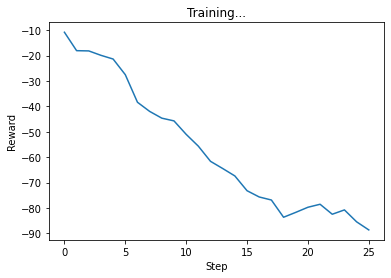

[9.986413043478262, 19.31841940204892, 18.91845054724406, 38.38099773283526]
show


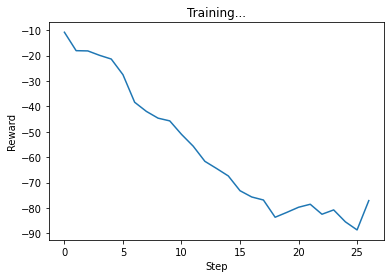

[9.986413043478262, 13.872470931825898, 15.429025404406122, 35.78878251735473]
show


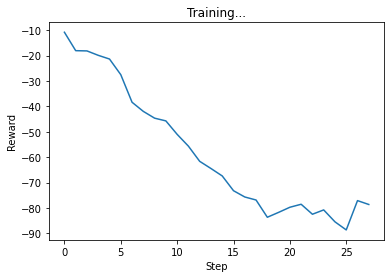

[9.986413043478262, 13.52928912751959, 14.052042578822121, 39.02778830760236]
show


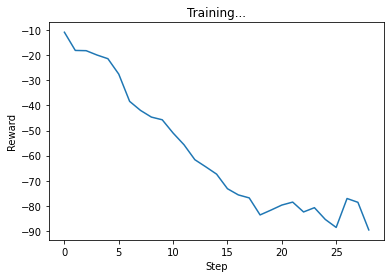

[9.986413043478262, 16.09868283504077, 23.200015928828655, 38.30895521061189]
show


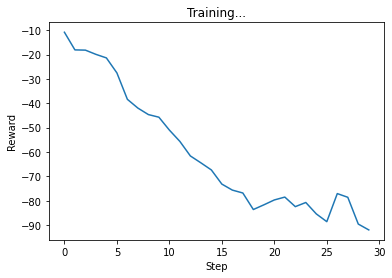

[9.986413043478262, 16.09868283504077, 22.67148532712369, 41.23748667497103]
show


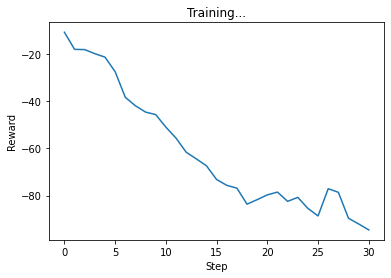

[9.986413043478262, 16.09868283504077, 21.820568701690014, 44.61997193910568]
show


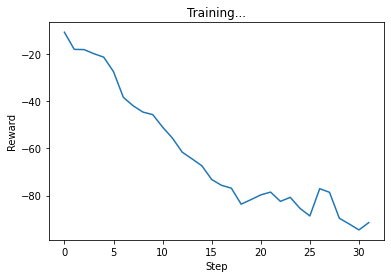

[9.986413043478262, 16.09868283504077, 18.78795921613193, 44.54116649464351]
show


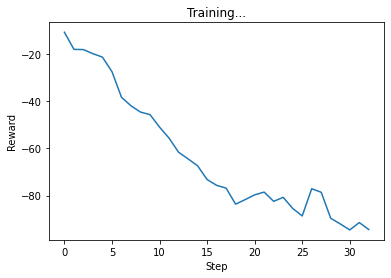

[9.986413043478262, 15.523768076757408, 23.119726451617822, 43.72809278255655]
show


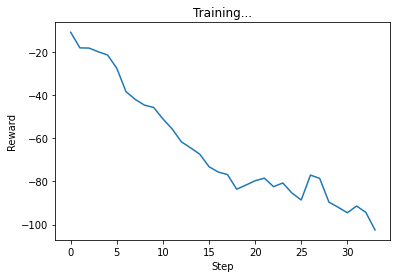

[9.986413043478262, 13.897666185652541, 29.837430189035455, 46.77405558449295]
show


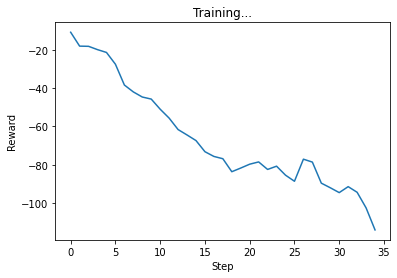

[9.986413043478262, 16.09868283504077, 33.663278435406276, 52.251147930771644]
[9.986413043478262, 16.09868283504077, 33.663278435406276, 52.251147930771644]
set0
show


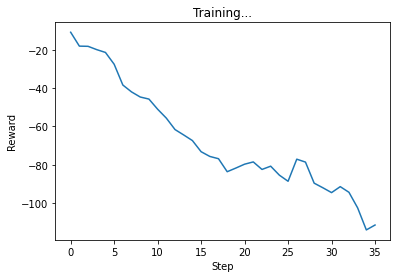

[9.986413043478262, 16.09868283504077, 33.85302919369258, 49.50776677186244]
show


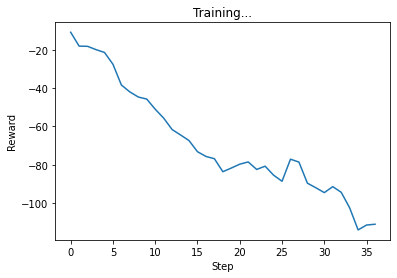

[9.986413043478262, 12.878946268032616, 38.72212823464995, 47.450787465501286]
show


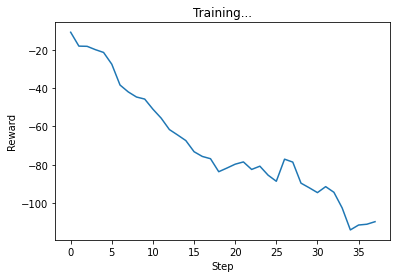

[9.986413043478262, 9.65920970102446, 40.24532467561006, 47.8139800447386]
show


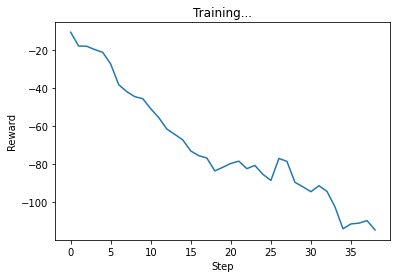

[11.413043478260871, 3.219736567008154, 46.69392079556764, 51.27216804537838]
[11.413043478260871, 3.219736567008154, 46.69392079556764, 51.27216804537838]
set0
show


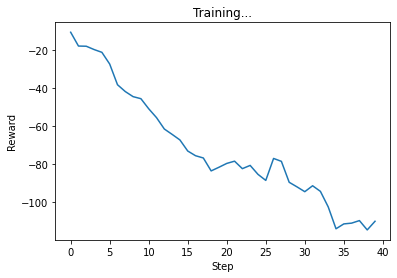

[11.413043478260871, 0.0, 45.6191936101777, 51.02219367905992]
show


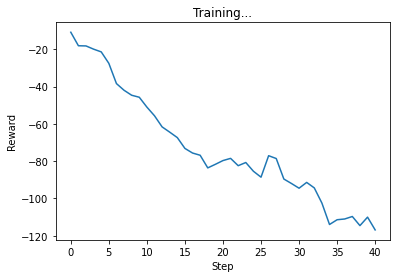

[14.266304347826086, 0.0, 44.53765197346314, 56.104492159968686]
show


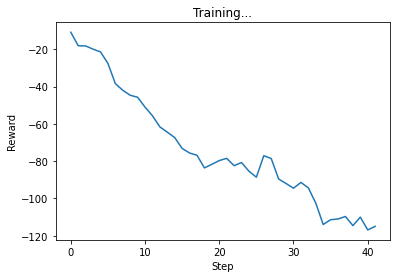

[17.1195652173913, 0.0, 42.40113121748444, 53.49938190286346]
[17.1195652173913, 0.0, 42.40113121748444, 53.49938190286346]
set0
show


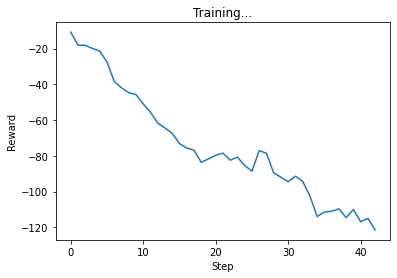

[19.972826086956523, 3.219736567008154, 40.02352201254563, 56.268573414920546]
show


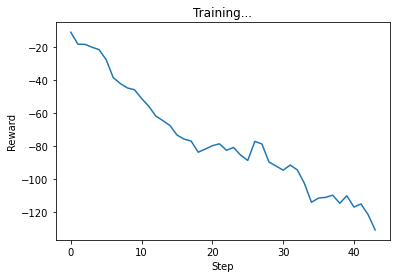

[21.517589945263563, 6.439473134016308, 39.351425917170424, 61.4666719946305]
[21.517589945263563, 6.439473134016308, 39.351425917170424, 61.4666719946305]
set0
show


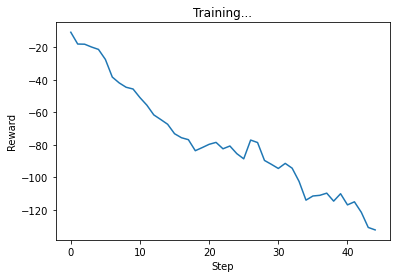

[24.25271739130435, 9.65920970102446, 32.937539907588686, 63.44387035701558]
show


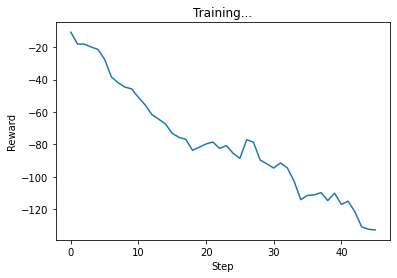

[24.25271739130435, 12.878946268032616, 29.208202002590493, 64.35123947323183]
[24.25271739130435, 12.878946268032616, 29.208202002590493, 64.35123947323183]
set0
show


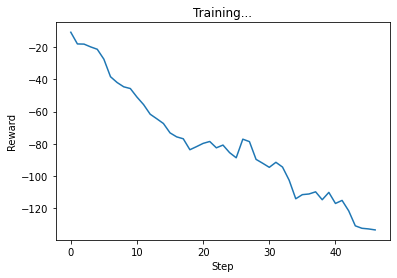

[24.25271739130435, 16.09868283504077, 28.36327868093825, 62.59141338037377]
show


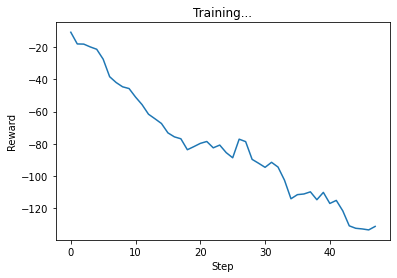

[24.25271739130435, 19.31841940204892, 25.869291462546776, 59.70284724981253]
[24.25271739130435, 19.31841940204892, 25.869291462546776, 59.70284724981253]
set0
show


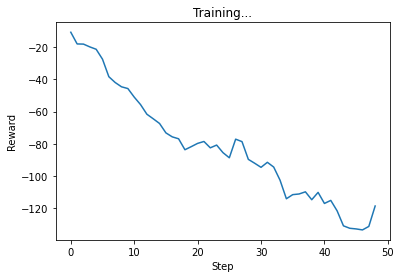

[24.91479107811098, 18.86943889246822, 23.265114481109105, 49.441793477924854]
show


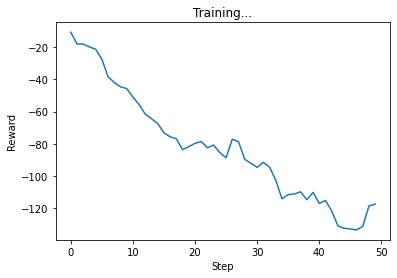

[24.25271739130435, 16.09868283504077, 26.314427071433563, 48.64875598258245]
show


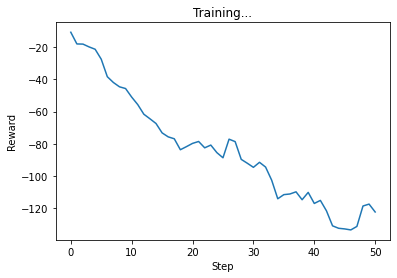

[24.25271739130435, 16.09868283504077, 29.584132413621287, 50.25950718902791]
[24.25271739130435, 16.09868283504077, 29.584132413621287, 50.25950718902791]
set0
show


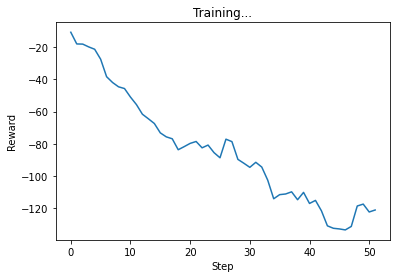

[24.25271739130435, 16.09868283504077, 31.01458931019927, 47.59480026002328]
show


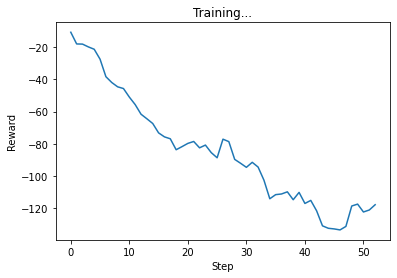

[24.25271739130435, 16.09868283504077, 29.84534611844572, 45.49507662769684]
show


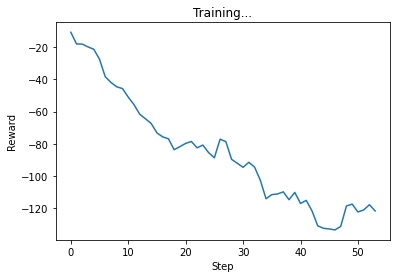

[24.25271739130435, 16.09868283504077, 31.534724796954052, 47.66440516152744]
show


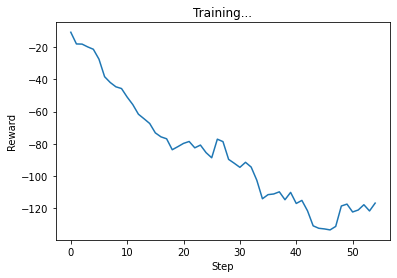

[24.25271739130435, 16.09868283504077, 27.78463849271336, 46.55780698401281]
show


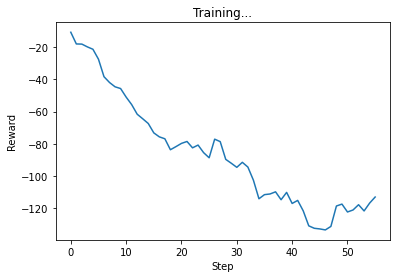

[24.25271739130435, 15.327841103560708, 26.79101683925643, 44.553840502052026]
show


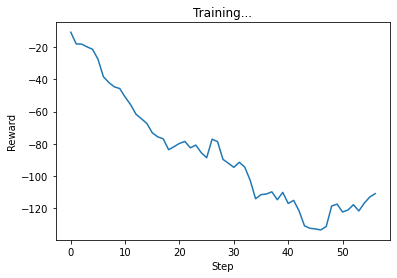

[24.25271739130435, 13.340875127763436, 25.508673671811266, 45.72392064744242]
show


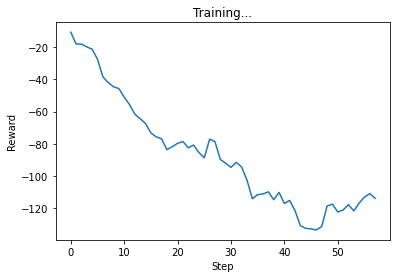

[24.25271739130435, 16.09868283504077, 24.03562292094775, 47.3985947315031]
show


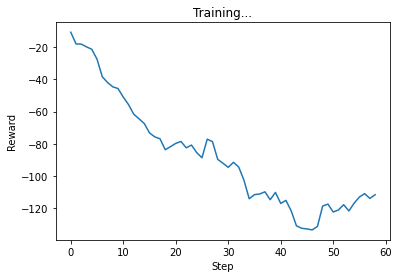

[24.25271739130435, 16.09868283504077, 20.52845557832479, 48.610960180308474]
show


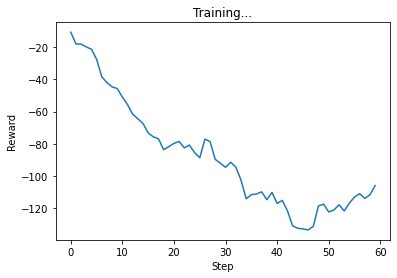

[24.25271739130435, 16.09868283504077, 15.764923412119241, 47.71064406379119]
show


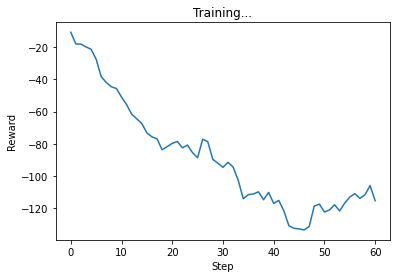

[24.25271739130435, 16.09868283504077, 27.975073994788595, 44.907524025694066]
show


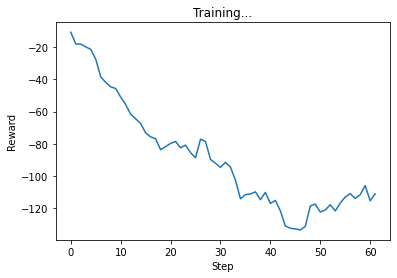

[24.25271739130435, 16.09868283504077, 24.01908758454228, 44.60931317872297]
show


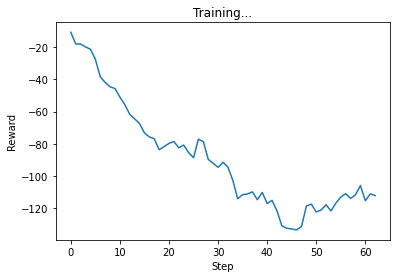

[24.25271739130435, 16.09868283504077, 21.168695148434644, 48.52028066116443]
show


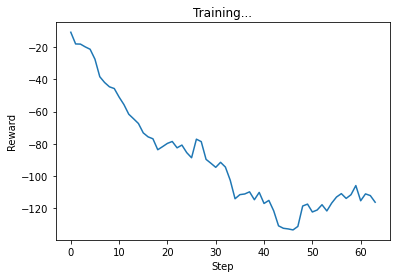

[24.25271739130435, 19.31841940204892, 18.024576524075947, 52.56202930411475]
[24.25271739130435, 19.31841940204892, 18.024576524075947, 52.56202930411475]
set0
show


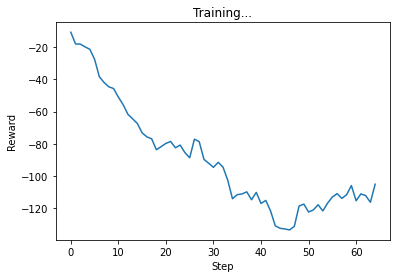

[24.25271739130435, 19.31841940204892, 16.58869832129472, 42.832113039822104]
show


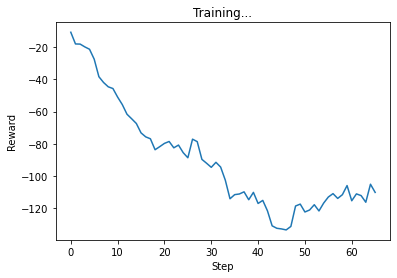

[24.25271739130435, 15.96472867211116, 22.572589818275482, 45.271467392490734]
show


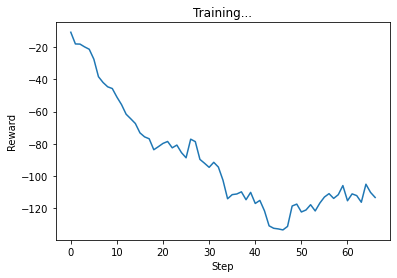

[24.25271739130435, 16.09868283504077, 22.336652528512452, 48.514856083859854]
show


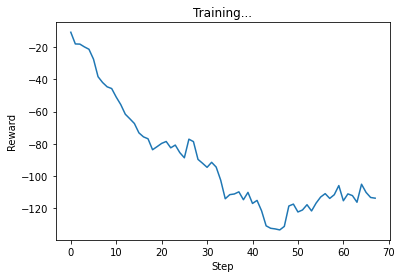

[25.67934782608696, 16.540052030720023, 22.688574658254872, 46.735846192697046]
show


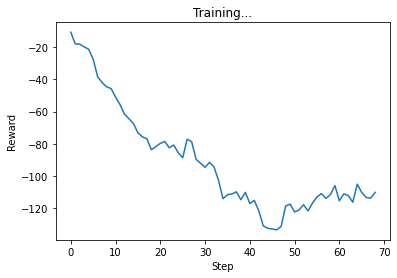

[25.67934782608696, 16.428961932546766, 22.592228901923892, 43.3184600003407]
show


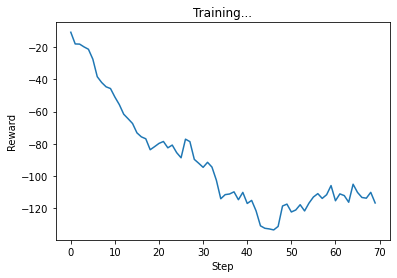

[25.67934782608696, 19.31841940204892, 21.708942528039596, 47.899414174523976]
show


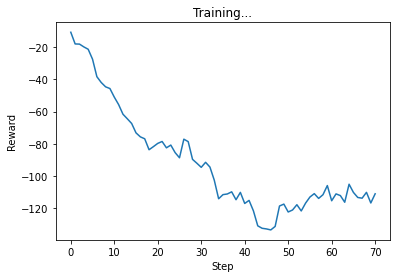

[25.67934782608696, 14.785225422130377, 20.478885473051253, 47.98380966591365]
show


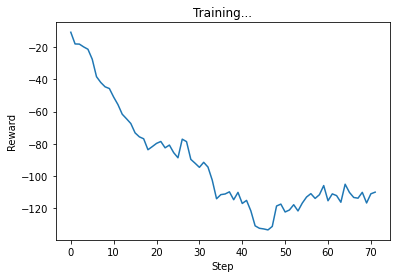

[25.67934782608696, 15.614929180506415, 17.444576862239643, 49.16962751915526]
show


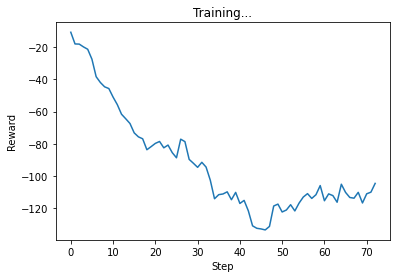

[25.67934782608696, 13.59072729886885, 15.582175024082243, 47.62441891459923]
show


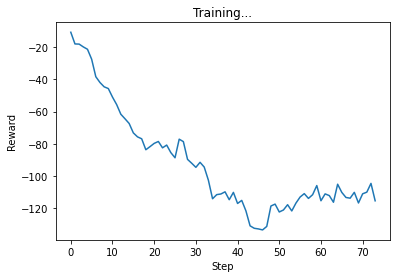

[25.67934782608696, 16.09868283504077, 22.031079481088, 49.459382956046205]
show


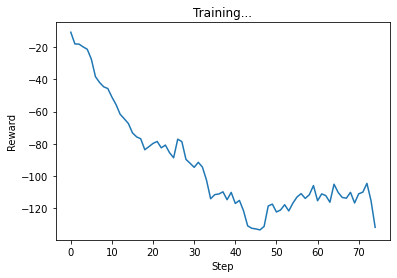

[25.67934782608696, 19.31841940204892, 34.6116076915219, 50.1007981703458]
[25.67934782608696, 19.31841940204892, 34.6116076915219, 50.1007981703458]
set0
show


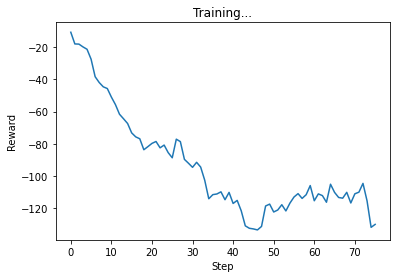

[27.105978260869573, 18.82664482329517, 33.525082119653874, 48.419905685587516]
show


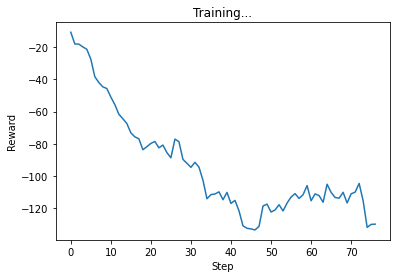

[27.105978260869573, 18.92183311151725, 32.81182262681217, 48.8897260462582]
show


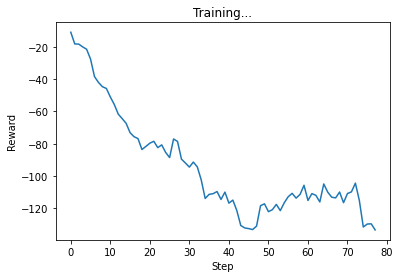

[27.105978260869573, 19.31841940204892, 35.51873269225014, 49.58037970089481]
show


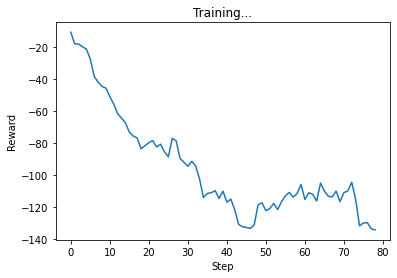

[27.105978260869573, 12.878946268032616, 39.01433820005077, 53.24191180024667]
[27.105978260869573, 12.878946268032616, 39.01433820005077, 53.24191180024667]
set0
show


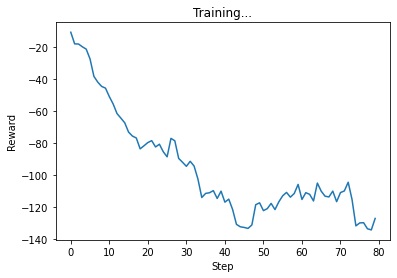

[27.105978260869573, 6.439473134016308, 41.309625293307874, 50.216929140633944]
show


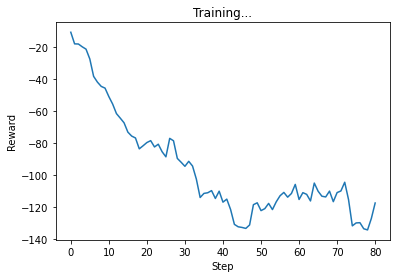

[27.105978260869573, 0.0, 41.29128374832615, 47.04459459639785]
show


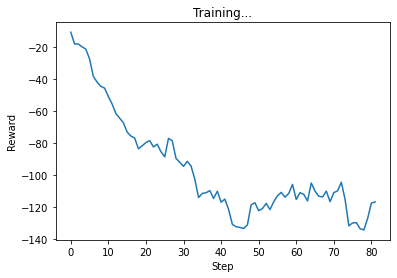

[29.607720938420854, 0.0, 40.12704298624537, 45.044599214886794]
show


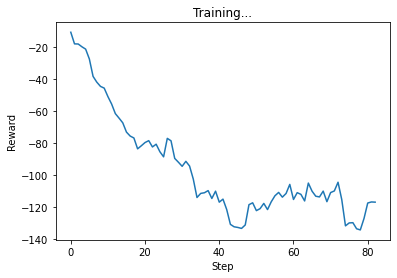

[31.3858695652174, 0.0, 39.41153803890475, 44.114224821541974]
show


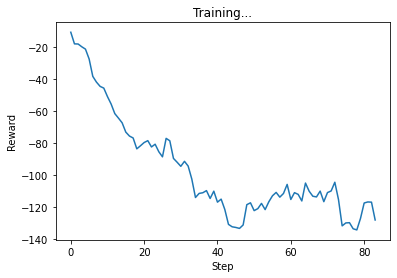

[34.23913043478262, 6.439473134016308, 41.681071133964494, 43.68003457741525]
show


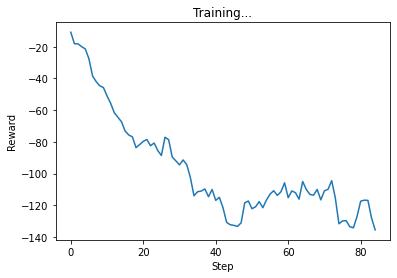

[37.09239130434784, 10.491004659345435, 39.10452042205134, 46.87390292397466]
show


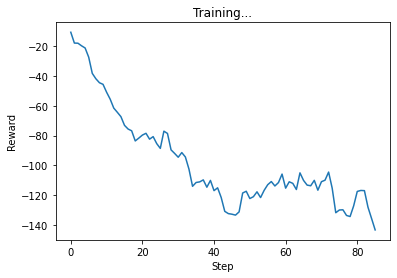

[37.09239130434784, 13.595172421442903, 37.28853309381629, 53.2381367610734]
[37.09239130434784, 13.595172421442903, 37.28853309381629, 53.2381367610734]
set0
show


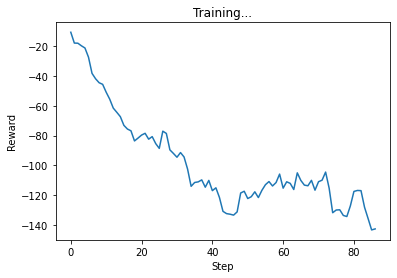

[37.09239130434784, 14.16482765140332, 34.81649768907409, 54.45951118547711]
show


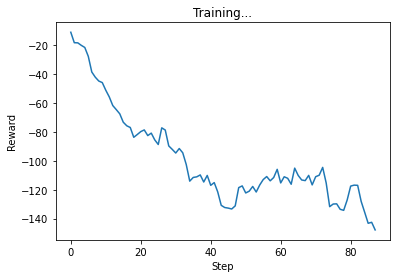

[37.09239130434784, 19.31841940204892, 35.39608137233906, 54.00429907255617]
[37.09239130434784, 19.31841940204892, 35.39608137233906, 54.00429907255617]
set0
show


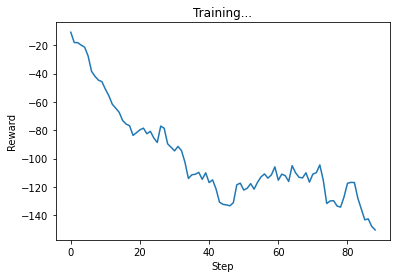

[38.51902173913045, 19.31841940204892, 34.13454556827378, 56.367173816315216]
show


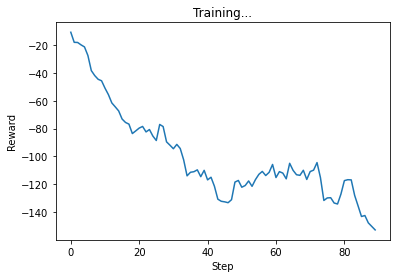

[38.51902173913045, 19.31841940204892, 33.73266318484646, 59.297385307959466]
[38.51902173913045, 19.31841940204892, 33.73266318484646, 59.297385307959466]
set0
show


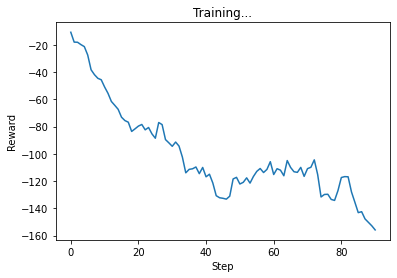

[38.51902173913045, 19.31841940204892, 35.310962739440996, 60.751317418799964]
show


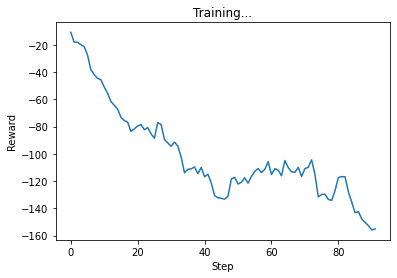

[38.51902173913045, 15.35597362205856, 42.702423664052525, 56.615961824342186]
[38.51902173913045, 15.35597362205856, 42.702423664052525, 56.615961824342186]
set0
show


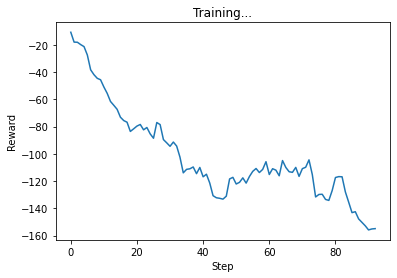

[38.51902173913045, 16.09868283504077, 42.865277329568784, 55.476488212871764]
show


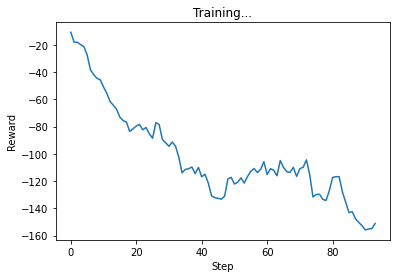

[38.51902173913045, 16.09868283504077, 40.871876644988276, 53.687247317860916]
show


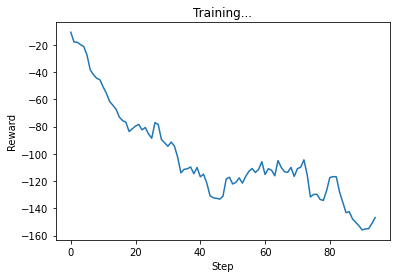

[37.48552739666347, 16.09868283504077, 40.958754605036745, 50.30853226370606]
[37.48552739666347, 16.09868283504077, 40.958754605036745, 50.30853226370606]
set0
show


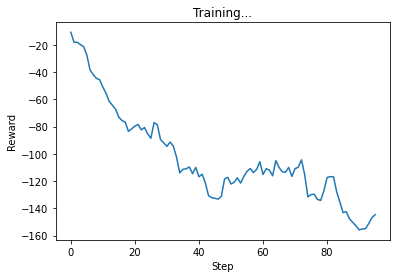

[37.09239130434784, 16.09868283504077, 39.82814919673106, 49.71985891817365]
show


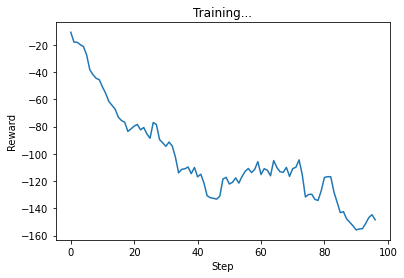

[37.09239130434784, 16.09868283504077, 42.85620710406065, 50.38823277198012]
[37.09239130434784, 16.09868283504077, 42.85620710406065, 50.38823277198012]
set0
show


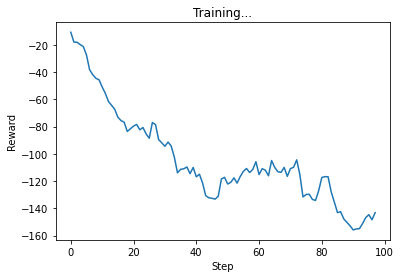

[37.09239130434784, 14.178315227416723, 40.88272135688046, 49.07922393252931]
show


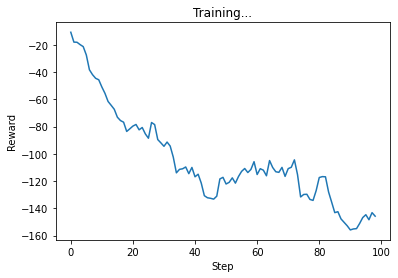

[37.09239130434784, 14.40928075296097, 40.39190574024772, 51.92079847200236]
[37.09239130434784, 14.40928075296097, 40.39190574024772, 51.92079847200236]
set0
show


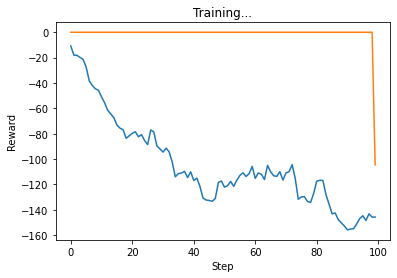

[37.09239130434784, 13.46450938475961, 39.791446892447084, 53.374114437692185]
show


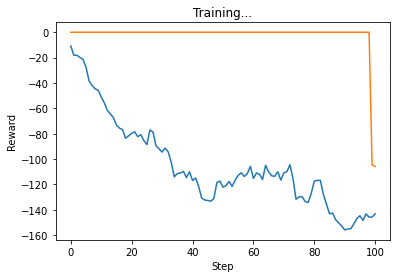

[37.09239130434784, 16.09868283504077, 41.41099146067515, 46.68389490147958]
show


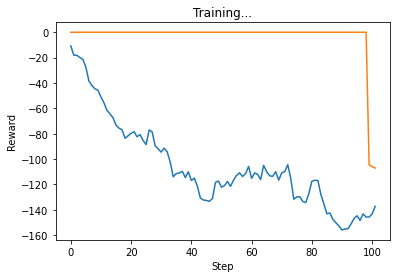

[37.09239130434784, 16.09868283504077, 38.89656998601553, 43.20097639770815]
show


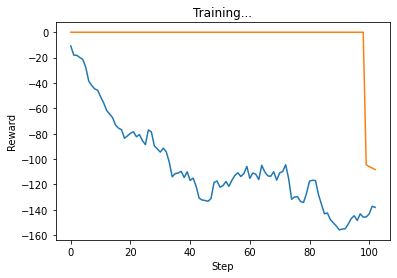

[37.09239130434784, 16.09868283504077, 38.68117779175482, 44.19519558969589]
show


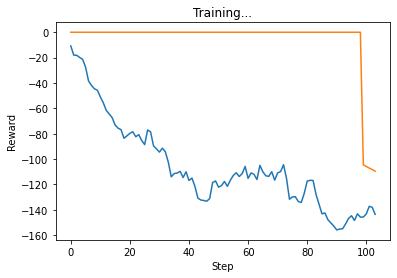

[37.09239130434784, 16.09868283504077, 47.09702038556393, 41.354246159904115]
show


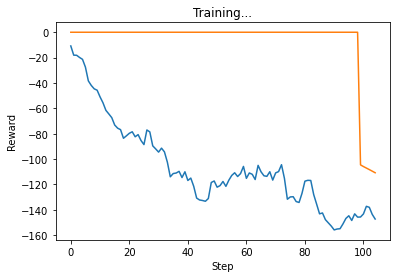

[37.09239130434784, 16.09868283504077, 48.73176231146215, 43.389374091251035]
show


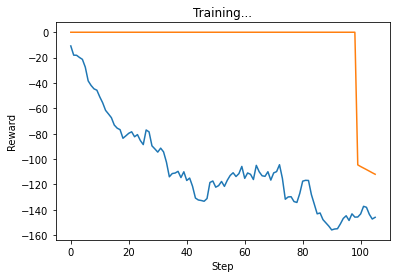

[37.09239130434784, 14.03828450726215, 48.9705550301809, 43.85973210144609]
show


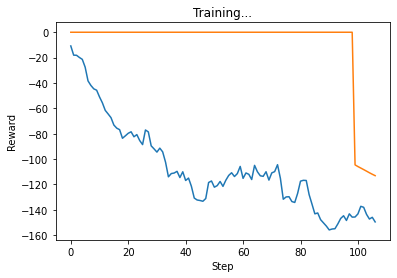

[37.09239130434784, 16.23671606175829, 49.67674719364119, 44.5831614159614]
show


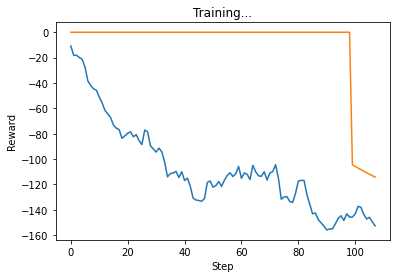

[37.09239130434784, 16.627669283125897, 48.81483426616307, 48.19982139073741]
show


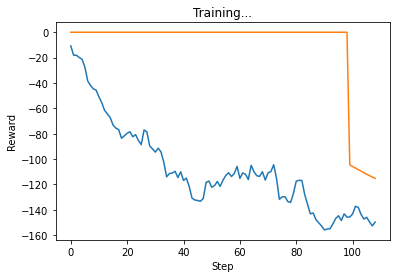

[38.51902173913045, 19.31841940204892, 44.58950674899059, 45.26392878645559]
show


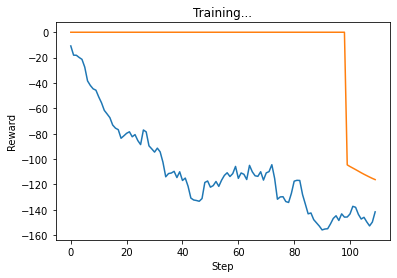

[38.51902173913045, 18.48920114429773, 37.907076334884046, 44.74988905834258]
show


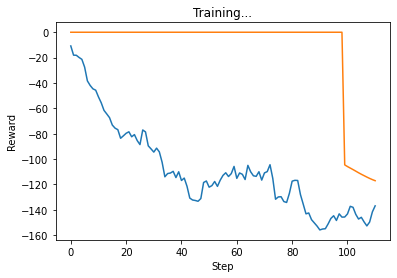

[38.51902173913045, 16.09868283504077, 32.557939391922304, 47.751527757217055]
show


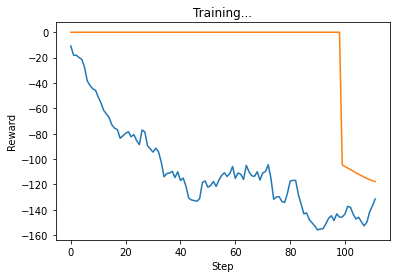

[38.51902173913045, 16.09868283504077, 29.984032221790187, 44.880700197918486]
show


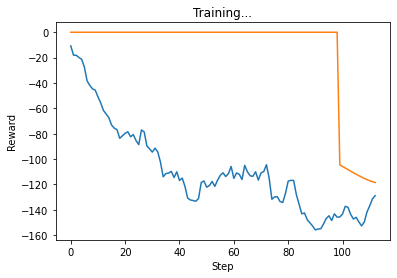

[38.51902173913045, 16.09868283504077, 26.382877393500507, 45.90124205899198]
show


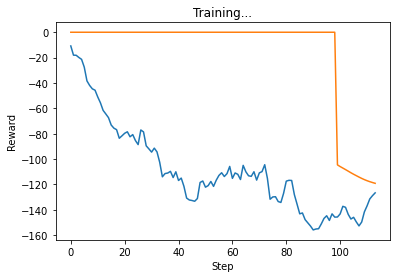

[38.51902173913045, 13.56538112481629, 24.937827226371738, 47.65204312783732]
show


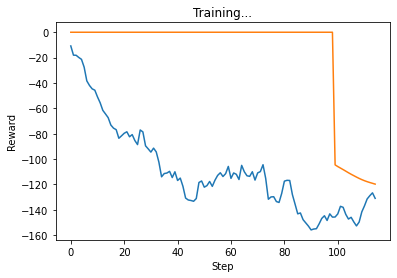

[38.51902173913045, 16.09868283504077, 26.151710210644726, 48.23006788456689]
show


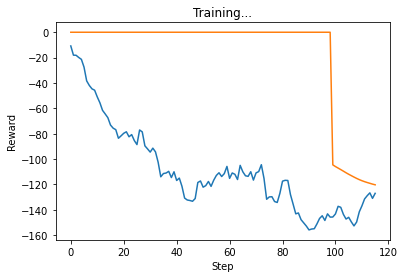

[38.51902173913045, 16.09868283504077, 25.072390760738827, 45.36247974232334]
show


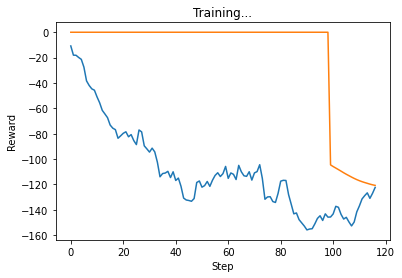

[38.51902173913045, 16.09868283504077, 22.05621100647547, 43.7219735079099]
show


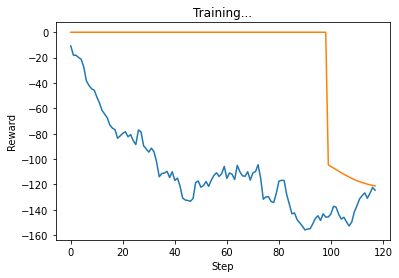

[39.541897081833945, 18.06552876711564, 19.503519455392965, 45.46428217444468]
show


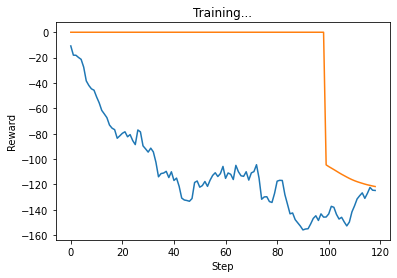

[39.94565217391306, 18.70326839609186, 17.60953971468622, 46.51853756671564]
show


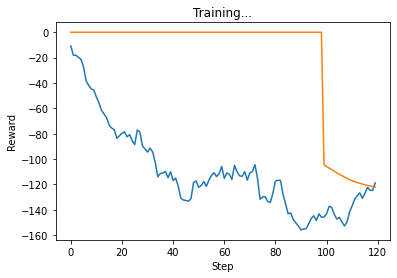

[39.94565217391306, 18.78329407361611, 15.924638597027739, 42.18010948235803]
show


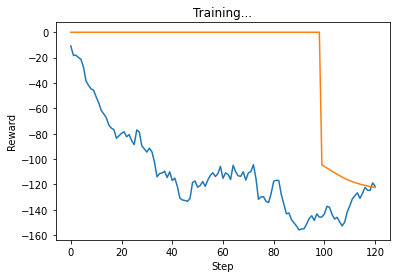

[39.94565217391306, 16.09868283504077, 20.69022614313507, 42.68291163185673]
show


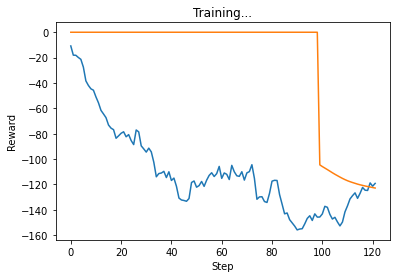

[39.94565217391306, 16.09868283504077, 18.649295605594258, 42.517467596272155]
show


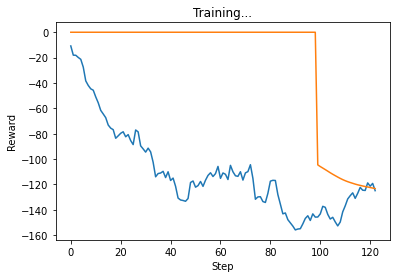

[39.94565217391306, 17.36383120229228, 21.50984737310259, 44.121841685896804]
show


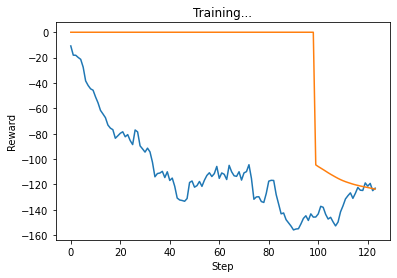

[39.94565217391306, 16.09868283504077, 18.556722623919676, 46.37423536210372]
show


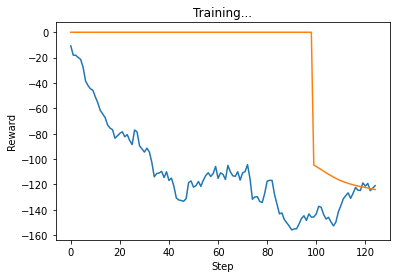

[39.94565217391306, 19.31841940204892, 15.097905874027836, 44.64865480464854]
show


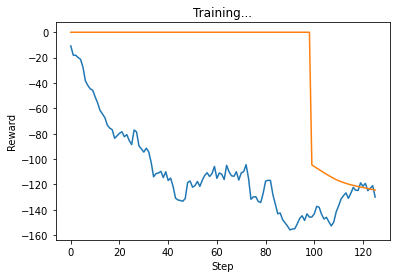

[39.94565217391306, 17.000114382352134, 26.191282521357962, 44.860009996394716]
show


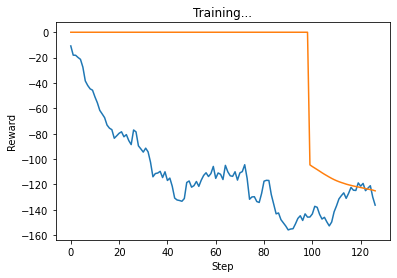

[39.94565217391306, 14.841147219305997, 29.918515353301498, 49.64551842043016]
show


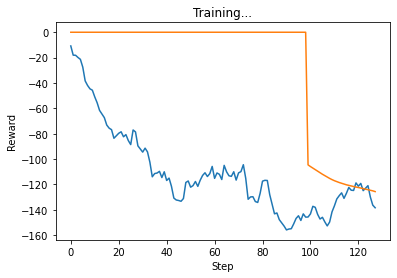

[39.94565217391306, 14.654658109341215, 31.03998526573026, 50.78213935800323]
[39.94565217391306, 14.654658109341215, 31.03998526573026, 50.78213935800323]
set0
show


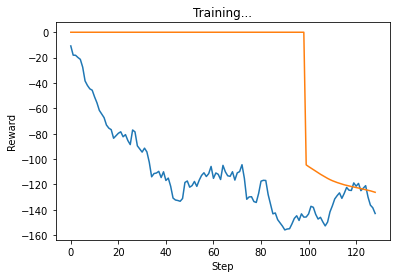

[39.94565217391306, 16.09868283504077, 32.34740179000133, 52.56202930411475]
show


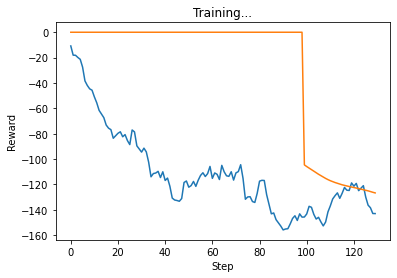

[39.94565217391306, 14.166891512447085, 35.11352827174494, 51.79139922153715]
show


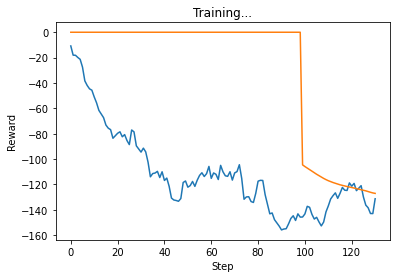

[39.94565217391306, 6.474004218931515, 36.405092170474106, 46.51071152756693]
show


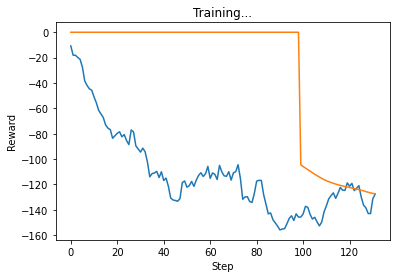

[39.94565217391306, 0.7744139319475265, 36.74420525889091, 48.16474396437895]
show


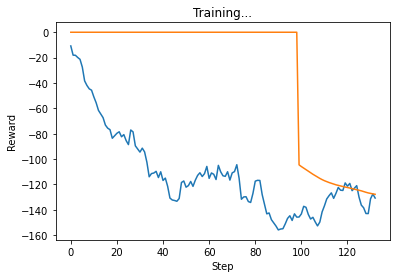

[40.57910501312143, 6.439473134016308, 33.29663312303869, 48.449156243567494]
show


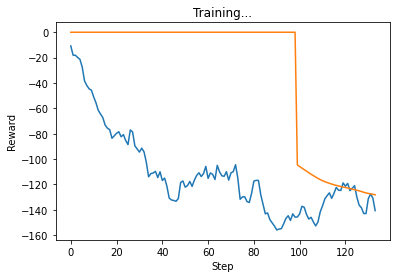

[42.79891304347828, 11.958250107207741, 29.348509378883772, 54.60333448863626]
[42.79891304347828, 11.958250107207741, 29.348509378883772, 54.60333448863626]
set0
show


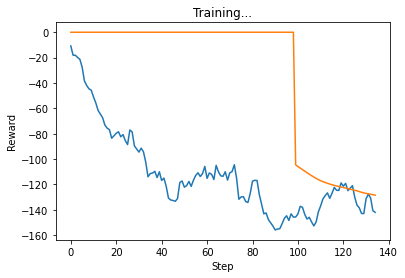

[44.225543478260896, 12.878946268032616, 26.73511640556793, 56.22535995243705]
show


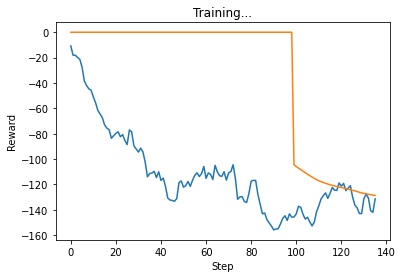

[44.225543478260896, 12.878946268032616, 24.897517830192147, 47.439174345690056]
show


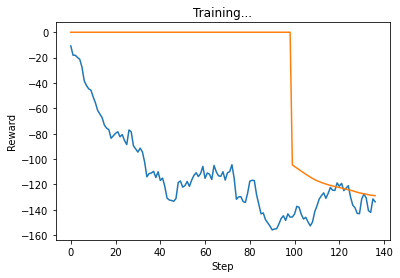

[44.225543478260896, 19.31841940204892, 21.129480786931452, 47.08435706099828]
show


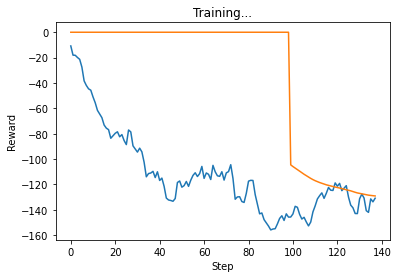

[44.225543478260896, 19.31841940204892, 19.368576356650806, 45.97924376479035]
show


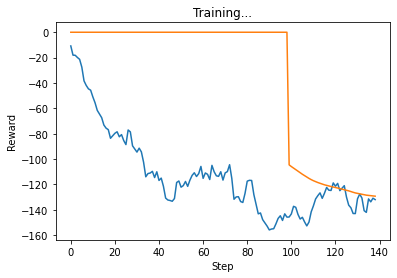

[44.225543478260896, 19.31841940204892, 21.950777874274777, 44.4974187201877]
show


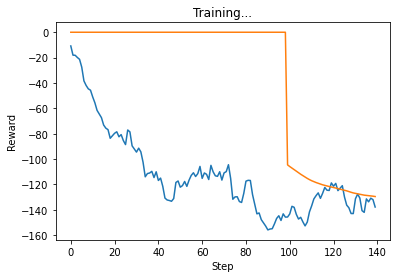

[44.225543478260896, 18.7056749542754, 26.93994194314526, 45.97594961833409]
show


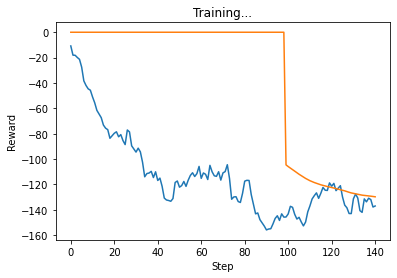

[44.225543478260896, 16.09868283504077, 27.662716889923324, 47.045521531425685]
show


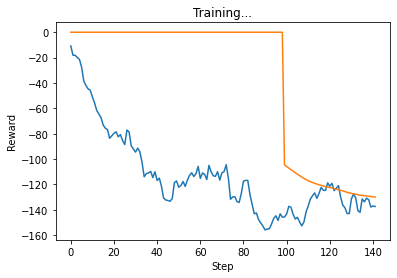

[44.225543478260896, 14.414972362574124, 31.012562887709404, 45.72763841749988]
show


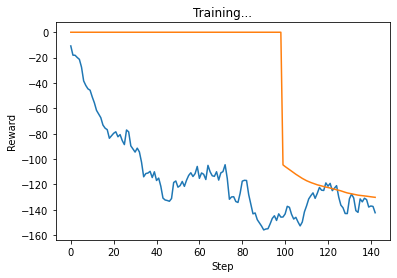

[44.225543478260896, 16.268982481527537, 31.34790414719619, 48.509317478280686]
show


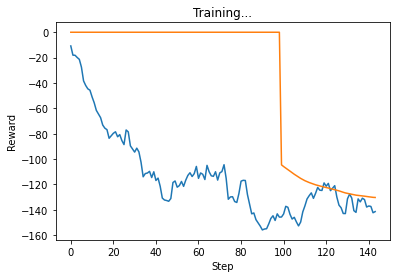

[44.225543478260896, 16.663471013200766, 29.338556173007476, 49.23307799621997]
show


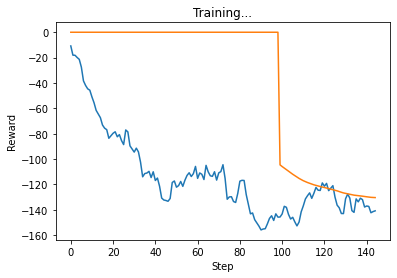

[44.225543478260896, 19.31841940204892, 28.313332550981244, 46.9920125666544]
show


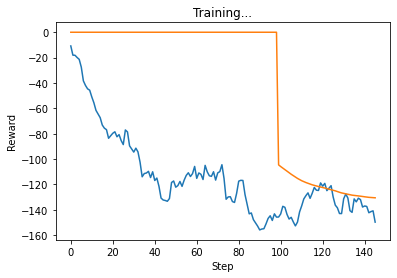

[44.225543478260896, 17.578659815843533, 32.4729964348984, 53.48525674263351]
[44.225543478260896, 17.578659815843533, 32.4729964348984, 53.48525674263351]
set0
show


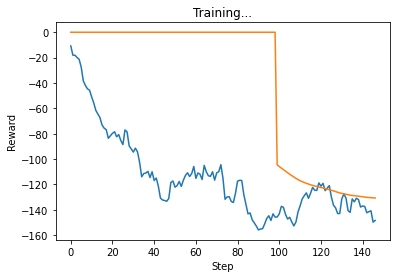

[44.225543478260896, 16.09868283504077, 28.88075056461687, 57.204116265897426]
show


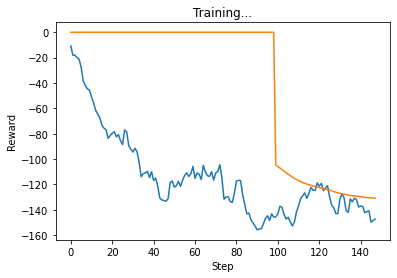

[44.225543478260896, 16.09868283504077, 26.664700044660293, 58.40196756472036]
show


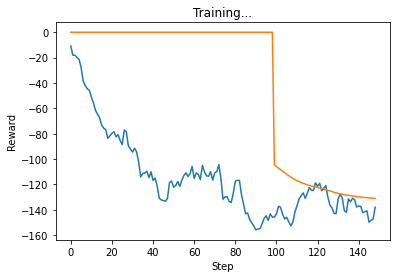

[44.225543478260896, 16.09868283504077, 22.30639762768148, 53.3765047722542]
[44.225543478260896, 16.09868283504077, 22.30639762768148, 53.3765047722542]
set0
show


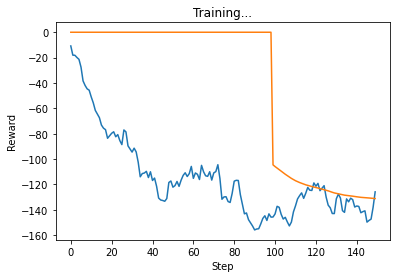

[44.225543478260896, 14.42087294583763, 19.68296995872623, 45.549808823826424]
show


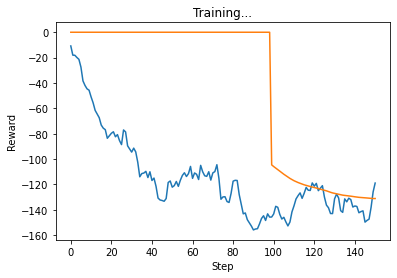

[44.225543478260896, 12.878946268032616, 16.52027427637718, 43.32567644612926]
show


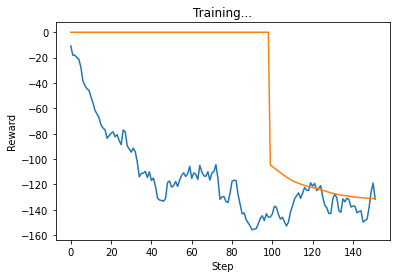

[44.05868799053202, 16.09868283504077, 25.423726965309882, 44.22805983537874]
show


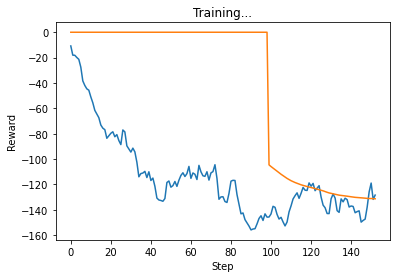

[44.225543478260896, 15.340995459619908, 26.01190269357282, 40.85419542735087]
show


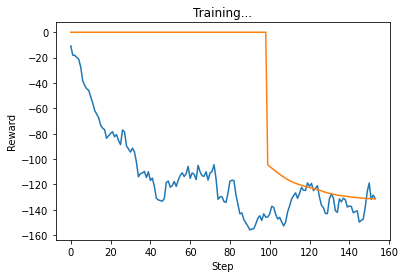

[44.225543478260896, 17.718091773340788, 25.869169469403133, 41.24195593381986]
show


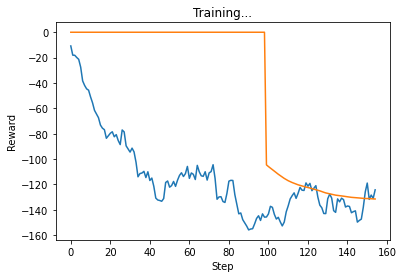

[44.225543478260896, 16.09868283504077, 23.275292261152508, 38.69648216322785]
show


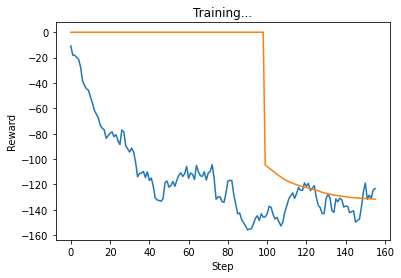

[44.225543478260896, 16.09868283504077, 21.18945110880001, 39.773368307138334]
show


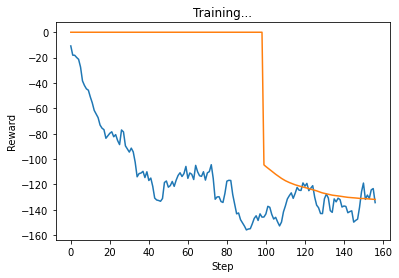

[44.225543478260896, 16.09868283504077, 32.60031399909723, 39.44137450554279]
show


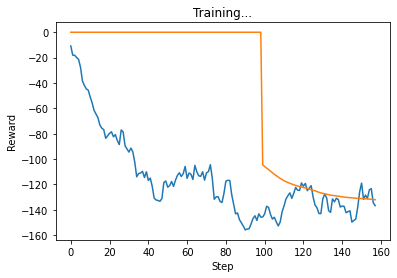

[44.225543478260896, 16.09868283504077, 29.75527149349975, 44.70981967914821]
show


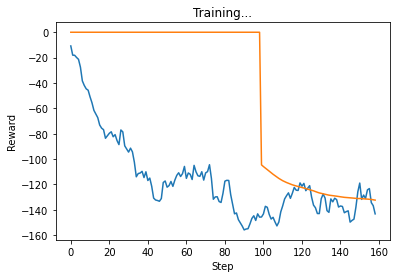

[44.225543478260896, 16.09868283504077, 33.3336378817656, 47.58694769775071]
show


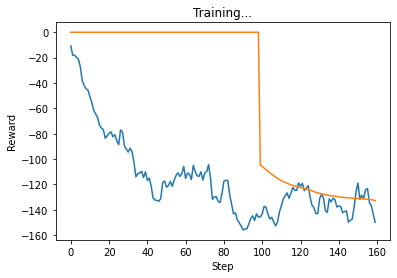

[44.225543478260896, 16.09868283504077, 36.0143757487641, 51.548249849331]
[44.225543478260896, 16.09868283504077, 36.0143757487641, 51.548249849331]
set0
show


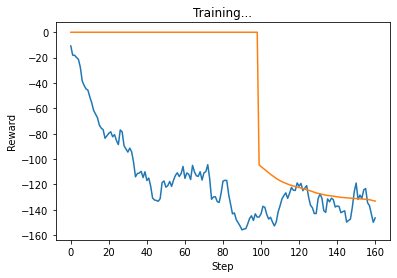

[44.225543478260896, 16.09868283504077, 38.24915277808019, 45.8785545894362]
show


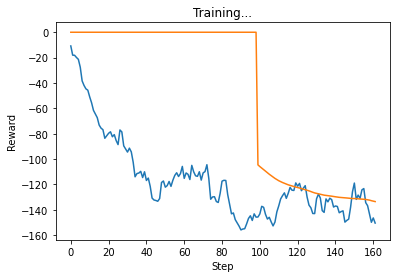

[44.225543478260896, 16.09868283504077, 37.13997862180966, 51.04352848989509]
[44.225543478260896, 16.09868283504077, 37.13997862180966, 51.04352848989509]
set0
show


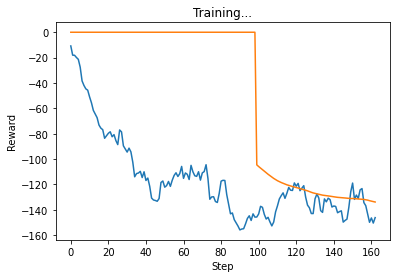

[44.225543478260896, 13.852704266586993, 34.371427581836706, 51.746661260759225]
show


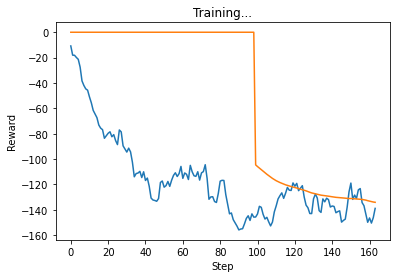

[44.225543478260896, 12.878946268032616, 34.19939720655943, 45.607755498736196]
show


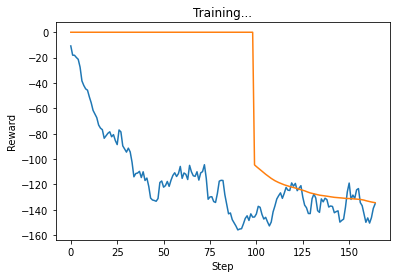

[44.225543478260896, 12.878946268032616, 30.97536936234755, 45.195391183233454]
show


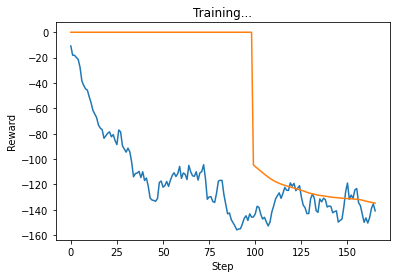

[44.225543478260896, 19.220781741247283, 34.19906378163839, 41.244882848863114]
show


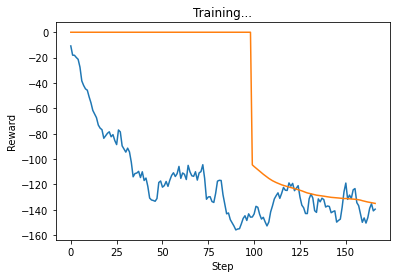

[45.6521739130435, 19.31841940204892, 33.381247300041004, 39.18194419909989]
show


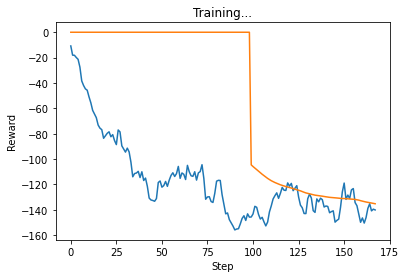

[45.6521739130435, 16.09868283504077, 33.72502430021501, 42.672235394884446]
show


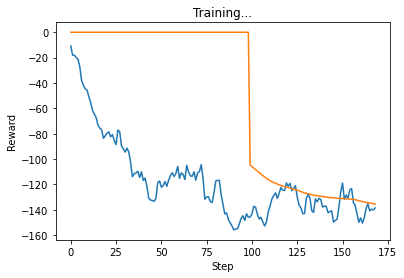

[45.6521739130435, 16.09868283504077, 32.5352408264823, 42.303029505056486]
show


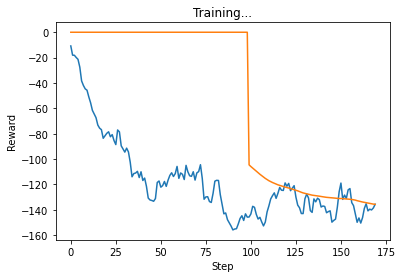

[45.6521739130435, 16.09868283504077, 31.05964209215584, 40.82683487271994]
show


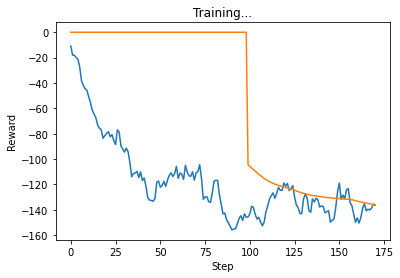

[45.6521739130435, 16.09868283504077, 30.024437756536507, 42.64910406484989]
show


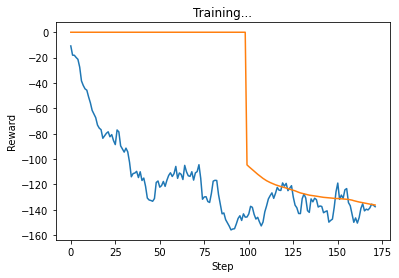

[45.6521739130435, 16.09868283504077, 35.335476748614965, 38.49336076347556]
show


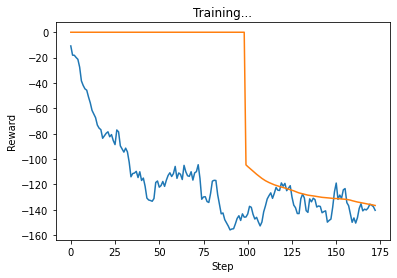

[45.6521739130435, 16.09868283504077, 34.2406268091859, 42.43800058715673]
show


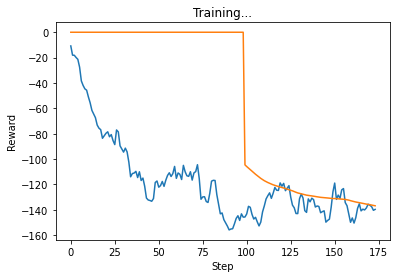

[45.6521739130435, 13.160654157690823, 35.66913236985846, 43.23068935136527]
show


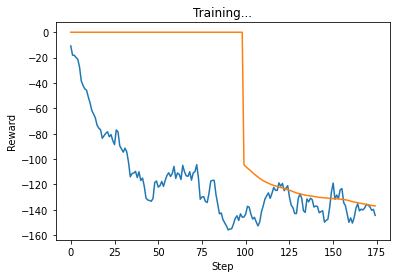

[45.6521739130435, 17.557371546309934, 33.28990118011609, 45.91837284745102]
show


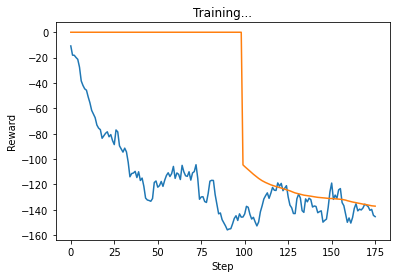

[45.6521739130435, 16.09868283504077, 32.68609242035859, 48.992050091980275]
show


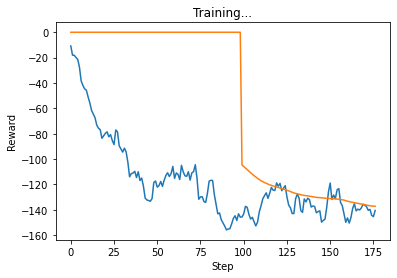

[45.6521739130435, 16.09868283504077, 30.213077856345365, 46.576495223762805]
show


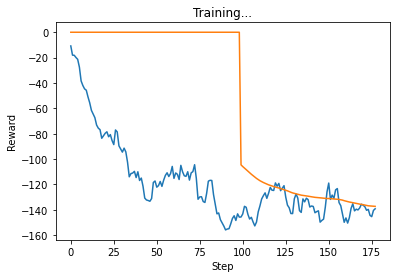

[45.6521739130435, 16.09868283504077, 32.37950317889163, 43.116008971720255]
show


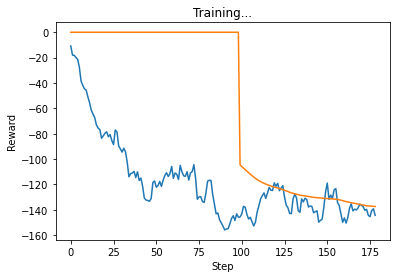

[45.6521739130435, 16.09868283504077, 36.57960904185402, 44.07356421592893]
show


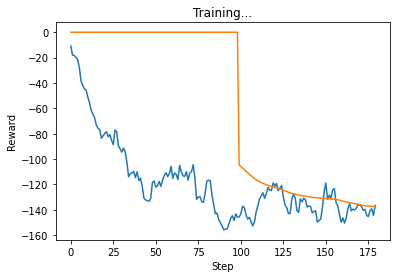

[45.6521739130435, 16.09868283504077, 31.20981755950947, 41.67918977513268]
show


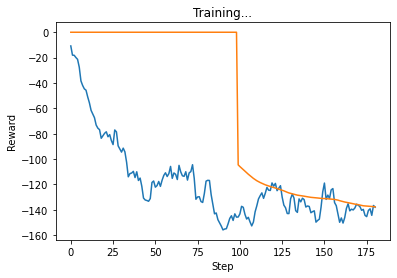

[45.6521739130435, 17.80313700710969, 30.64608795373958, 41.88790442327492]
show


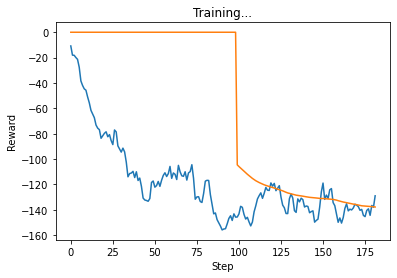

[45.6521739130435, 12.878946268032616, 26.512556686217287, 41.96186282173249]
show


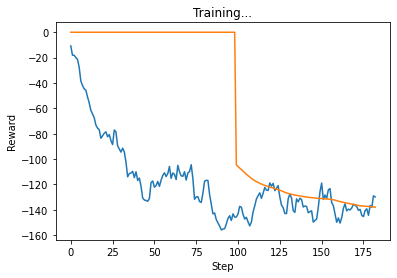

[45.6521739130435, 16.09868283504077, 24.845832782097613, 41.26888171507258]
show


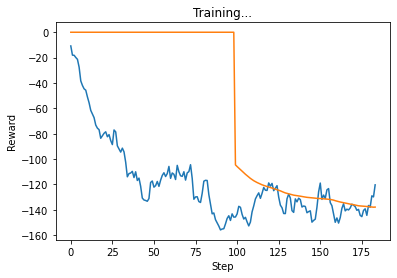

[45.6521739130435, 16.09868283504077, 20.47373375785643, 36.13409157889192]
show


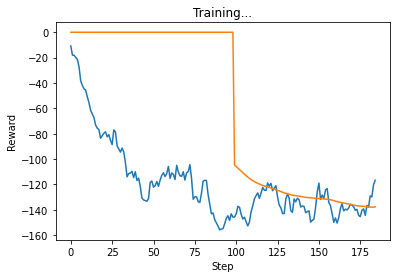

[45.6521739130435, 16.09868283504077, 15.599144791434757, 37.353551142384966]
show


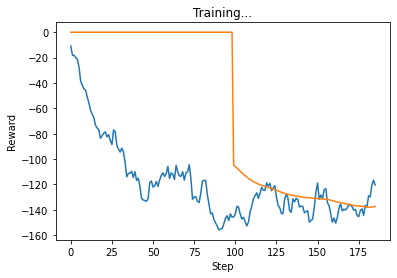

[45.6521739130435, 14.840205203735346, 21.11759151057132, 36.831916022748]
show


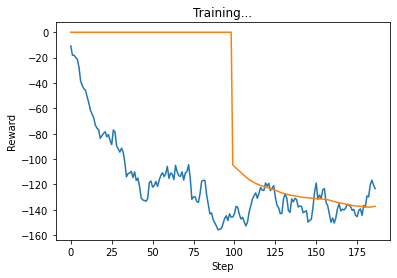

[45.6521739130435, 17.145285086166485, 18.832294033037126, 39.681671256601305]
show


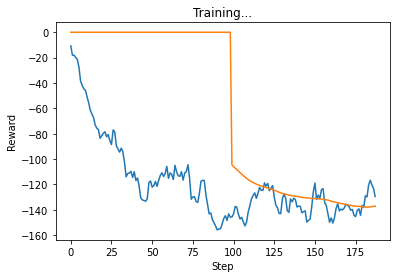

[47.07880434782611, 16.64279822968215, 21.99347628323886, 41.8212009060746]
show


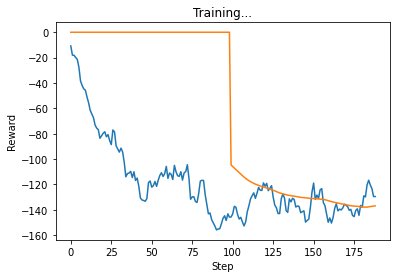

[47.07880434782611, 16.09868283504077, 22.37362848023381, 42.00964725773008]
show


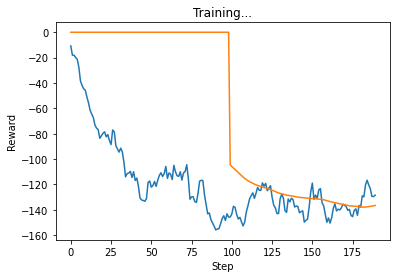

[47.07880434782611, 16.09868283504077, 21.396299483563652, 41.928935050159446]
show


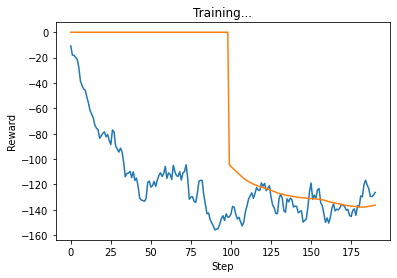

[47.07880434782611, 16.09868283504077, 18.61278934571417, 42.53492240352695]
show


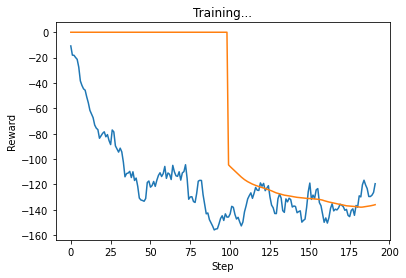

[47.07880434782611, 13.61113512094887, 15.511848271321545, 41.25574909204938]
show


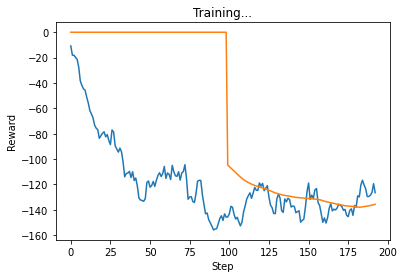

[47.07880434782611, 16.09868283504077, 19.149583658812105, 42.18668206388248]
show


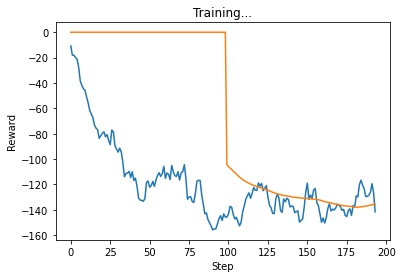

[47.07880434782611, 16.09868283504077, 31.258122395974404, 45.16814226429997]
show


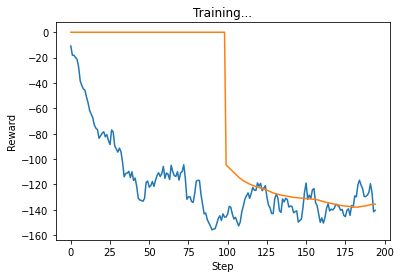

[47.07880434782611, 16.09868283504077, 26.820472961760558, 48.39841706354929]
show


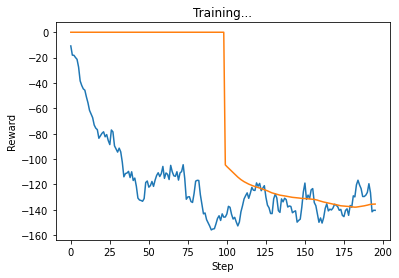

[47.07880434782611, 16.09868283504077, 23.333667730791515, 51.9413540997348]
[47.07880434782611, 16.09868283504077, 23.333667730791515, 51.9413540997348]
set0
show


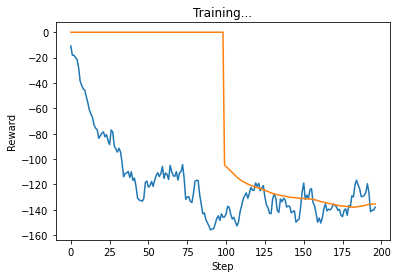

[47.07880434782611, 13.41317923876502, 23.225239791132186, 52.23463323236015]
show


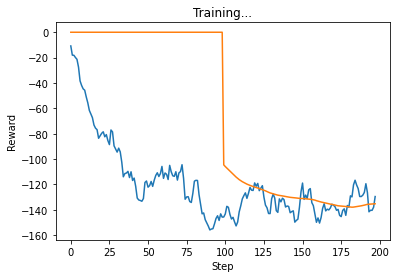

[47.07880434782611, 14.213687205822115, 20.61487217196855, 45.678377249273694]
show


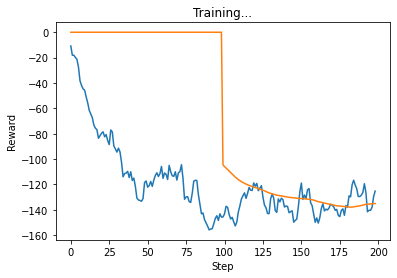

[47.07880434782611, 13.007423111339397, 19.86779098649269, 43.312908092612965]
show


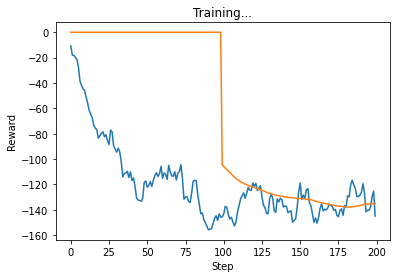

[47.07880434782611, 19.31841940204892, 33.51259449420914, 43.08013126048993]
show


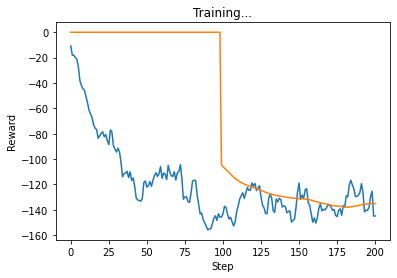

[48.50543478260872, 19.31841940204892, 31.51813308521076, 43.58515973375165]
show


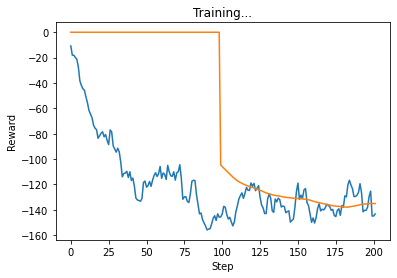

[48.50543478260872, 16.78931372944569, 30.809020708797703, 45.227958422200324]
show


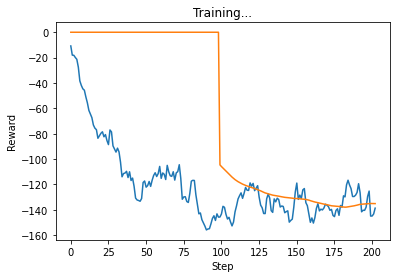

[48.50543478260872, 14.912965566987577, 30.60482125041719, 42.70722513088529]
show


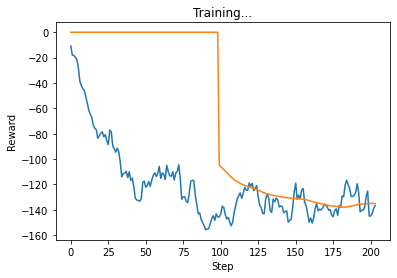

[48.50543478260872, 18.10026925230548, 27.107956919972118, 40.94480675622486]
show


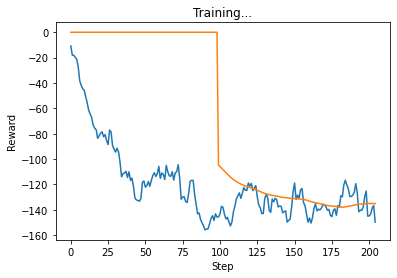

[48.50543478260872, 16.965800987874903, 34.67079924380964, 47.591284793284274]
show


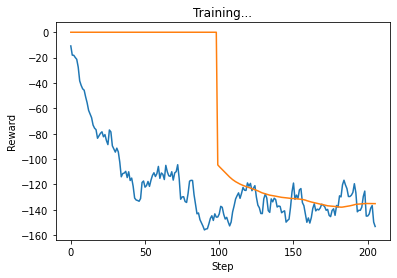

[48.50543478260872, 16.51949816163592, 32.46525674041991, 53.705417398099314]
[48.50543478260872, 16.51949816163592, 32.46525674041991, 53.705417398099314]
set0
show


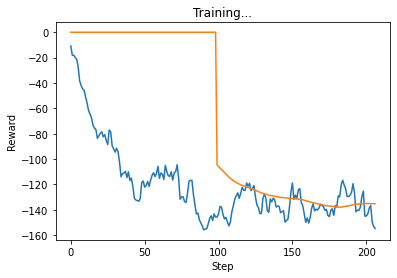

[48.50543478260872, 16.855001827565523, 30.62567230255293, 56.777114346244524]
show


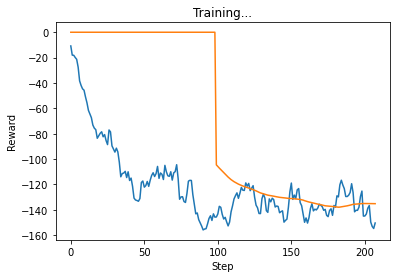

[48.50543478260872, 16.32310941947786, 26.45440918582424, 57.16619710532452]
[48.50543478260872, 16.32310941947786, 26.45440918582424, 57.16619710532452]
set0
show


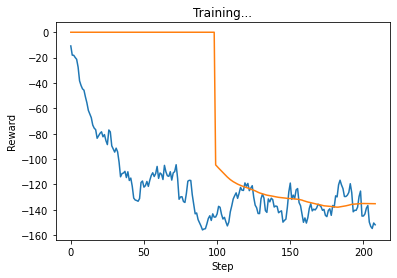

[48.50543478260872, 16.796538481108204, 37.2710874748311, 47.28462266509039]
show


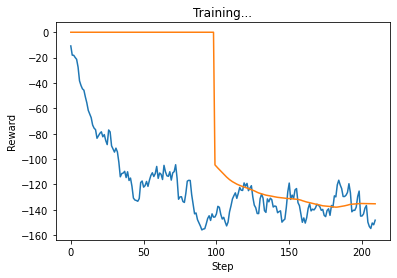

[48.50543478260872, 16.500281017930522, 38.210314342783036, 43.01259552352146]
show


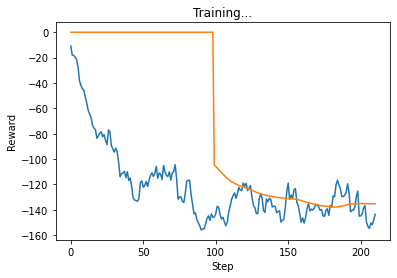

[48.50543478260872, 16.09868283504077, 34.89707748016632, 42.13338538016712]
show


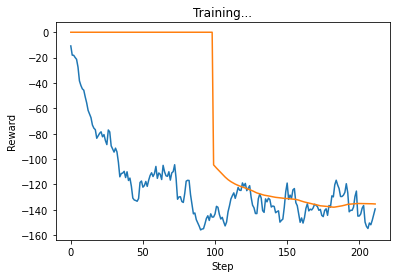

[48.50543478260872, 16.09868283504077, 30.419000340707264, 42.32999023507052]
show


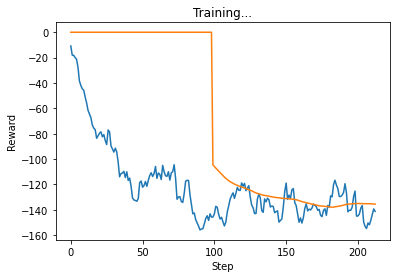

[48.50543478260872, 16.09868283504077, 33.873674141476776, 40.78408697266678]
show


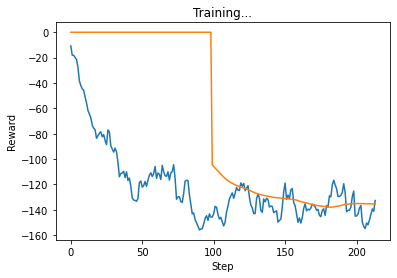

[48.50543478260872, 13.806055981943052, 27.146011553862817, 41.26536936421448]
show


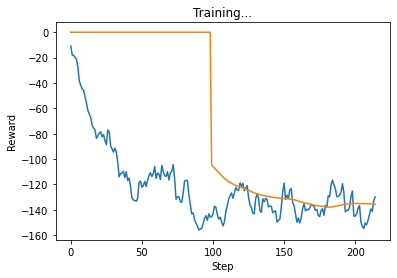

[48.50543478260872, 15.88630340998965, 23.582984739897707, 39.97202588532139]
show


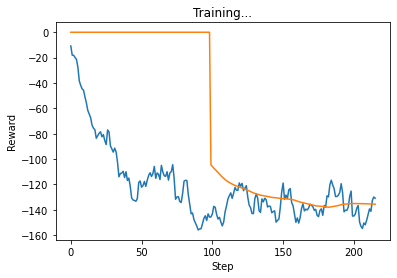

[48.50543478260872, 16.09868283504077, 23.445121691304774, 40.84823089649769]
show


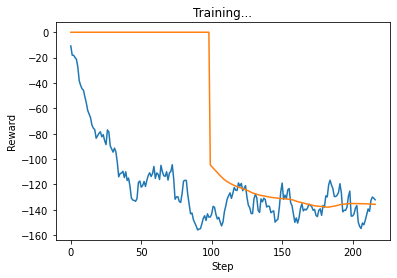

[48.50543478260872, 16.09868283504077, 23.279747539691176, 42.232135807392964]
show


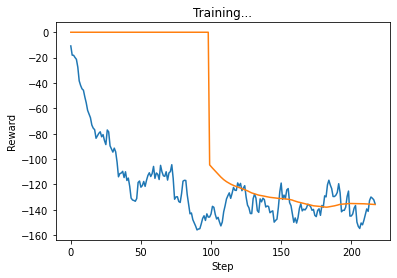

[48.50543478260872, 17.185472615764596, 25.453013286572613, 42.369014310998445]
show


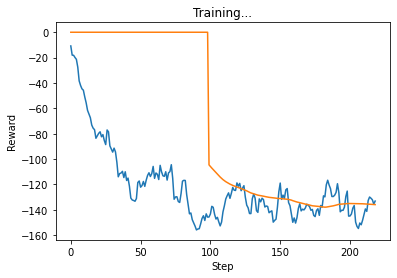

[48.50543478260872, 16.09868283504077, 25.333503157140978, 41.208776072710045]
show


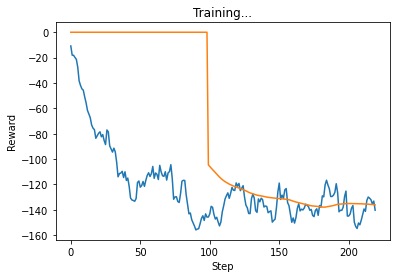

[49.93206521739133, 19.31841940204892, 21.739946501382157, 47.36930851427593]
show


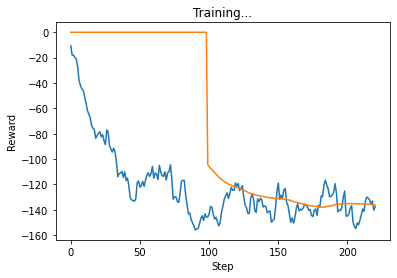

[49.93206521739133, 19.31841940204892, 17.864264609252892, 48.448307093312074]
show


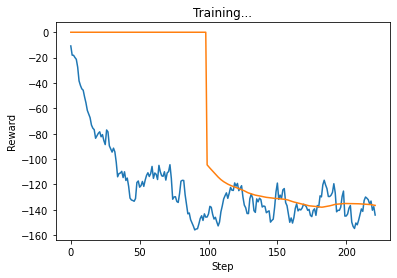

[49.93206521739133, 17.431055369612196, 23.138689395346397, 51.66721074573067]
[49.93206521739133, 17.431055369612196, 23.138689395346397, 51.66721074573067]
set0
show


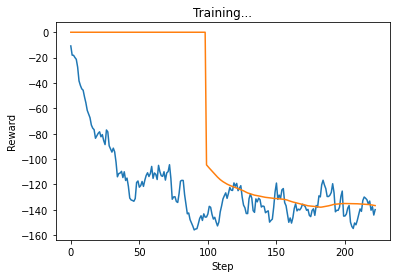

[49.93206521739133, 17.162693722718046, 22.31790552341515, 48.47709788212262]
show


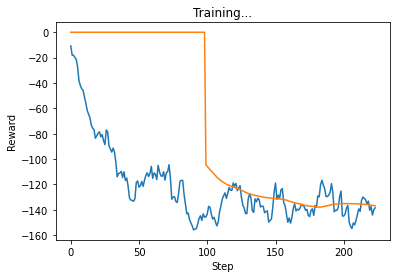

[49.93206521739133, 14.509136536165979, 20.79313661415026, 51.26167173408674]
[49.93206521739133, 14.509136536165979, 20.79313661415026, 51.26167173408674]
set0
show


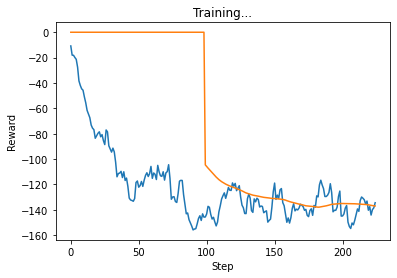

[49.93206521739133, 16.09868283504077, 18.699677858429077, 47.74459989217565]
show


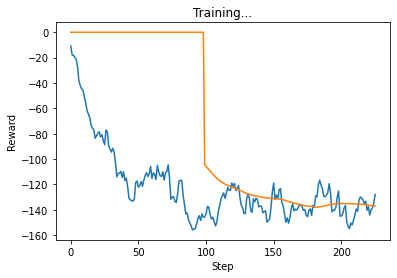

[49.93206521739133, 16.09868283504077, 15.469747129072536, 44.41637775870029]
show


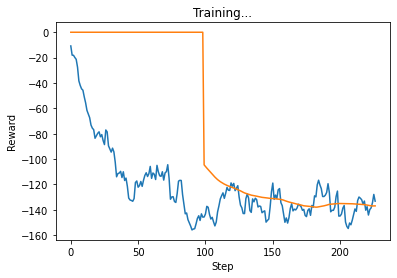

[49.93206521739133, 16.09868283504077, 20.8954559328028, 44.30503013065262]
show


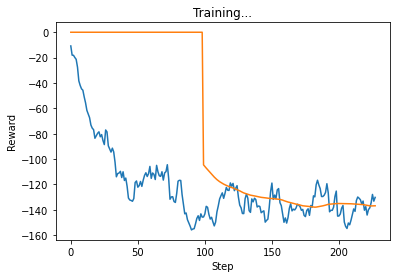

[49.93206521739133, 15.114641971184877, 22.496958379998805, 40.69590995388765]
show


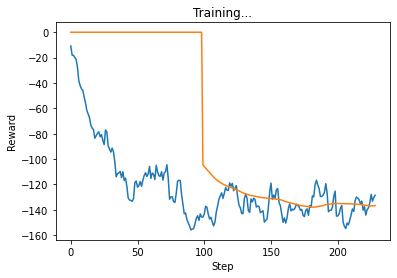

[49.93206521739133, 12.878946268032616, 22.11586587778192, 41.68585135639285]
show


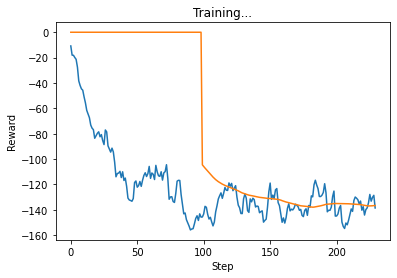

[49.93206521739133, 16.09868283504077, 25.924254027216485, 44.64406210887423]
show


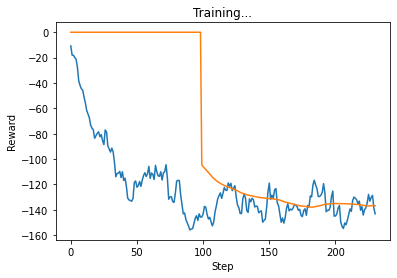

[49.93206521739133, 16.09868283504077, 27.290424246790813, 47.86223122834159]
show


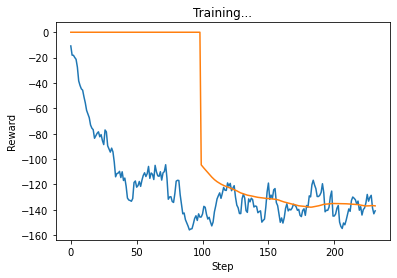

[49.93206521739133, 16.09868283504077, 27.316809386847822, 45.4950664676464]
show


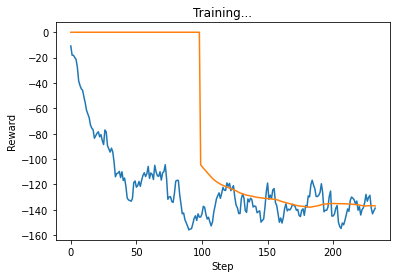

[49.93206521739133, 14.551437813803847, 27.42952910334753, 44.78345926876017]
show


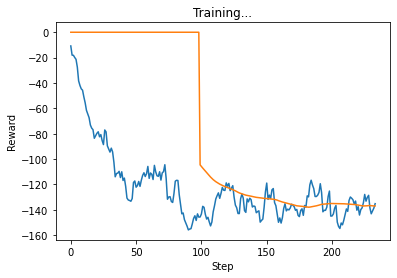

[49.93206521739133, 12.953623975968448, 28.028343262554454, 42.29479094312449]
show


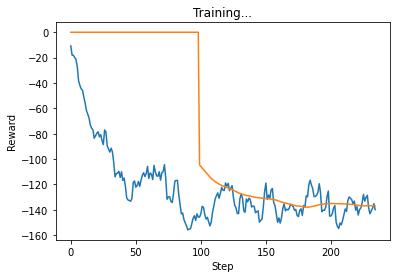

[49.93206521739133, 9.65920970102446, 37.0638338372261, 41.2903988934086]
show


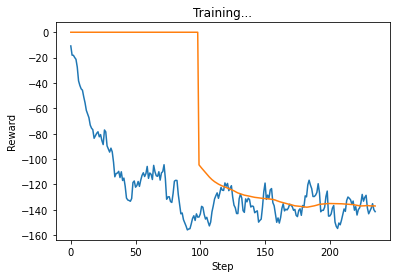

[51.358695652173935, 6.277221086899684, 35.47608865686025, 46.37571851950421]
[51.358695652173935, 6.277221086899684, 35.47608865686025, 46.37571851950421]
set0
show


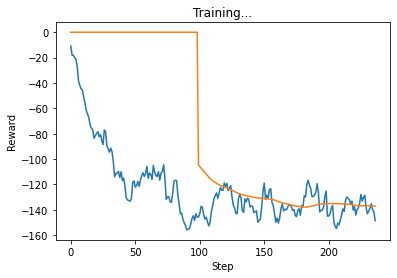

[51.358695652173935, 0.0, 45.918131553209605, 49.403518670322825]
show


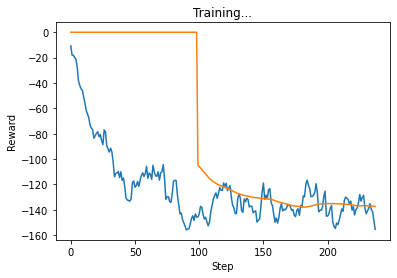

[54.211956521739154, 0.0, 44.43188655155782, 54.826273482620714]
show


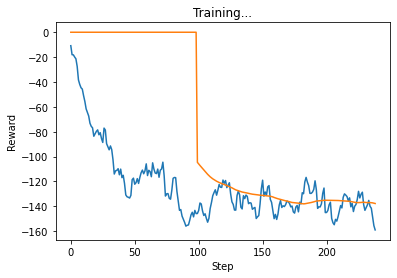

[57.06521739130438, 0.0, 43.19392691619131, 56.673142317016584]
[57.06521739130438, 0.0, 43.19392691619131, 56.673142317016584]
set0
show


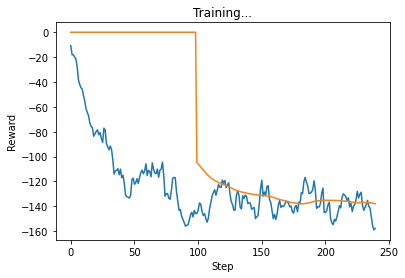

[58.974412201352166, 2.808560058310473, 41.50653634892718, 52.45906471151716]
show


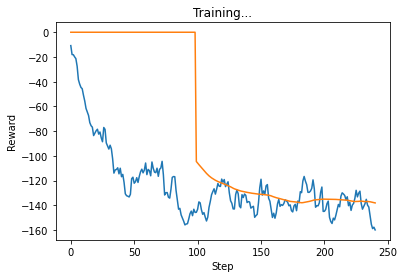

[62.31215425918586, 8.040564943728604, 38.19432647631439, 49.420852468711026]
[62.31215425918586, 8.040564943728604, 38.19432647631439, 49.420852468711026]
set0
show


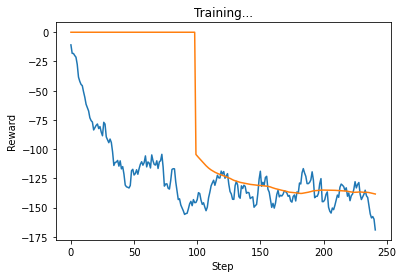

[64.19836956521743, 13.744548307033542, 35.24203668415322, 53.99286971973482]
show


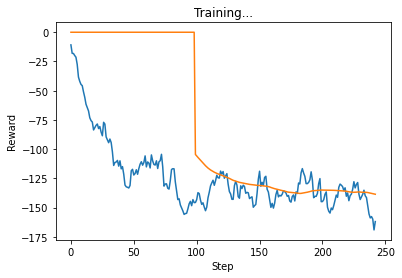

[64.19836956521743, 14.776518195385036, 31.079817095465554, 49.9829591076301]
[64.19836956521743, 14.776518195385036, 31.079817095465554, 49.9829591076301]
set0
show


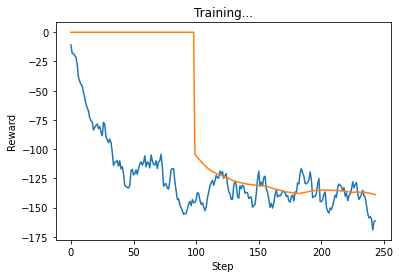

[63.04945829988259, 16.09868283504077, 28.98608693785781, 51.25548298789039]
show


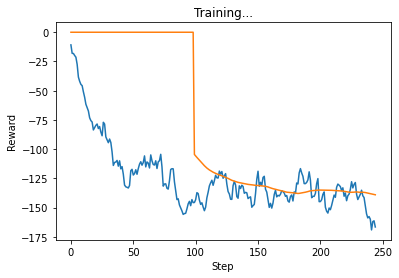

[62.771739130434824, 16.09868283504077, 32.08910893996166, 53.71018677667121]
[62.771739130434824, 16.09868283504077, 32.08910893996166, 53.71018677667121]
set0
show


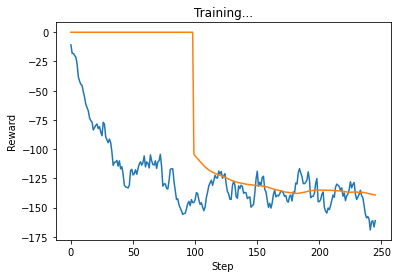

[62.771739130434824, 16.09868283504077, 29.59847545264408, 50.733078784629846]
show


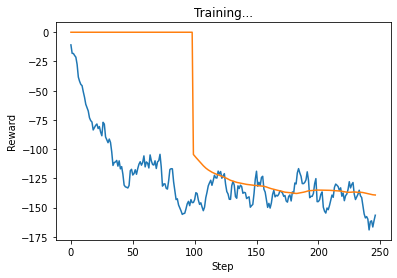

[62.771739130434824, 16.09868283504077, 27.7171485234678, 48.02663155265875]
[62.771739130434824, 16.09868283504077, 27.7171485234678, 48.02663155265875]
set0
show


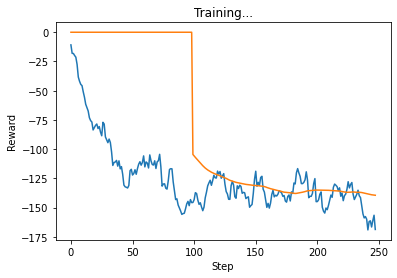

[62.771739130434824, 16.63876730370074, 38.90170679321737, 48.467080065670906]
show


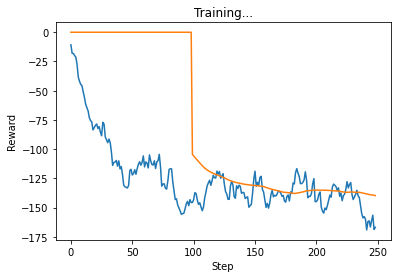

[62.771739130434824, 16.182455118425526, 34.73641195228967, 51.2519325013675]
[62.771739130434824, 16.182455118425526, 34.73641195228967, 51.2519325013675]
set0
show


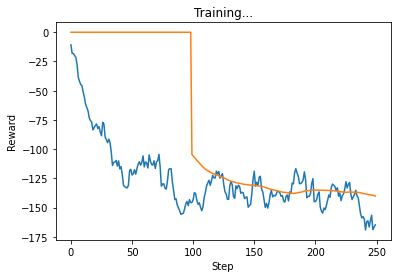

[62.771739130434824, 13.881523995877613, 34.294029448216705, 51.87852994614902]
show


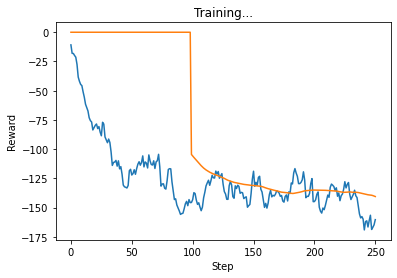

[62.771739130434824, 16.09868283504077, 33.33841111730778, 46.179524832454376]
show


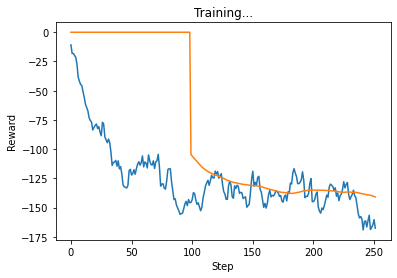

[62.771739130434824, 16.09868283504077, 42.24968633129516, 44.52853766974254]
[62.771739130434824, 16.09868283504077, 42.24968633129516, 44.52853766974254]
set0
show


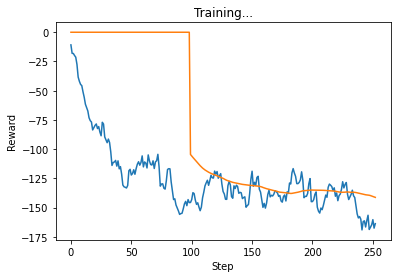

[62.771739130434824, 16.09868283504077, 40.76920527654957, 42.169582626177736]
show


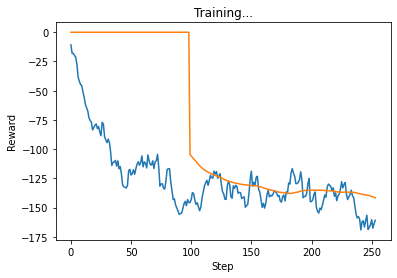

[62.771739130434824, 15.513615321522309, 39.7673907322752, 40.88089430544101]
[62.771739130434824, 15.513615321522309, 39.7673907322752, 40.88089430544101]
set0
show


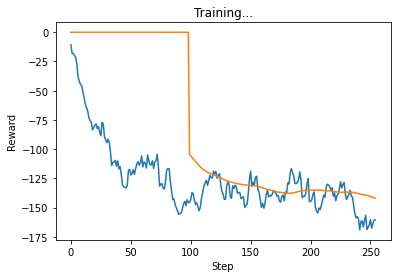

[62.771739130434824, 12.878946268032616, 37.306276753406394, 45.63371236082438]
show


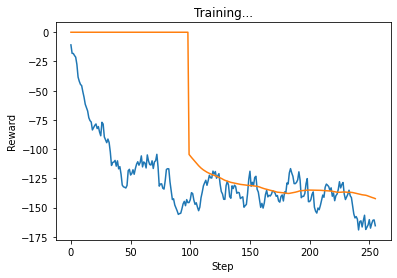

[62.771739130434824, 14.784463653782836, 34.53212926488704, 51.50470137328225]
[62.771739130434824, 14.784463653782836, 34.53212926488704, 51.50470137328225]
set0
show


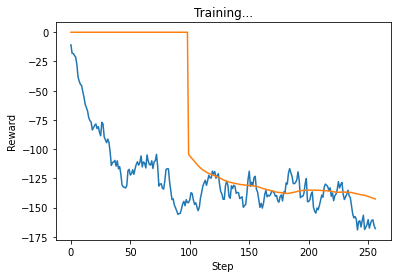

[62.771739130434824, 16.09868283504077, 40.832588813571036, 46.334645106967535]
show


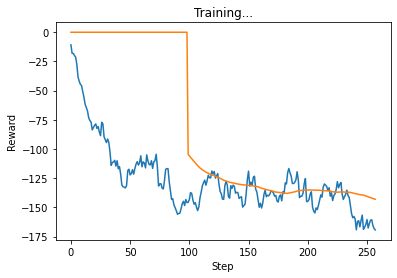

[64.19836956521743, 19.31841940204892, 43.96185680638533, 39.807308683833135]
[64.19836956521743, 19.31841940204892, 43.96185680638533, 39.807308683833135]
set0
show


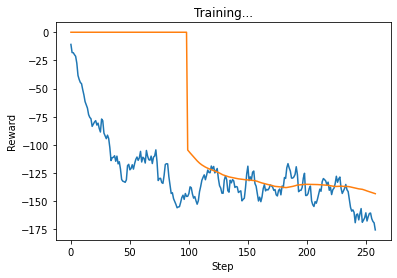

[64.19836956521743, 19.31841940204892, 44.97954804361021, 45.073690091628485]
show


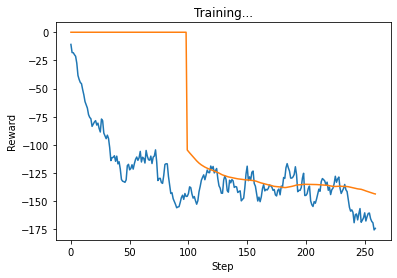

[64.19836956521743, 17.537006015430244, 46.073039535314294, 44.389792634706744]
[64.19836956521743, 17.537006015430244, 46.073039535314294, 44.389792634706744]
set0
show


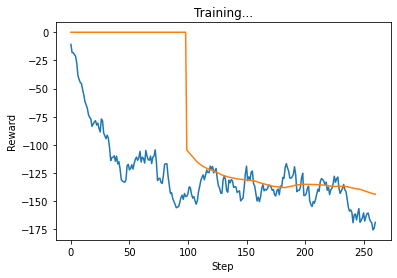

[64.19836956521743, 12.983953395455238, 45.23097533524758, 44.45602994406956]
show


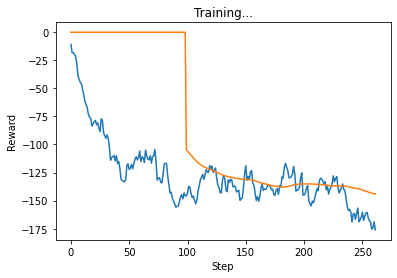

[64.19836956521743, 16.119577373690976, 44.66887081751004, 49.11964897796522]
[64.19836956521743, 16.119577373690976, 44.66887081751004, 49.11964897796522]
set0
show


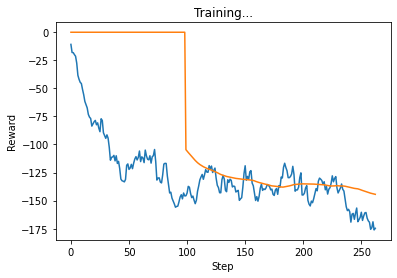

[64.19836956521743, 15.681964243822776, 45.007617913640956, 47.781110457543654]
show


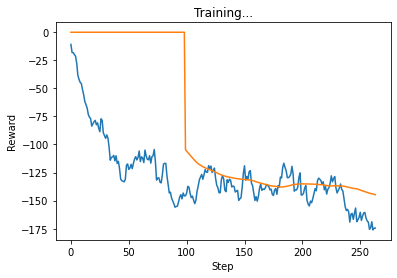

[64.19836956521743, 16.09868283504077, 48.63298793829398, 43.50501754193251]
show


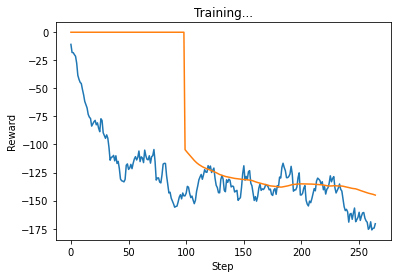

[64.19836956521743, 16.09868283504077, 46.6229479736006, 41.68728159273594]
[64.19836956521743, 16.09868283504077, 46.6229479736006, 41.68728159273594]
set0
show


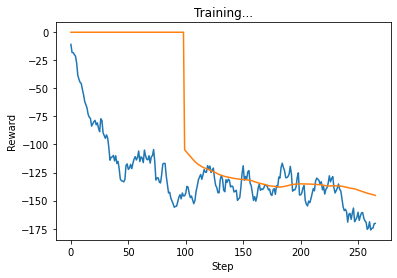

[64.19836956521743, 16.09868283504077, 46.95155680967041, 41.06046106920217]
show


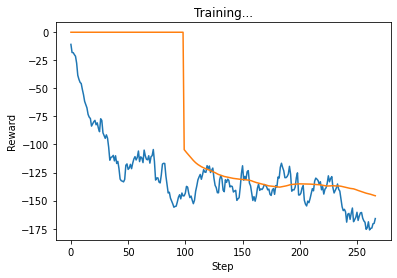

[64.19836956521743, 16.09868283504077, 44.64046627571136, 39.060922429598435]
[64.19836956521743, 16.09868283504077, 44.64046627571136, 39.060922429598435]
set0
show


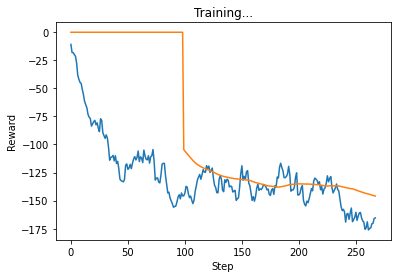

[64.19836956521743, 16.09868283504077, 45.14144872755993, 37.98381650180883]
show


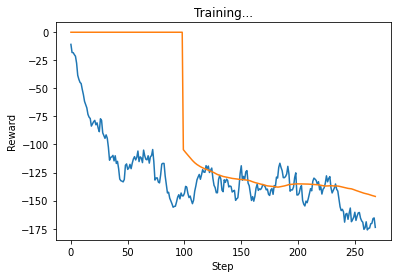

[64.19836956521743, 12.878946268032616, 53.49644048481475, 41.254232520806816]
[64.19836956521743, 12.878946268032616, 53.49644048481475, 41.254232520806816]
set0
show


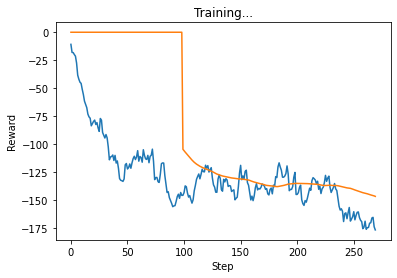

[64.19836956521743, 9.65920970102446, 51.78729704510001, 49.015301904816226]
[64.19836956521743, 9.65920970102446, 51.78729704510001, 49.015301904816226]
set2
show


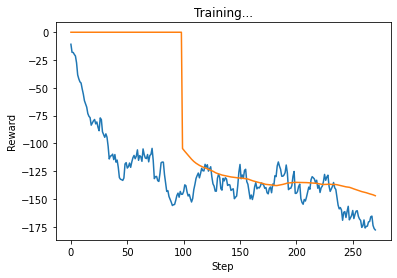

[64.19836956521743, 8.400796006382807, 49.32828722546158, 53.92623132784133]
show


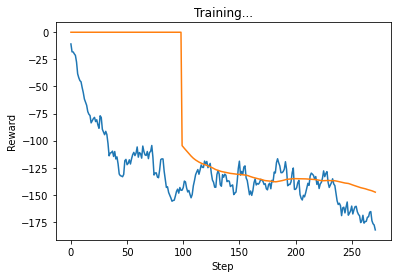

[64.19836956521743, 12.878946268032616, 48.16399552838596, 55.123999026290754]
show


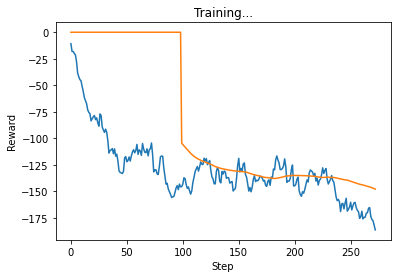

[65.62500000000004, 16.09868283504077, 46.30462998161368, 56.46226526081066]
[65.62500000000004, 16.09868283504077, 46.30462998161368, 56.46226526081066]
set0
show


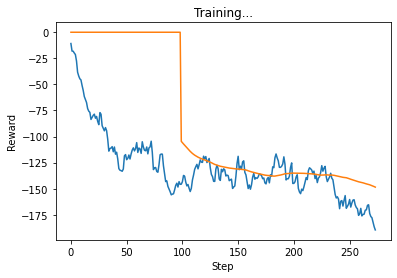

[65.62500000000004, 16.09868283504077, 47.353497480586284, 58.45613029206789]
show


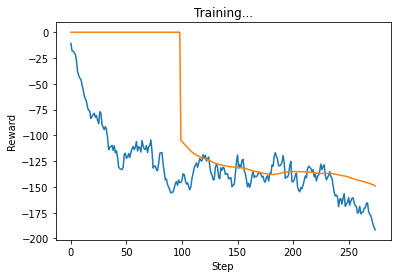

[65.62500000000004, 16.416055974053936, 48.10263604805285, 59.56684071399361]
[65.62500000000004, 16.416055974053936, 48.10263604805285, 59.56684071399361]
set0
show


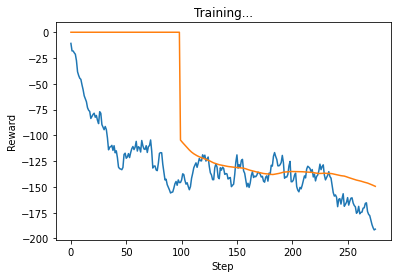

[65.40434083497674, 15.39150105784345, 47.09295062049046, 61.10084561468227]
show


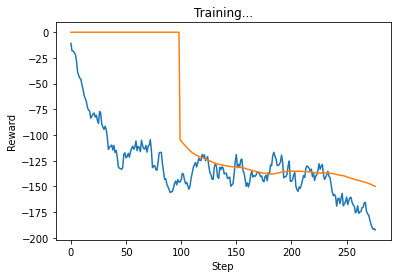

[64.19836956521743, 12.878946268032616, 51.41963152577921, 61.76144564792222]
[64.19836956521743, 12.878946268032616, 51.41963152577921, 61.76144564792222]
set0
show


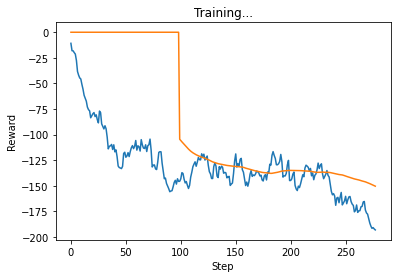

[64.19836956521743, 14.857214175028515, 50.39754060594228, 61.78826155784503]
[64.19836956521743, 14.857214175028515, 50.39754060594228, 61.78826155784503]
set2
show


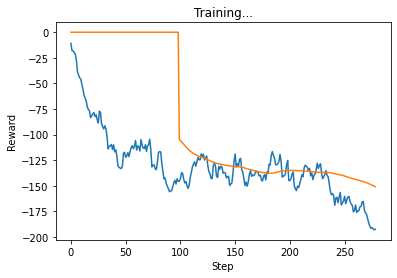

[64.19836956521743, 16.09868283504077, 48.4442597318277, 61.78826155784503]
show


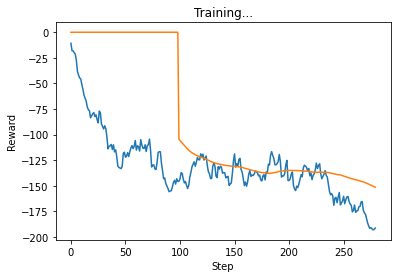

[64.19836956521743, 16.09868283504077, 47.345531020095024, 61.78826155784503]
show


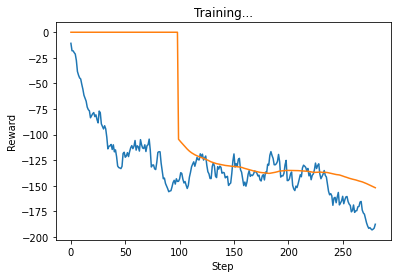

[64.19836956521743, 13.70230357056166, 46.01308934002898, 61.78826155784503]
[64.19836956521743, 13.70230357056166, 46.01308934002898, 61.78826155784503]
set0
show


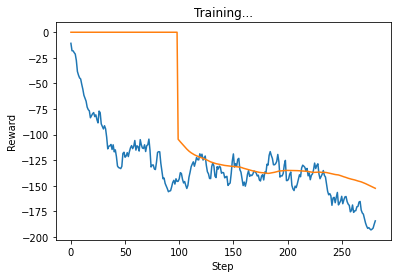

[64.19836956521743, 12.878946268032616, 43.53240521199456, 61.78826155784503]
show


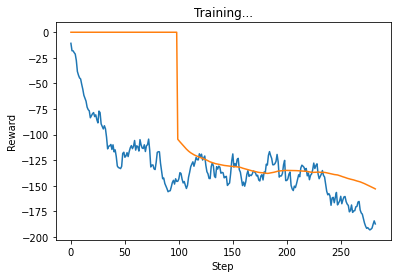

[64.19836956521743, 16.09868283504077, 43.30624659626325, 61.78826155784503]
[64.19836956521743, 16.09868283504077, 43.30624659626325, 61.78826155784503]
set0
show


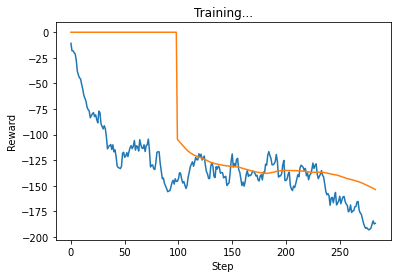

[64.19836956521743, 16.09868283504077, 45.282331895038, 59.226291835669024]
show


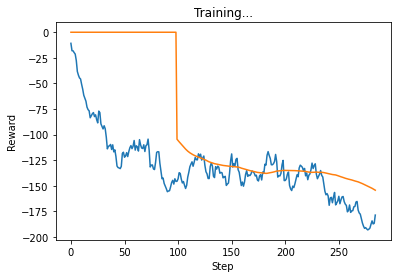

[64.19836956521743, 9.65920970102446, 43.661186233943624, 59.226291835669024]
[64.19836956521743, 9.65920970102446, 43.661186233943624, 59.226291835669024]
set0
show


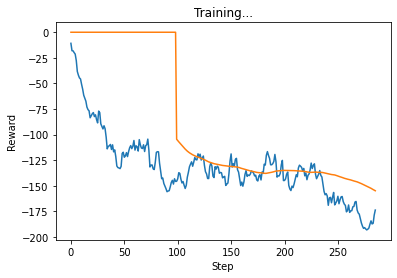

[64.19836956521743, 9.65920970102446, 42.061013828120814, 55.92194028461089]
show


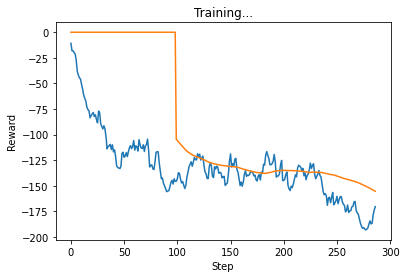

[64.19836956521743, 12.878946268032616, 38.57797618056971, 52.77360324455011]
[64.19836956521743, 12.878946268032616, 38.57797618056971, 52.77360324455011]
set0
show


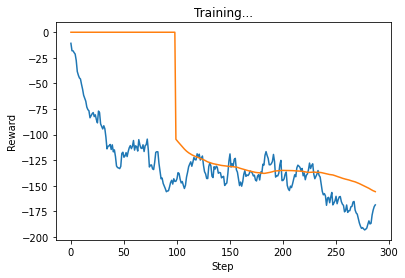

[64.19836956521743, 16.09868283504077, 35.831694987389746, 50.64423525539305]
show


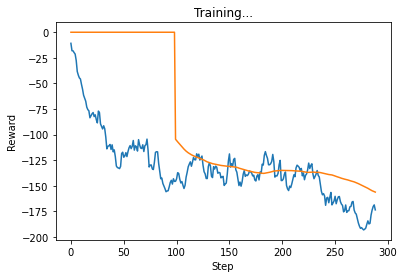

[64.19836956521743, 16.077872303437687, 43.88742732803452, 47.496398723888014]
[64.19836956521743, 16.077872303437687, 43.88742732803452, 47.496398723888014]
set0
show


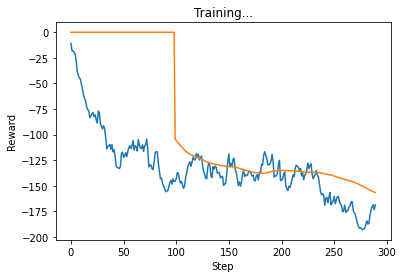

[64.19836956521743, 13.130177936464088, 45.76001530928427, 43.644992085425365]
show


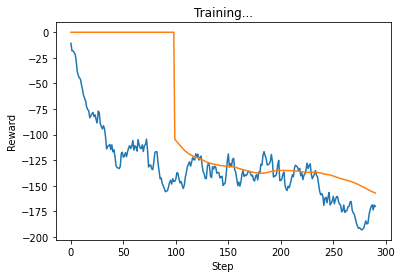

[64.19836956521743, 16.09868283504077, 44.860857236689114, 43.122518412303855]
[64.19836956521743, 16.09868283504077, 44.860857236689114, 43.122518412303855]
set0
show


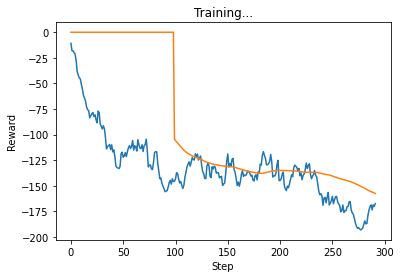

[64.19836956521743, 13.703529138273057, 45.45725773354553, 42.1605228500924]
show


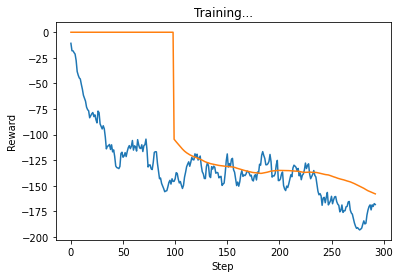

[65.62500000000004, 16.09868283504077, 44.43122231224133, 40.24416847783878]
show


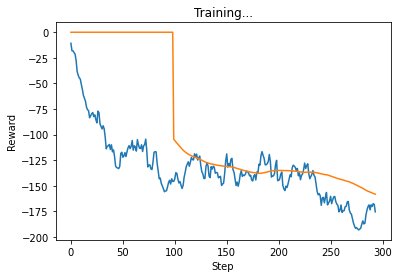

[65.62500000000004, 19.142215682394884, 47.65839377060702, 41.15052998400915]
[65.62500000000004, 19.142215682394884, 47.65839377060702, 41.15052998400915]
set0
show


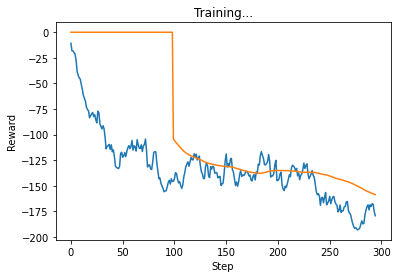

[65.62500000000004, 19.31841940204892, 49.10527956147574, 43.36267055643617]
show


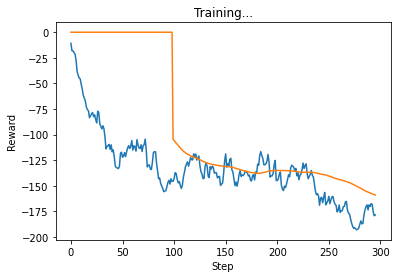

[65.62500000000004, 17.259048510798102, 49.040243059439604, 44.72760555254484]
[65.62500000000004, 17.259048510798102, 49.040243059439604, 44.72760555254484]
set0
show


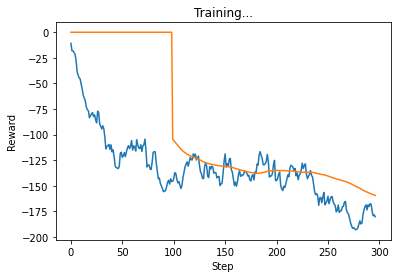

[65.62500000000004, 18.3625371284815, 49.01239573769505, 45.39147712858224]
show


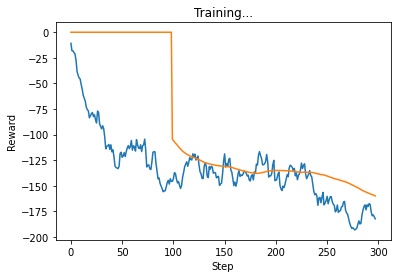

[65.62500000000004, 16.04481400888922, 53.203329827751375, 45.54593171339076]
[65.62500000000004, 16.04481400888922, 53.203329827751375, 45.54593171339076]
set0
show


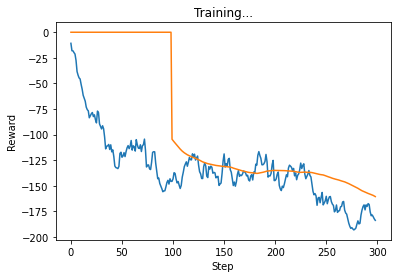

[65.62500000000004, 16.09868283504077, 53.35451612536202, 46.7967580876545]
[65.62500000000004, 16.09868283504077, 53.35451612536202, 46.7967580876545]
set2
show


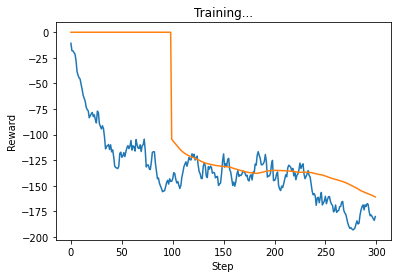

[65.62500000000004, 16.09868283504077, 52.410747585808366, 44.06152580068704]
show


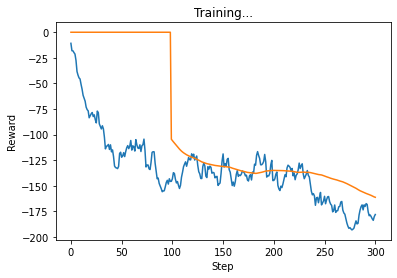

[65.62500000000004, 16.09868283504077, 50.71081479019465, 43.753334400083325]
[65.62500000000004, 16.09868283504077, 50.71081479019465, 43.753334400083325]
set2
show


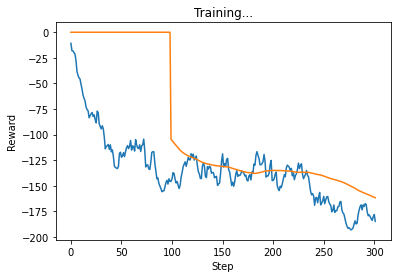

[65.62500000000004, 16.09868283504077, 49.111452739579036, 52.09273722479901]
show


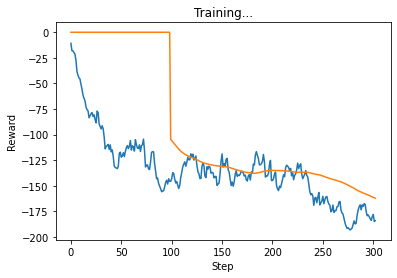

[65.62500000000004, 15.956293894210624, 46.265866381929996, 54.394066532940485]
show


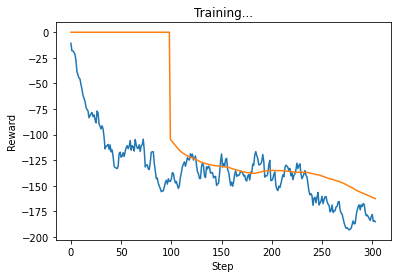

[65.62500000000004, 16.09868283504077, 44.76423748176942, 56.68308425532041]
[65.62500000000004, 16.09868283504077, 44.76423748176942, 56.68308425532041]
set0
show


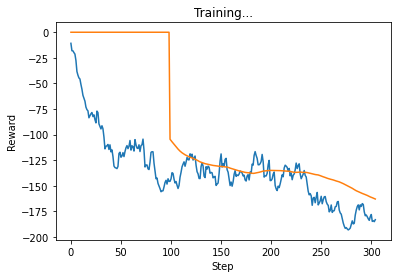

[65.62500000000004, 15.200258133441222, 42.6029783734056, 57.78818909685094]
show


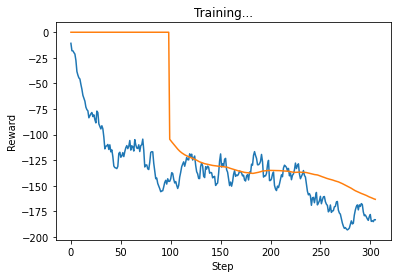

[65.62500000000004, 16.09868283504077, 40.603416456768116, 58.972772123666516]
[65.62500000000004, 16.09868283504077, 40.603416456768116, 58.972772123666516]
set0
show


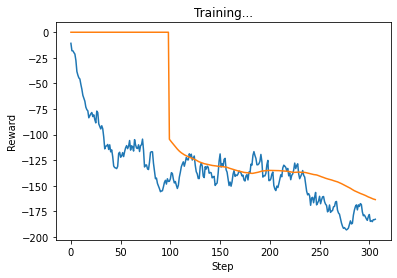

[65.62500000000004, 19.20320757185989, 38.46673098988924, 57.51822736530938]
show


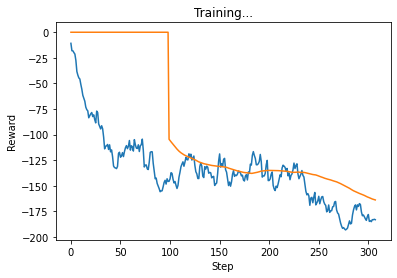

[65.62500000000004, 19.31841940204892, 43.18131431176452, 53.14023531684694]
[65.62500000000004, 19.31841940204892, 43.18131431176452, 53.14023531684694]
set0
show


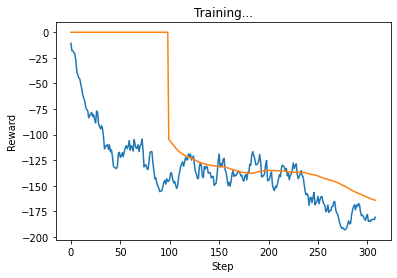

[65.62500000000004, 13.39874871959212, 42.494738252347396, 57.312391111200775]
show


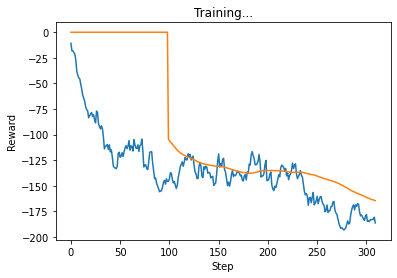

[65.564016063021, 16.09868283504077, 43.92888199845484, 58.84447321556386]
[65.564016063021, 16.09868283504077, 43.92888199845484, 58.84447321556386]
set0
show


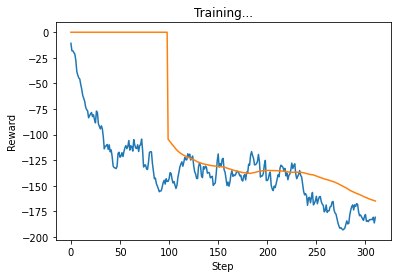

[64.4569188022417, 14.592418828074763, 43.162069930373306, 56.68083497298312]
show


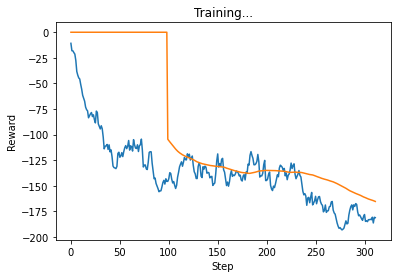

[64.19836956521743, 16.09868283504077, 49.8011839727923, 49.13935191355504]
[64.19836956521743, 16.09868283504077, 49.8011839727923, 49.13935191355504]
set0
show


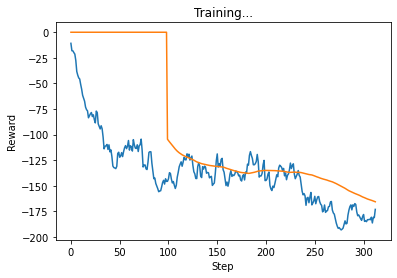

[64.19836956521743, 16.09868283504077, 50.29096466220877, 40.576933266594764]
[64.19836956521743, 16.09868283504077, 50.29096466220877, 40.576933266594764]
set2
show


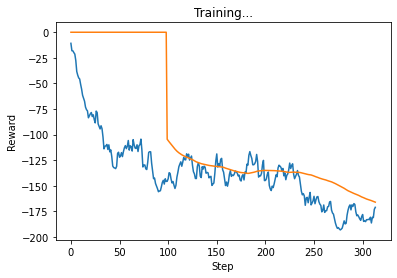

[64.19836956521743, 16.09868283504077, 49.16776968691121, 39.698023017382276]
show


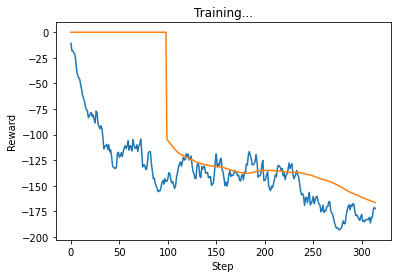

[64.19836956521743, 16.09868283504077, 50.383652292107655, 39.799062923016464]
[64.19836956521743, 16.09868283504077, 50.383652292107655, 39.799062923016464]
set2
show


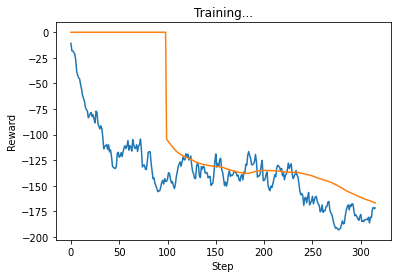

[63.045836291670966, 15.931190635483535, 50.87308434460131, 39.88338162810094]
show


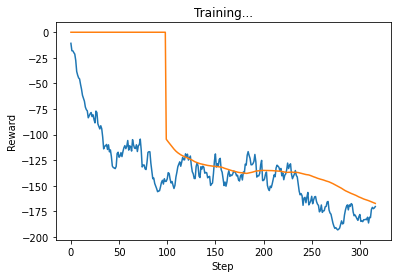

[62.771739130434824, 16.09868283504077, 47.109596138705285, 42.445012821892895]
show


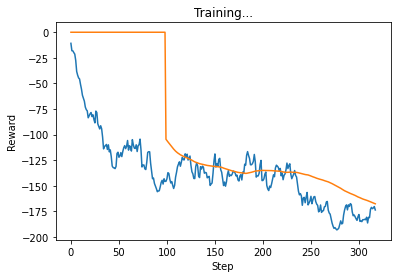

[62.771739130434824, 13.114748343999997, 45.85102975680533, 50.00785263485412]
[62.771739130434824, 13.114748343999997, 45.85102975680533, 50.00785263485412]
set0
show


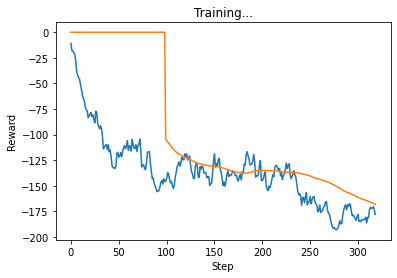

[62.771739130434824, 16.09868283504077, 44.293676968470976, 52.90257818243933]
show


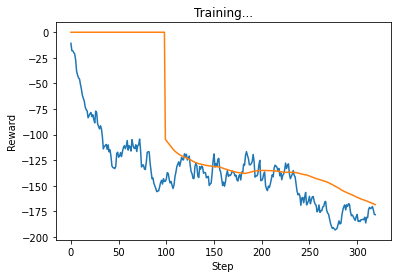

[62.771739130434824, 16.022025487482512, 42.388791614466896, 55.123999026290754]
[62.771739130434824, 16.022025487482512, 42.388791614466896, 55.123999026290754]
set0
show


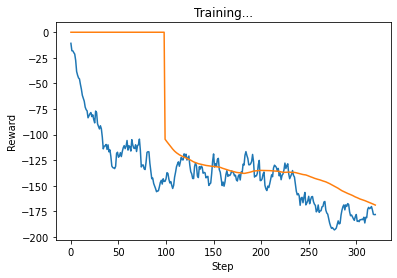

[62.771739130434824, 16.09868283504077, 40.56304282050244, 56.76454893953627]
show


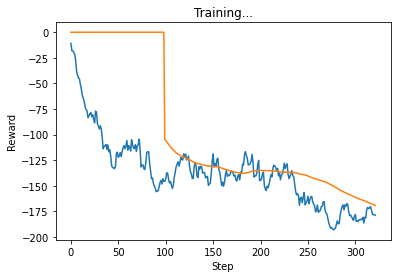

[62.771739130434824, 16.09868283504077, 39.67836152100235, 58.45613029206789]
[62.771739130434824, 16.09868283504077, 39.67836152100235, 58.45613029206789]
set0
show


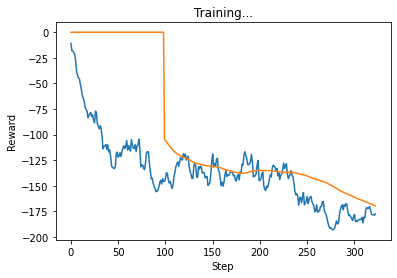

[62.771739130434824, 14.562029159068596, 40.13740234588262, 58.115581413743314]
show


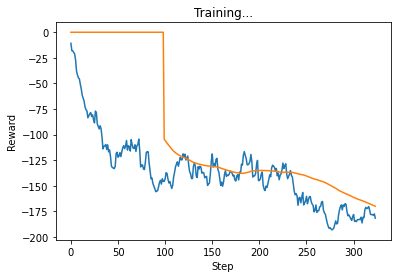

[61.888862170785885, 17.33605065803089, 43.34435425204535, 57.16602856011523]
[61.888862170785885, 17.33605065803089, 43.34435425204535, 57.16602856011523]
set0
show


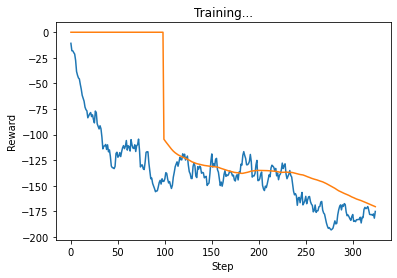

[62.771739130434824, 16.532550298710564, 44.93606249237499, 48.94552329685584]
show


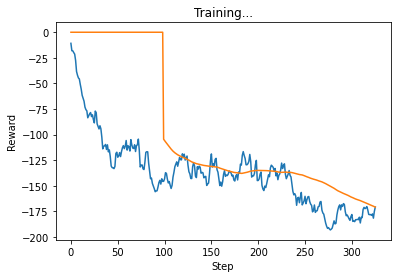

[62.771739130434824, 12.878946268032616, 45.66903731574145, 47.61074356457055]
[62.771739130434824, 12.878946268032616, 45.66903731574145, 47.61074356457055]
set0
show


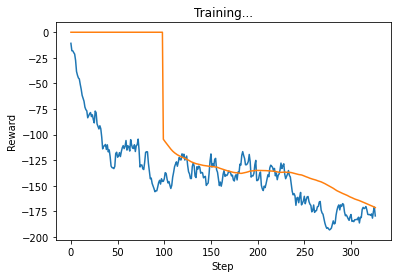

[62.771739130434824, 16.09868283504077, 48.265135738856266, 50.44213767432486]
show


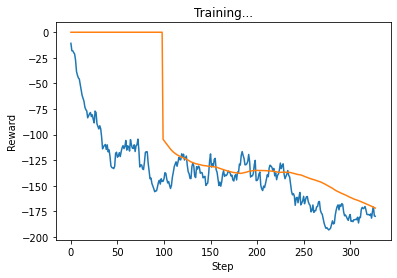

[62.771739130434824, 16.09868283504077, 49.1612541868907, 49.85708065765592]
[62.771739130434824, 16.09868283504077, 49.1612541868907, 49.85708065765592]
set0
show


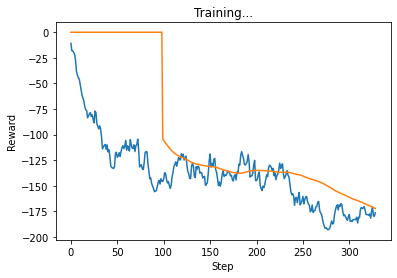

[62.771739130434824, 16.09868283504077, 48.92057495199644, 46.69884488510672]
show


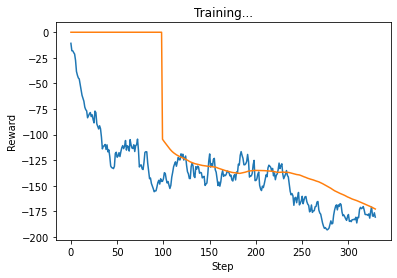

[62.771739130434824, 16.09868283504077, 48.42265955698467, 51.451318882189035]
show


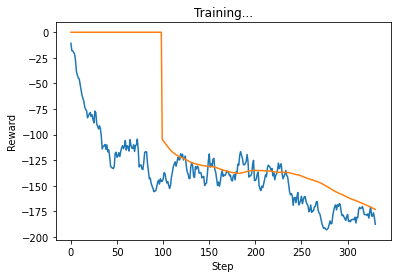

[62.771739130434824, 12.878946268032616, 51.87212931672279, 58.20376315539445]
[62.771739130434824, 12.878946268032616, 51.87212931672279, 58.20376315539445]
set0
show


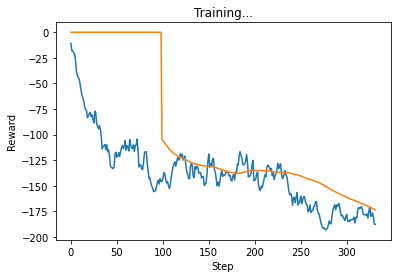

[62.771739130434824, 10.984832029493816, 52.08323768396879, 59.860418233704785]
[62.771739130434824, 10.984832029493816, 52.08323768396879, 59.860418233704785]
set2
show


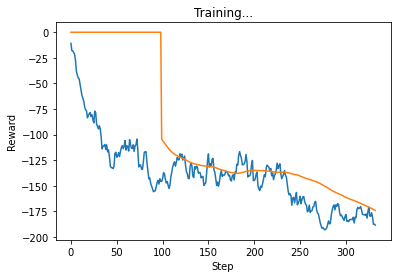

[62.771739130434824, 11.860111962152702, 50.33355743560706, 61.59740418498538]
show


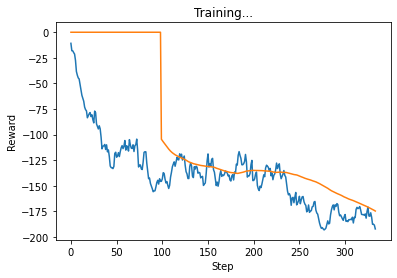

[62.771739130434824, 16.09868283504077, 49.27256452294062, 62.14530379628193]
show


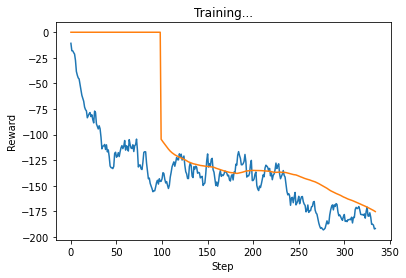

[62.771739130434824, 16.09868283504077, 49.27326143757104, 61.752626467486174]
[62.771739130434824, 16.09868283504077, 49.27326143757104, 61.752626467486174]
set0
show


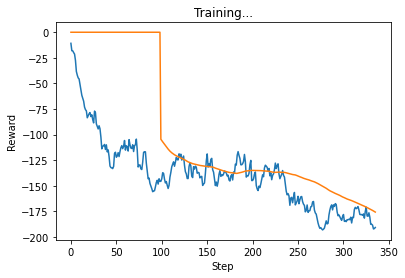

[61.345108695652215, 16.09868283504077, 49.944558921995345, 61.4744420118509]
show


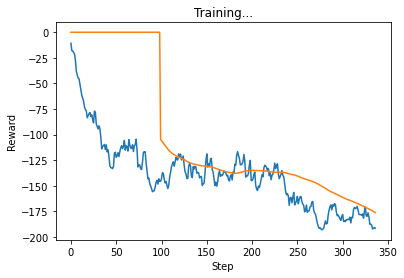

[61.345108695652215, 18.80651628115877, 47.673396465966206, 61.78826155784503]
[61.345108695652215, 18.80651628115877, 47.673396465966206, 61.78826155784503]
set0
show


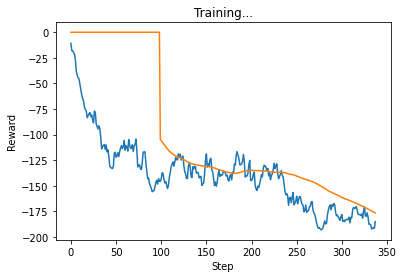

[61.345108695652215, 14.050787913449634, 46.19213442828081, 61.55541085608646]
show


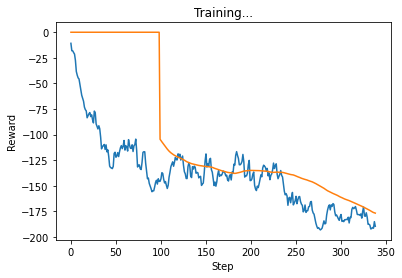

[61.345108695652215, 16.09868283504077, 46.07847934120561, 64.15611767530422]
[61.345108695652215, 16.09868283504077, 46.07847934120561, 64.15611767530422]
set0
show


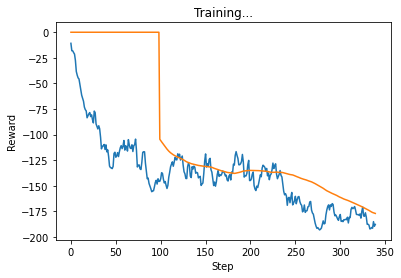

[61.345108695652215, 16.014732519852604, 46.58690228718762, 61.90514500919057]
show


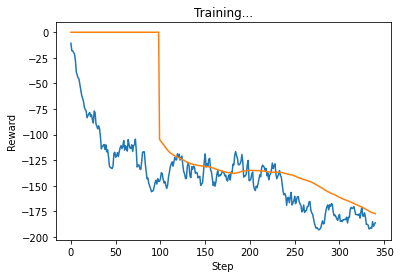

[61.345108695652215, 19.1301122113012, 44.63973914063492, 59.19069923627516]
[61.345108695652215, 19.1301122113012, 44.63973914063492, 59.19069923627516]
set0
show


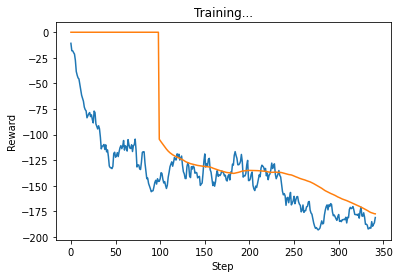

[62.771739130434824, 17.03058708478881, 46.536498590926314, 52.81307044571461]
show


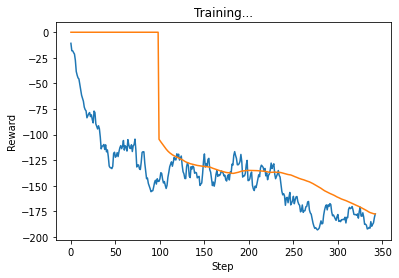

[62.771739130434824, 16.09868283504077, 48.42088477938724, 48.36068825875956]
[62.771739130434824, 16.09868283504077, 48.42088477938724, 48.36068825875956]
set0
show


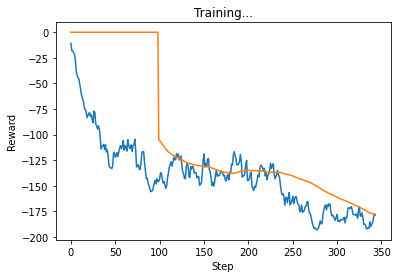

[62.771739130434824, 16.09868283504077, 49.044757326938615, 48.79717808838296]
show


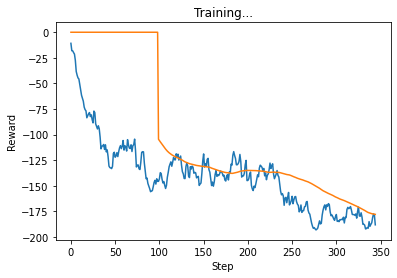

[62.771739130434824, 16.09868283504077, 48.97346347999005, 58.41793670951588]
[62.771739130434824, 16.09868283504077, 48.97346347999005, 58.41793670951588]
set0
show


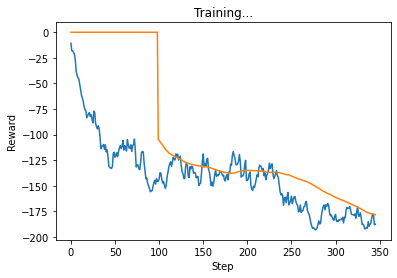

[62.771739130434824, 16.09868283504077, 48.3963051664263, 58.45613029206789]
show


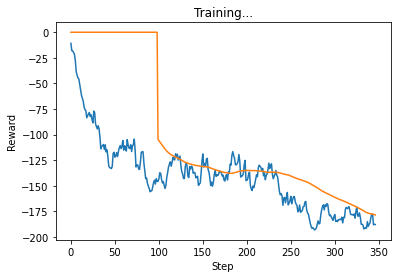

[62.771739130434824, 15.318624841405072, 49.451148342728516, 58.45613029206789]
show


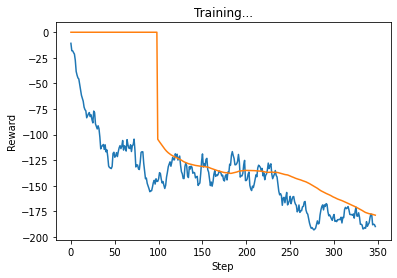

[62.771739130434824, 18.066647638360877, 48.617925086189416, 58.45613029206789]
[62.771739130434824, 18.066647638360877, 48.617925086189416, 58.45613029206789]
set0
show


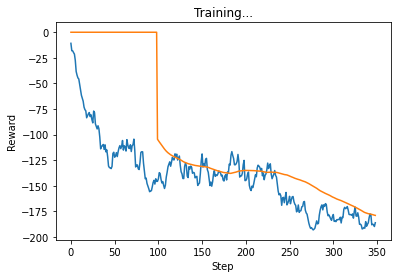

[62.771739130434824, 15.250833132466429, 46.63153551469951, 59.56684071399361]
show


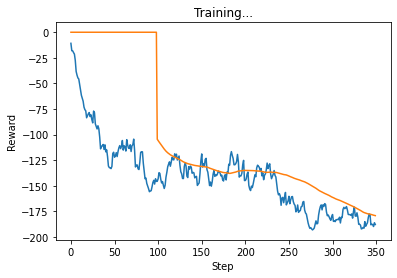

[62.771739130434824, 17.712561223484606, 44.81686778381166, 60.677551135919316]
[62.771739130434824, 17.712561223484606, 44.81686778381166, 60.677551135919316]
set0
show


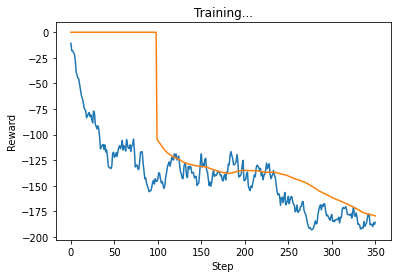

[61.53590073291855, 16.09868283504077, 44.82537557595599, 61.32373062786316]
show


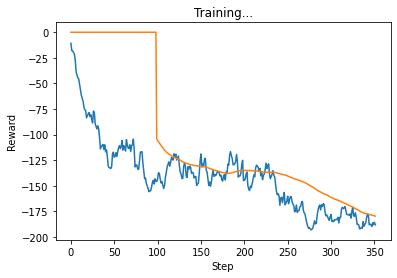

[61.345108695652215, 16.09868283504077, 47.01414162861652, 61.78826155784503]
[61.345108695652215, 16.09868283504077, 47.01414162861652, 61.78826155784503]
set0
show


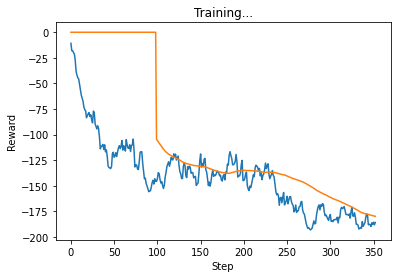

[61.345108695652215, 16.09868283504077, 44.70620235497761, 61.78826155784503]
show


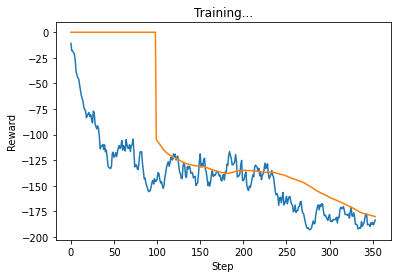

[61.345108695652215, 14.248827141487139, 44.15814522567297, 61.78826155784503]
[61.345108695652215, 14.248827141487139, 44.15814522567297, 61.78826155784503]
set0
show


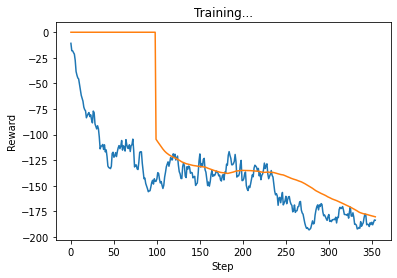

[61.345108695652215, 16.09868283504077, 42.53551304996258, 61.78826155784503]
show


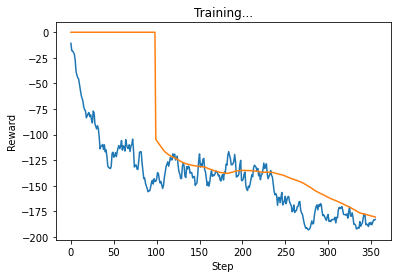

[61.345108695652215, 9.894517929664449, 47.850006931731514, 61.78826155784503]
[61.345108695652215, 9.894517929664449, 47.850006931731514, 61.78826155784503]
set0
show


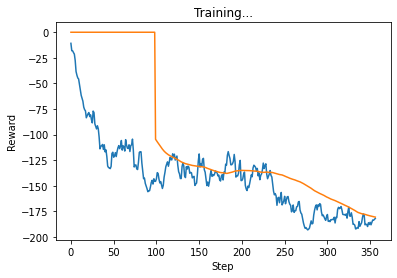

[61.345108695652215, 9.664126178234497, 47.27799945781971, 61.78826155784503]
show


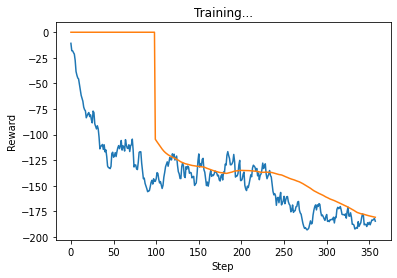

[61.345108695652215, 13.321385846901467, 46.26387070900881, 61.78826155784503]
[61.345108695652215, 13.321385846901467, 46.26387070900881, 61.78826155784503]
set0
show


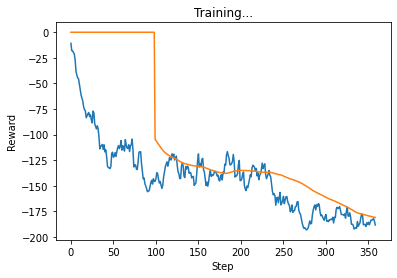

[62.771739130434824, 16.241457295246363, 45.619512328511355, 61.78826155784503]
show


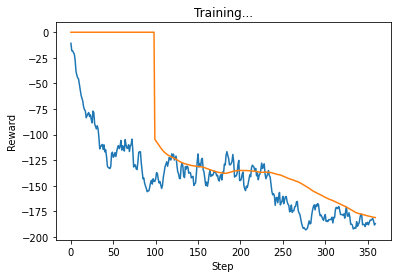

[62.771739130434824, 16.09868283504077, 44.50178215069897, 61.78826155784503]
show


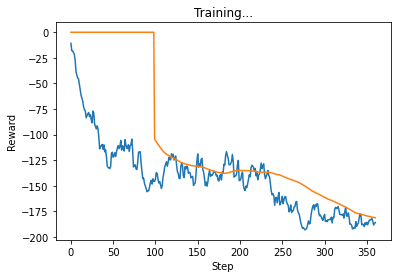

[62.771739130434824, 16.09868283504077, 43.39662474949334, 61.78826155784503]
[62.771739130434824, 16.09868283504077, 43.39662474949334, 61.78826155784503]
set0
show


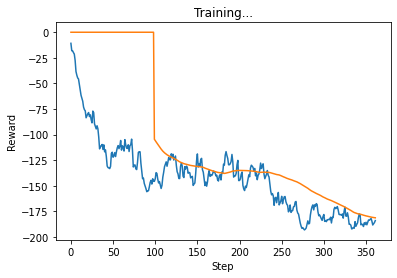

[62.771739130434824, 15.507260992871693, 42.0612211628427, 61.78826155784503]
show


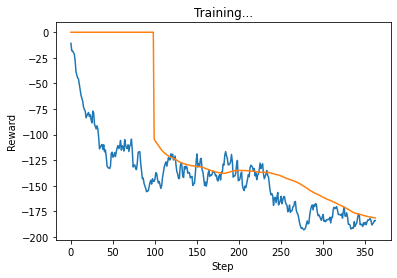

[62.771739130434824, 13.101009335135355, 44.46091085466992, 61.78826155784503]
[62.771739130434824, 13.101009335135355, 44.46091085466992, 61.78826155784503]
set0
show


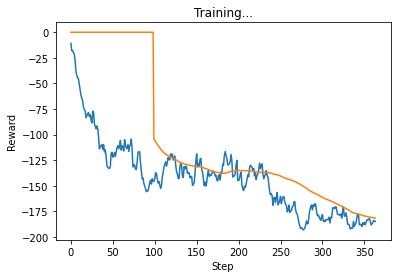

[62.771739130434824, 13.599600549419776, 44.970697764261445, 61.78826155784503]
show


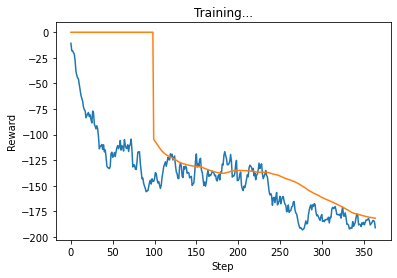

[62.771739130434824, 20.784542045607406, 44.43487307399732, 61.115754644201026]
[62.771739130434824, 20.784542045607406, 44.43487307399732, 61.115754644201026]
set0
show


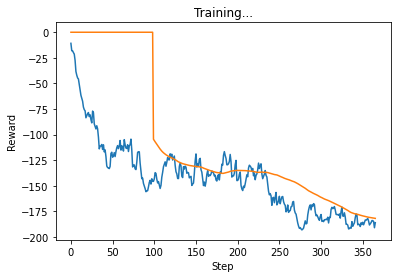

[64.19836956521743, 19.31841940204892, 43.88092202962983, 56.77749119589358]
show


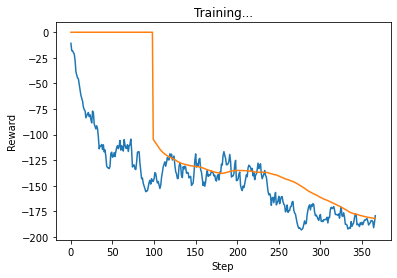

[64.19836956521743, 18.505529119819734, 42.204981564952455, 52.465262925300465]
[64.19836956521743, 18.505529119819734, 42.204981564952455, 52.465262925300465]
set0
show


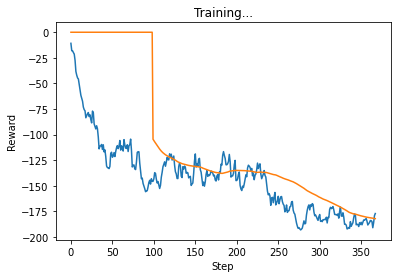

[64.19836956521743, 16.09868283504077, 48.74599691238548, 46.18523300445838]
show


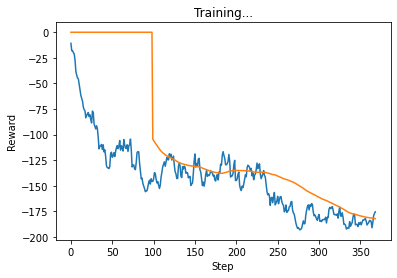

[64.19836956521743, 16.09868283504077, 47.89918742899438, 45.32567196415599]
[64.19836956521743, 16.09868283504077, 47.89918742899438, 45.32567196415599]
set0
show


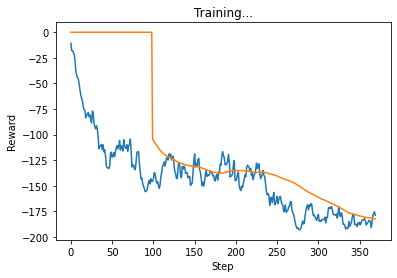

[64.19836956521743, 16.09868283504077, 48.440974659536614, 48.32298276094533]
show


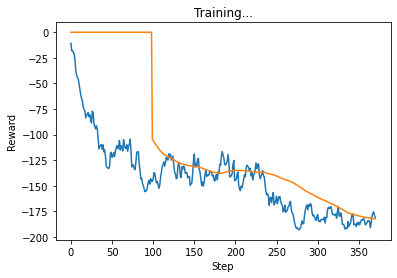

[64.19836956521743, 12.878946268032616, 51.84925385204041, 50.55311307659233]
[64.19836956521743, 12.878946268032616, 51.84925385204041, 50.55311307659233]
set0
show


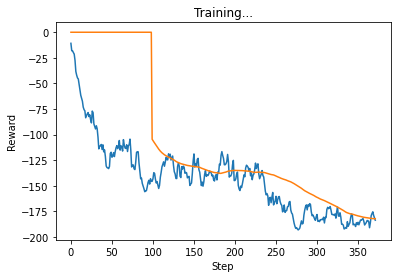

[64.19836956521743, 12.878946268032616, 50.46298410780174, 54.20714479289933]
show


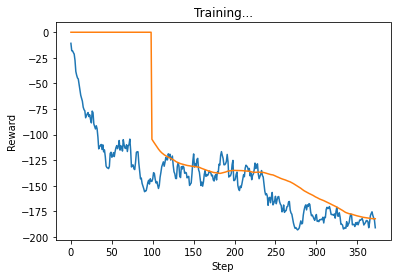

[64.19836956521743, 16.09868283504077, 49.789449803425185, 59.04352723164337]
show


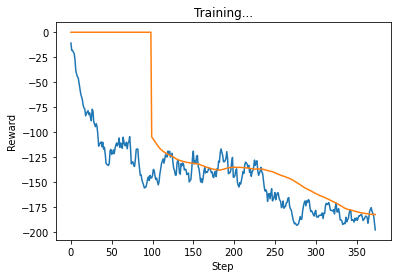

[65.62500000000004, 19.31841940204892, 49.87906679754066, 60.97497578070113]
[65.62500000000004, 19.31841940204892, 49.87906679754066, 60.97497578070113]
set0
show


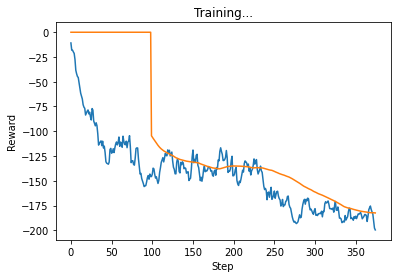

[65.62500000000004, 19.31841940204892, 49.47499045612429, 63.239196315146806]
show


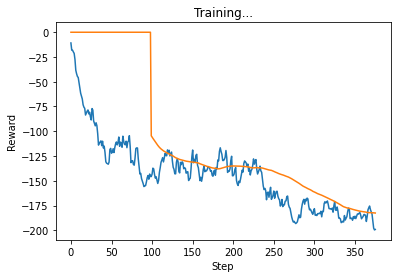

[65.62500000000004, 16.76696344467133, 50.44724275260134, 64.35528753202273]
[65.62500000000004, 16.76696344467133, 50.44724275260134, 64.35528753202273]
set0
show


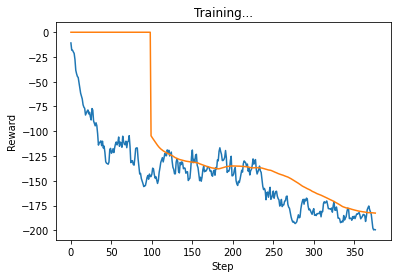

[65.62500000000004, 15.28854048386512, 50.80915519094509, 65.77465520336398]
[65.62500000000004, 15.28854048386512, 50.80915519094509, 65.77465520336398]
set2
show


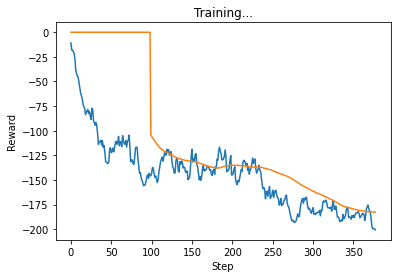

[65.44151417240917, 17.77050913860779, 48.95718425875707, 66.57752615908554]
show


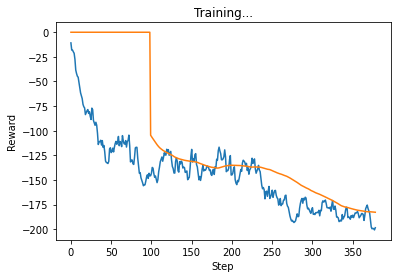

[64.19836956521743, 16.59505111983823, 50.67127350742959, 65.05362412632637]
[64.19836956521743, 16.59505111983823, 50.67127350742959, 65.05362412632637]
set2
show


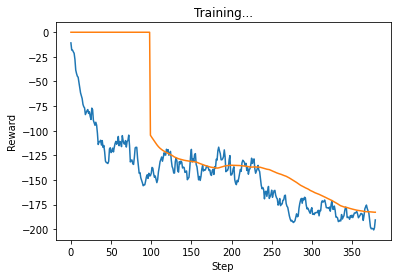

[64.19836956521743, 16.09868283504077, 48.314301915107734, 60.00454545577464]
show


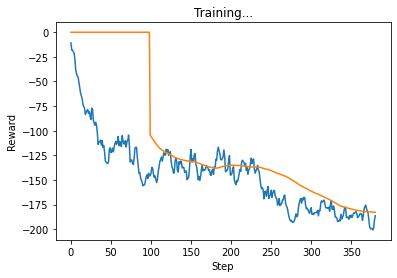

[64.19836956521743, 16.09868283504077, 47.576032978900244, 56.485809117570284]
show


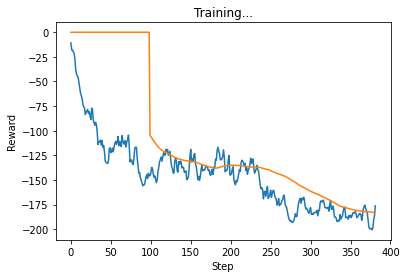

[64.19836956521743, 16.09868283504077, 43.145825305897034, 50.878845190370434]
[64.19836956521743, 16.09868283504077, 43.145825305897034, 50.878845190370434]
set0
show


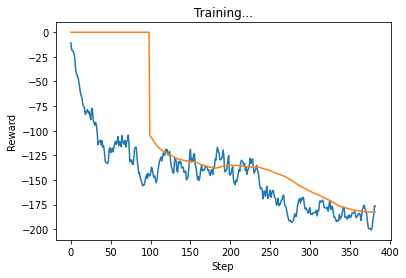

[64.19836956521743, 18.07656000186309, 43.25712169255564, 49.100110900794846]
show


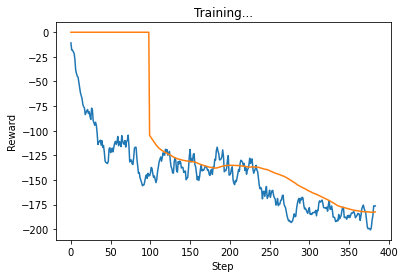

[64.19836956521743, 16.71620978723355, 41.56634220670679, 51.868058193912226]
[64.19836956521743, 16.71620978723355, 41.56634220670679, 51.868058193912226]
set0
show


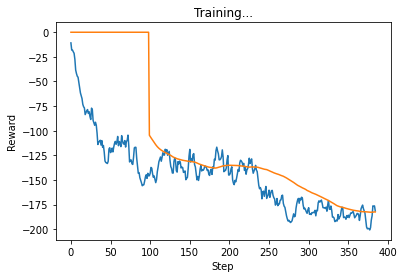

[64.19836956521743, 16.683268589341594, 42.4210097441169, 56.23470944821646]
show


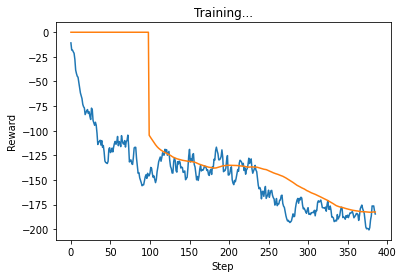

[64.19836956521743, 16.09868283504077, 44.28165153660103, 58.03121078791897]
[64.19836956521743, 16.09868283504077, 44.28165153660103, 58.03121078791897]
set0
show


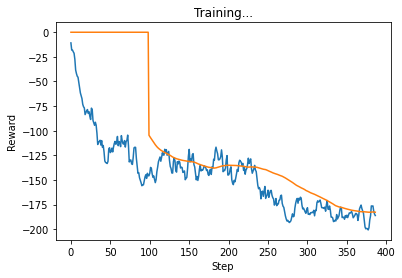

[64.19836956521743, 16.09868283504077, 43.14666697043013, 60.66569759193876]
show


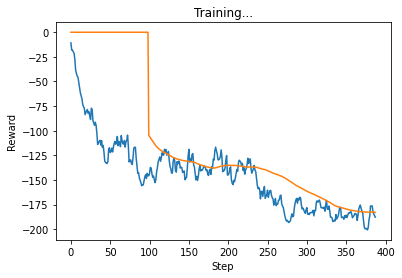

[64.19836956521743, 16.09868283504077, 43.38121048491733, 62.12922147591724]
[64.19836956521743, 16.09868283504077, 43.38121048491733, 62.12922147591724]
set0
show


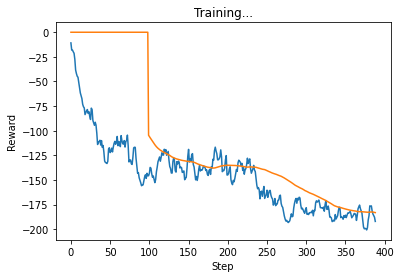

[64.19836956521743, 17.00350495808567, 45.65967462895839, 63.24533097200907]
show


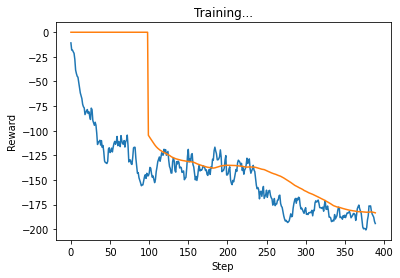

[64.19836956521743, 17.77965469102874, 45.10709592835558, 65.16353470578377]
[64.19836956521743, 17.77965469102874, 45.10709592835558, 65.16353470578377]
set0
show


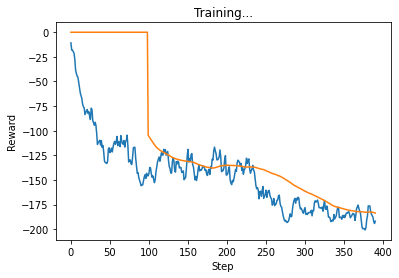

[64.19836956521743, 15.349040680971212, 44.232879460352024, 66.11136590210943]
show


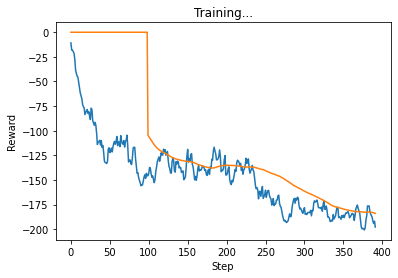

[64.11679923019634, 19.31841940204892, 45.81675555490712, 66.57757720189693]
[64.11679923019634, 19.31841940204892, 45.81675555490712, 66.57757720189693]
set0
show


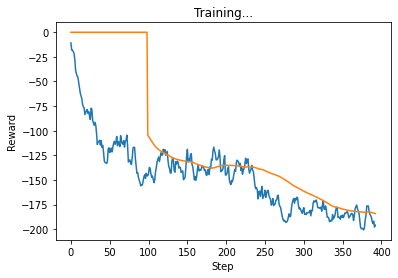

[64.24158337466088, 19.27447398913977, 42.967979395128324, 67.38534174123028]
show


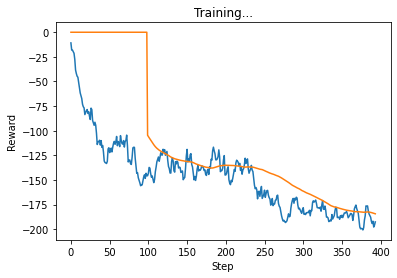

[64.19836956521743, 16.316593764087287, 42.40375378986339, 67.68828762382265]
show


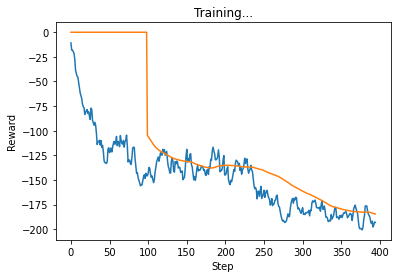

[64.19836956521743, 16.09868283504077, 43.17323063702942, 67.68828762382265]
[64.19836956521743, 16.09868283504077, 43.17323063702942, 67.68828762382265]
set0
show


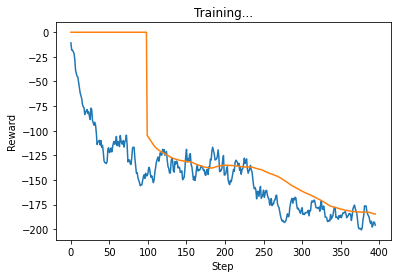

[64.19836956521743, 19.31841940204892, 42.74609734584074, 67.68840667836255]
show


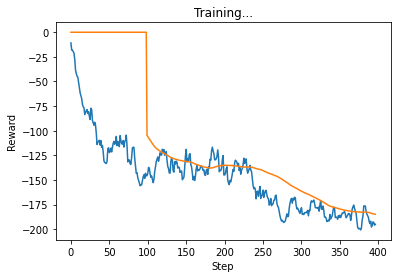

[64.19836956521743, 19.31841940204892, 41.822451961129374, 67.68840667836255]
[64.19836956521743, 19.31841940204892, 41.822451961129374, 67.68840667836255]
set0
show


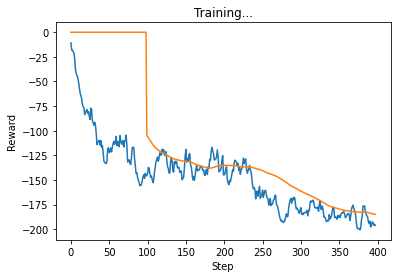

[64.19836956521743, 19.31841940204892, 42.846700648142175, 67.68840667836255]
show


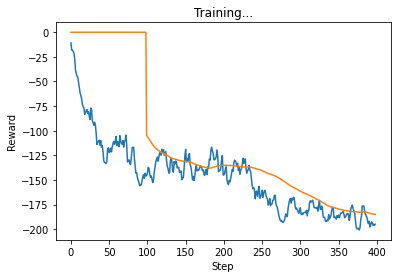

[64.19836956521743, 18.782118727369838, 42.80615205845069, 67.17064100239993]
[64.19836956521743, 18.782118727369838, 42.80615205845069, 67.17064100239993]
set0
show


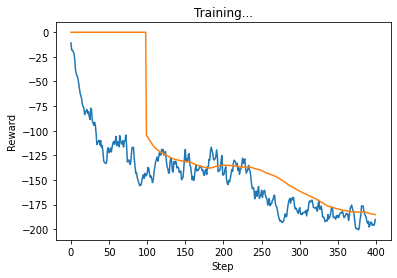

[64.19836956521743, 17.033505993862082, 42.81529908351477, 64.15691997805754]
show


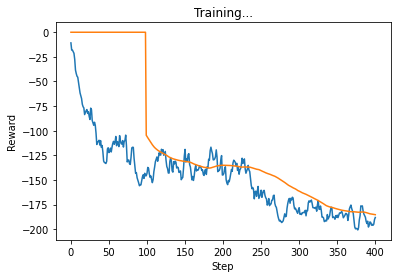

[64.19836956521743, 15.808343905753997, 43.25653457396604, 62.86345883532564]
[64.19836956521743, 15.808343905753997, 43.25653457396604, 62.86345883532564]
set0
show


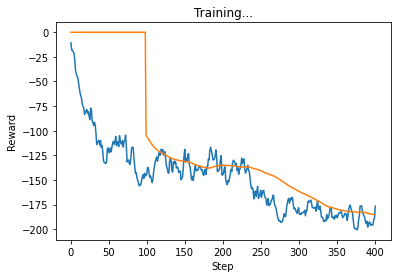

[64.19836956521743, 16.09868283504077, 43.19061341980133, 51.250689403165275]
show


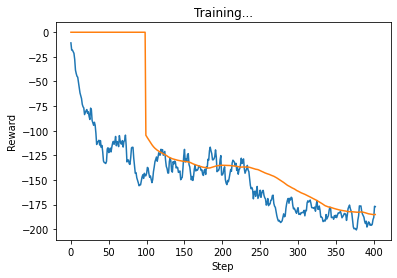

[64.19836956521743, 16.09868283504077, 48.221252495879114, 46.53224027436452]
[64.19836956521743, 16.09868283504077, 48.221252495879114, 46.53224027436452]
set0
show


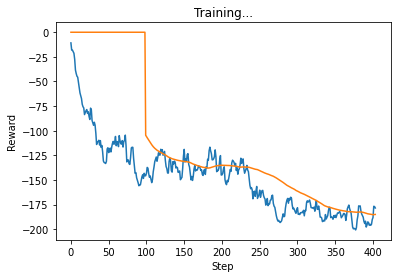

[64.19836956521743, 16.09868283504077, 47.282189841547314, 48.89373285976408]
show


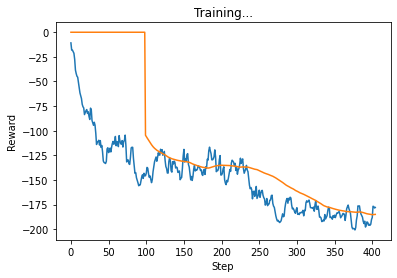

[64.19836956521743, 15.66057904257971, 49.17016005498391, 46.95456205715531]
[64.19836956521743, 15.66057904257971, 49.17016005498391, 46.95456205715531]
set0
show


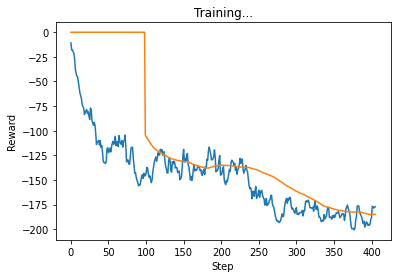

[64.19836956521743, 15.355498962316148, 49.30548200240662, 46.19439590456617]
show


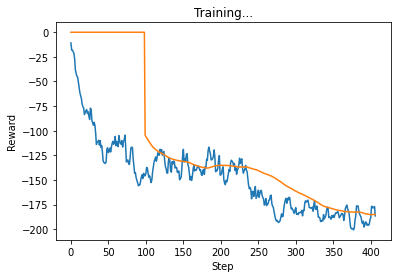

[64.19836956521743, 18.492565134287844, 48.31409861628545, 53.50299800912578]
show


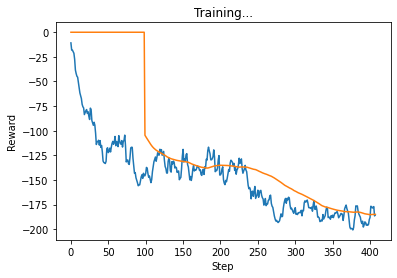

[64.19836956521743, 16.09868283504077, 46.87501251106916, 56.23470944821646]
[64.19836956521743, 16.09868283504077, 46.87501251106916, 56.23470944821646]
set0
show


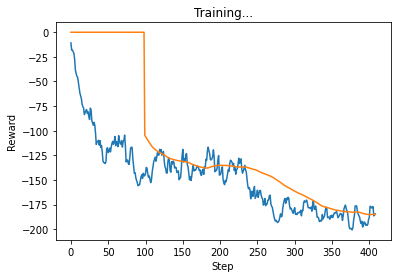

[64.19836956521743, 16.09868283504077, 44.907398331674884, 57.34541987014217]
show


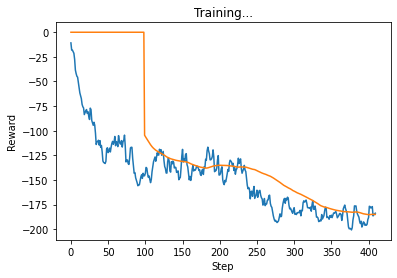

[64.19836956521743, 16.09868283504077, 43.03101699775947, 58.45613029206789]
[64.19836956521743, 16.09868283504077, 43.03101699775947, 58.45613029206789]
set0
show


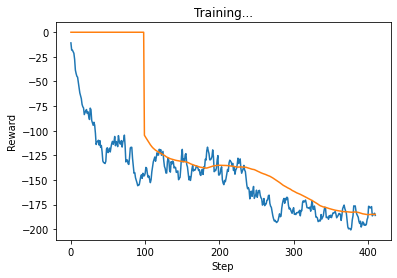

[64.19836956521743, 16.09868283504077, 44.161159028441496, 59.56684071399361]
show


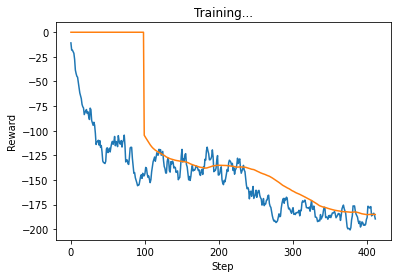

[64.19836956521743, 19.31841940204892, 43.40746107468236, 60.650982882754505]
[64.19836956521743, 19.31841940204892, 43.40746107468236, 60.650982882754505]
set0
show


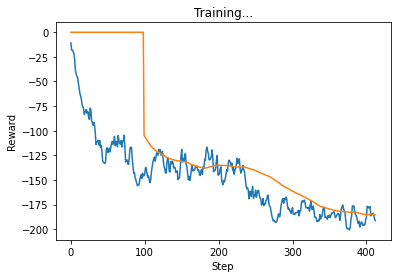

[65.20837948430459, 19.31841940204892, 43.94920345009615, 60.84232744958757]
show


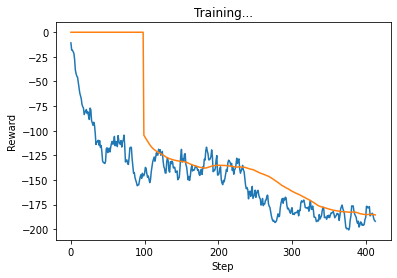

[64.19836956521743, 19.030638311373938, 45.14688357484197, 61.565288483969105]
[64.19836956521743, 19.030638311373938, 45.14688357484197, 61.565288483969105]
set0
show


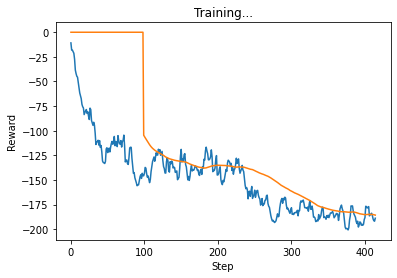

[64.19836956521743, 16.09868283504077, 44.77618824414962, 61.78826155784503]
show


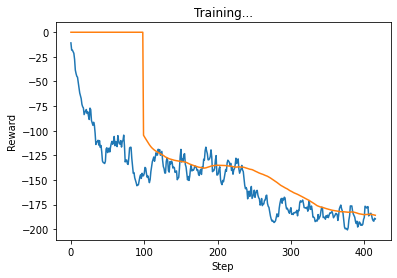

[64.19836956521743, 15.050962127624043, 46.55980771299117, 61.78826155784503]
[64.19836956521743, 15.050962127624043, 46.55980771299117, 61.78826155784503]
set0
show


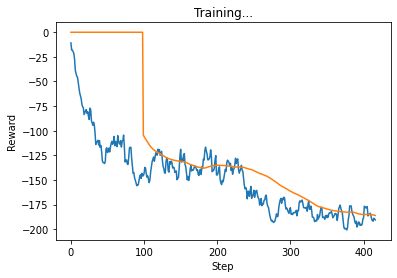

[64.19836956521743, 13.497154808864426, 49.13046892817087, 61.78826155784503]
show


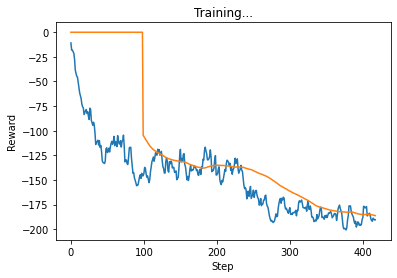

[64.19836956521743, 12.878946268032616, 49.61188474330052, 61.78826155784503]
[64.19836956521743, 12.878946268032616, 49.61188474330052, 61.78826155784503]
set0
show


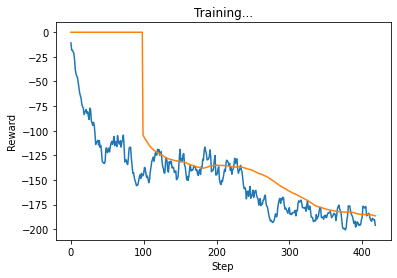

[64.19836956521743, 19.31841940204892, 48.77433430605053, 61.78826155784503]
show


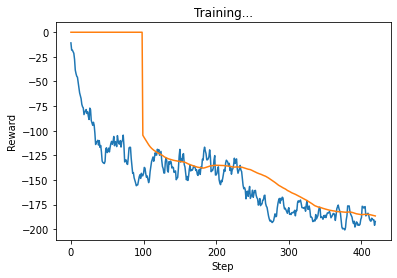

[64.19836956521743, 16.09868283504077, 48.07080374214584, 61.78826155784503]
show


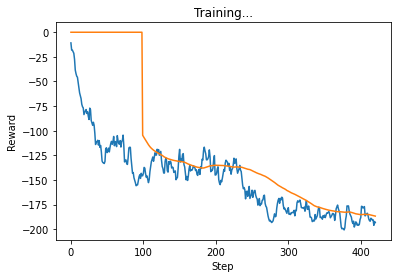

[64.19836956521743, 18.125069460842656, 47.24760981040015, 61.78826155784503]
[64.19836956521743, 18.125069460842656, 47.24760981040015, 61.78826155784503]
set0
show


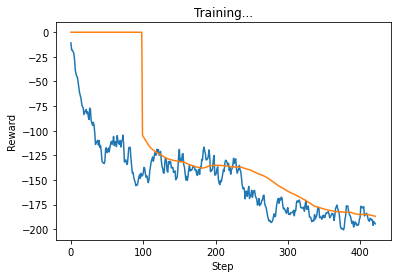

[64.19836956521743, 15.616583634724426, 51.02782957314514, 61.78826155784503]
[64.19836956521743, 15.616583634724426, 51.02782957314514, 61.78826155784503]
set2
show


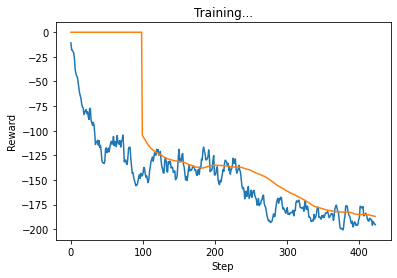

[64.19836956521743, 16.09868283504077, 51.38408049115179, 61.78826155784503]
show


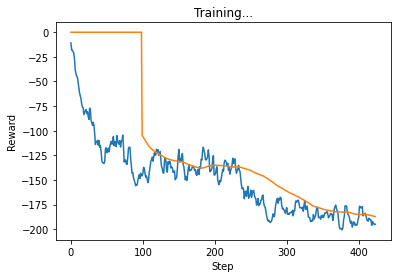

[64.19836956521743, 16.09868283504077, 50.89886528706811, 61.78826155784503]
[64.19836956521743, 16.09868283504077, 50.89886528706811, 61.78826155784503]
set2
show


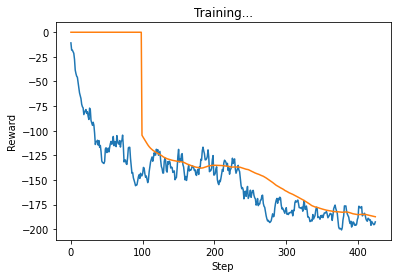

[64.19836956521743, 16.09868283504077, 48.519689958427115, 61.78826155784503]
show


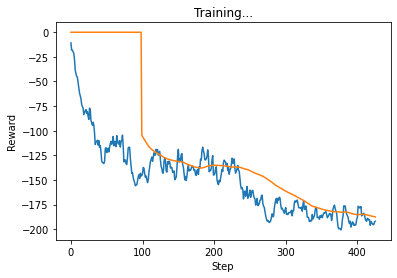

[64.19836956521743, 19.31841940204892, 44.65461103511596, 61.78826155784503]
show


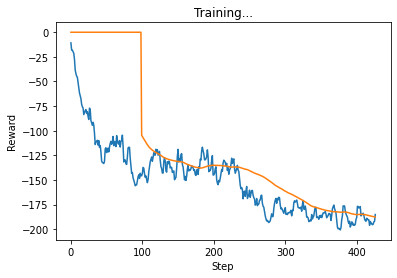

[64.19836956521743, 16.201657143773083, 40.94288486856536, 61.78826155784503]
[64.19836956521743, 16.201657143773083, 40.94288486856536, 61.78826155784503]
set0
show


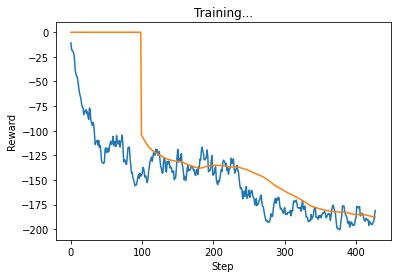

[64.19836956521743, 16.09868283504077, 38.7903752192537, 60.0143454171096]
show


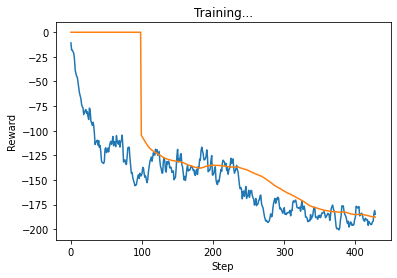

[64.19836956521743, 19.142661948977867, 42.523796027539696, 56.9802501120458]
[64.19836956521743, 19.142661948977867, 42.523796027539696, 56.9802501120458]
set0
show


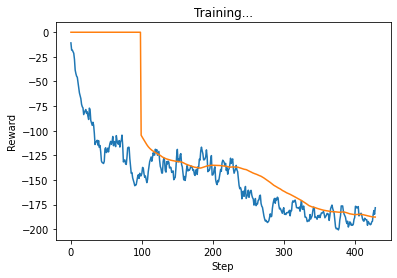

[65.62500000000004, 16.829939344903398, 43.486465917355545, 50.28669332293246]
show


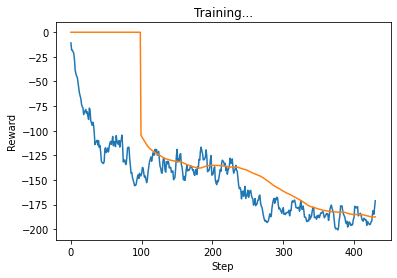

[65.62500000000004, 16.09868283504077, 43.84034044820363, 43.59292074614646]
[65.62500000000004, 16.09868283504077, 43.84034044820363, 43.59292074614646]
set0
show


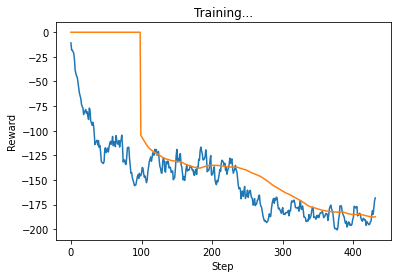

[65.62500000000004, 12.878946268032616, 42.006780175013006, 45.759017968866864]
show


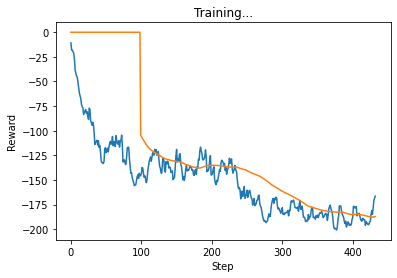

[65.62500000000004, 12.878946268032616, 39.65375052008302, 46.328186719322304]
[65.62500000000004, 12.878946268032616, 39.65375052008302, 46.328186719322304]
set0
show


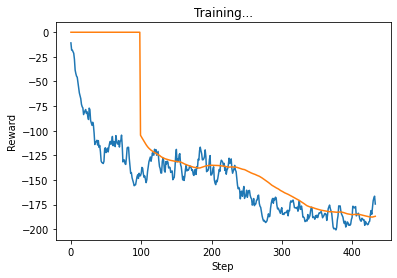

[65.62500000000004, 16.09868283504077, 45.918568624649374, 44.836370983337694]
show


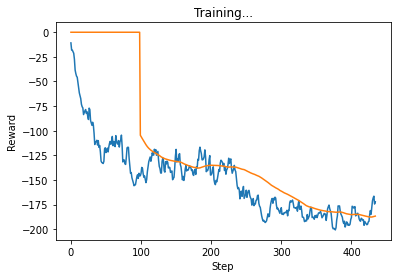

[65.62500000000004, 15.924553516854814, 44.428566745509016, 44.20657690668759]
[65.62500000000004, 15.924553516854814, 44.428566745509016, 44.20657690668759]
set0
show


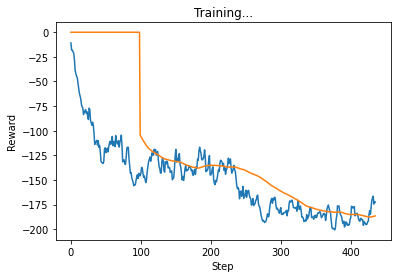

[65.62500000000004, 16.09868283504077, 46.17257008954502, 42.52517644092635]
show


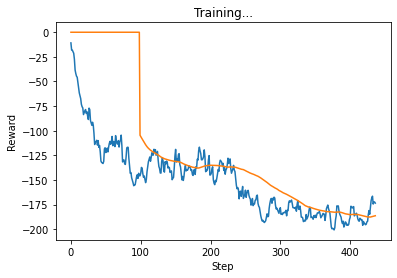

[65.62500000000004, 16.137823834925598, 44.33783355719409, 45.43405161047138]
[65.62500000000004, 16.137823834925598, 44.33783355719409, 45.43405161047138]
set0
show


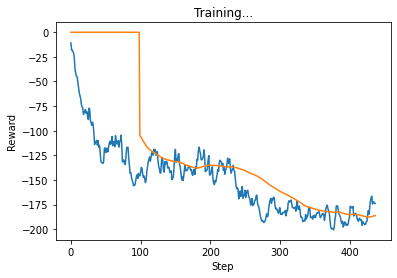

[65.62500000000004, 16.72619951008066, 44.04082170885334, 45.55012885968813]
show


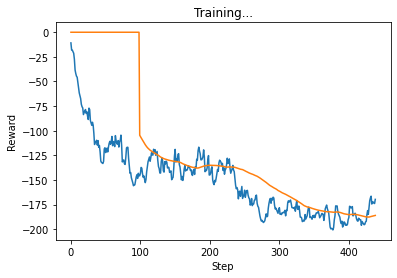

[65.62500000000004, 15.467270158550898, 44.037018773500066, 42.58323108292654]
show


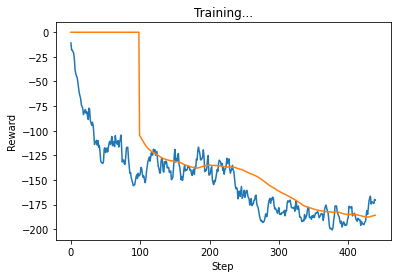

[65.62500000000004, 15.21168319310687, 43.0693360907313, 44.5238185940662]
[65.62500000000004, 15.21168319310687, 43.0693360907313, 44.5238185940662]
set0
show


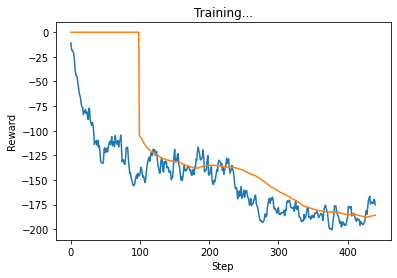

[65.62500000000004, 16.09868283504077, 50.4519176856093, 41.139727910626924]
[65.62500000000004, 16.09868283504077, 50.4519176856093, 41.139727910626924]
set2
show


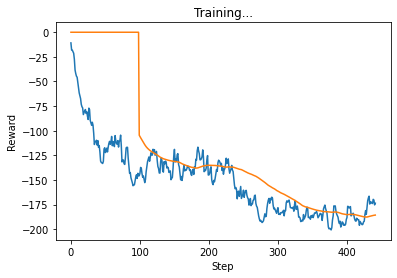

[65.62500000000004, 16.09868283504077, 47.992430340701084, 41.902429952623464]
show


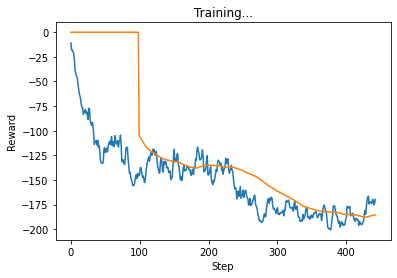

[65.62500000000004, 16.09868283504077, 47.03233804004514, 39.08056585018127]
show


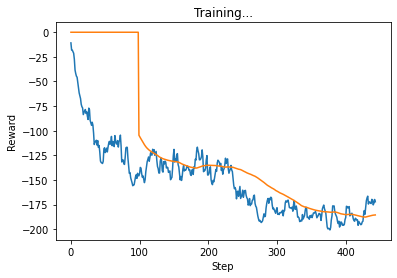

[65.62500000000004, 16.09868283504077, 48.11707722680528, 40.30602135474482]
[65.62500000000004, 16.09868283504077, 48.11707722680528, 40.30602135474482]
set0
show


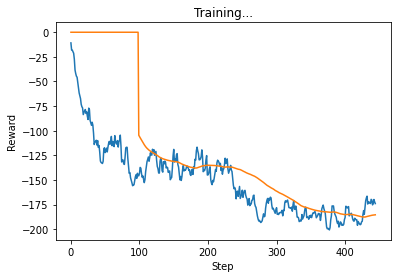

[65.62500000000004, 15.178818441717814, 47.6401995145566, 43.56858714082415]
show


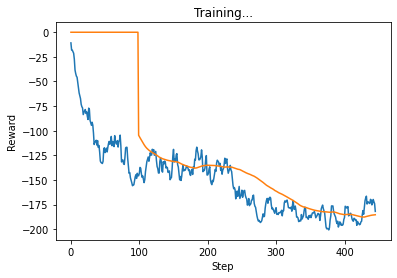

[65.62500000000004, 13.334584305476357, 49.17155207581152, 51.79186776051361]
[65.62500000000004, 13.334584305476357, 49.17155207581152, 51.79186776051361]
set0
show


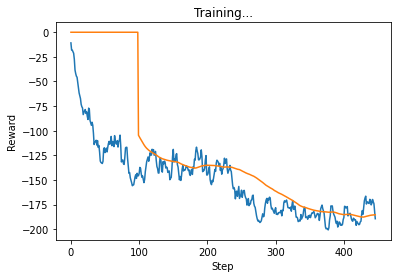

[65.62500000000004, 16.09868283504077, 49.140029503420074, 56.51795303770294]
show


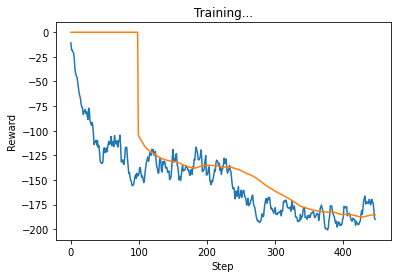

[65.62500000000004, 16.09868283504077, 47.50351808508226, 58.7378213015588]
[65.62500000000004, 16.09868283504077, 47.50351808508226, 58.7378213015588]
set0
show


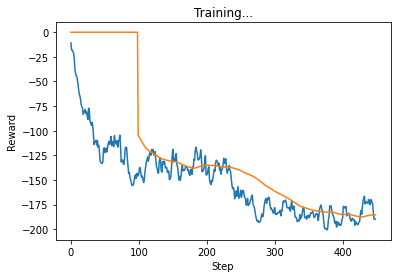

[65.62500000000004, 15.080048721181372, 47.18115681929033, 59.87079335953118]
show


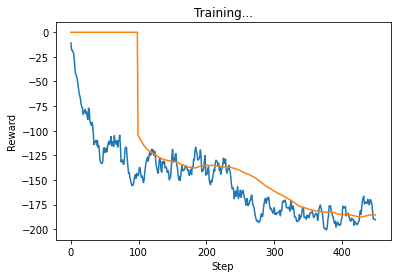

[65.62500000000004, 13.271658000599354, 47.47625329330106, 62.093166960673784]
[65.62500000000004, 13.271658000599354, 47.47625329330106, 62.093166960673784]
set0
show


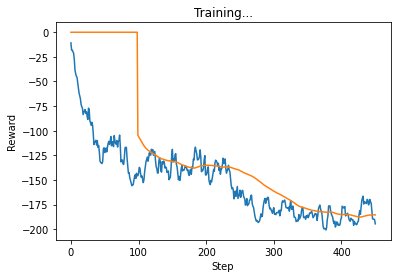

[65.62500000000004, 14.666091138977643, 49.09509084621868, 63.2038773825995]
show


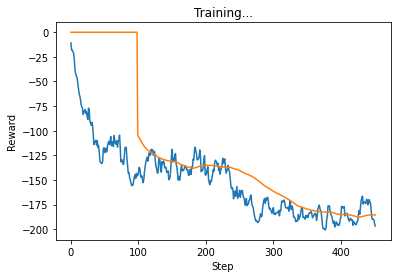

[65.62500000000004, 16.09868283504077, 48.73946800588986, 64.3145878045252]
[65.62500000000004, 16.09868283504077, 48.73946800588986, 64.3145878045252]
set0
show


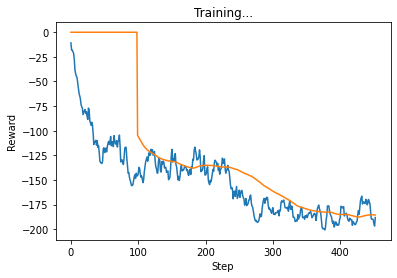

[64.3073046514138, 9.65920970102446, 47.189781815848676, 65.06167628706694]
show


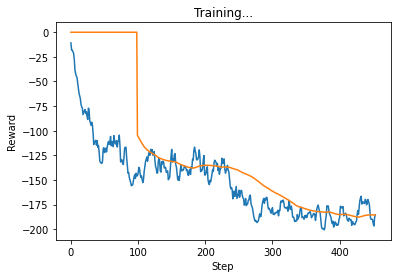

[64.19836956521743, 6.439473134016308, 47.411339452748244, 65.42529822645092]
[64.19836956521743, 6.439473134016308, 47.411339452748244, 65.42529822645092]
set0
show


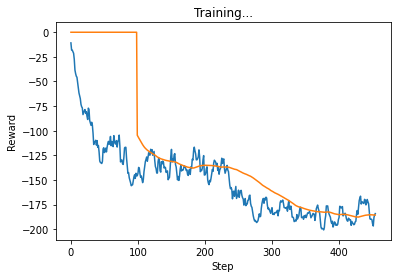

[64.19836956521743, 6.439473134016308, 46.12711435377551, 65.42529822645092]
show


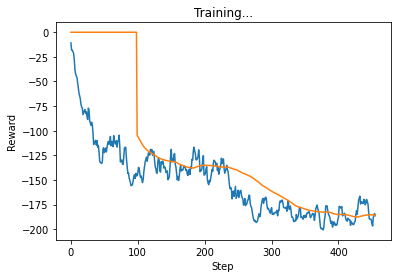

[64.19836956521743, 9.65920970102446, 45.04501279078448, 65.42529822645092]
show


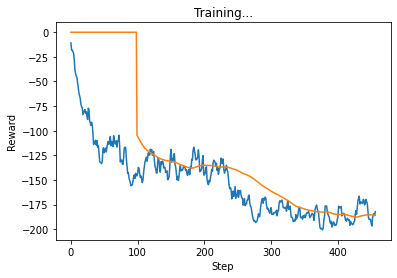

[64.19836956521743, 6.439473134016308, 45.886897476931594, 63.68305864994193]
[64.19836956521743, 6.439473134016308, 45.886897476931594, 63.68305864994193]
set0
show


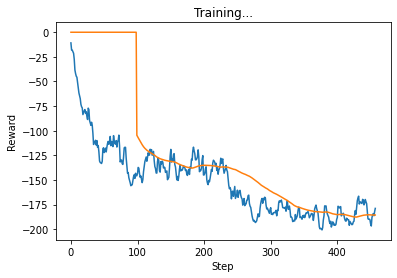

[64.19836956521743, 3.219736567008154, 46.607888115013864, 62.86332850427491]
show


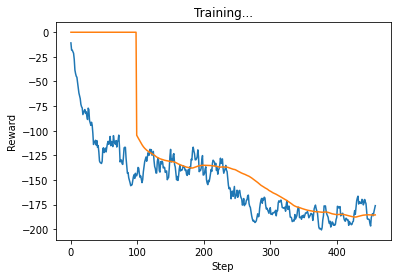

[64.19836956521743, 4.879633652116934, 44.48781375098889, 60.549528412029936]
[64.19836956521743, 4.879633652116934, 44.48781375098889, 60.549528412029936]
set0
show


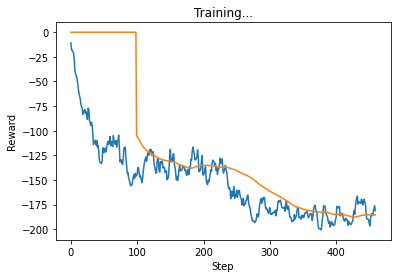

[64.19836956521743, 9.65920970102446, 44.54362138811499, 60.677551135919316]
show


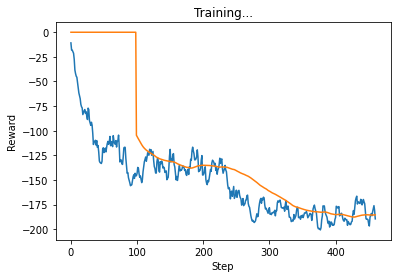

[64.19836956521743, 14.346853455239064, 44.80943395235875, 64.18182157155103]
[64.19836956521743, 14.346853455239064, 44.80943395235875, 64.18182157155103]
set0
show


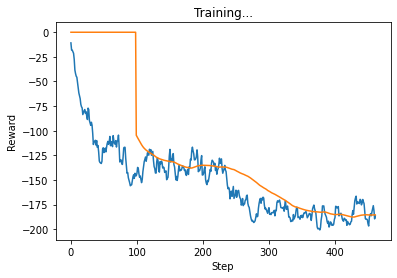

[64.19836956521743, 12.878946268032616, 45.57847203918185, 61.75037371283023]
show


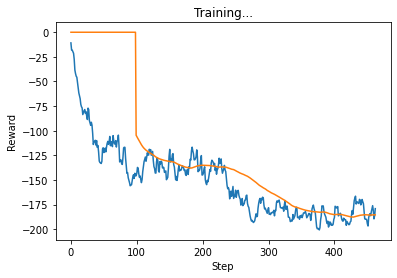

[64.19836956521743, 6.439473134016308, 46.922053184130206, 59.56917288866495]
[64.19836956521743, 6.439473134016308, 46.922053184130206, 59.56917288866495]
set0
show


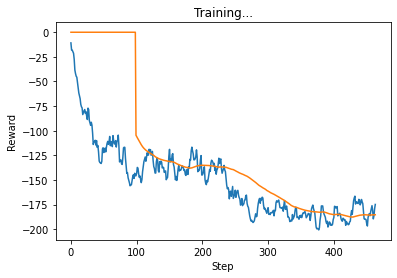

[64.19836956521743, 6.439473134016308, 46.87107238293217, 55.375020142241]
show


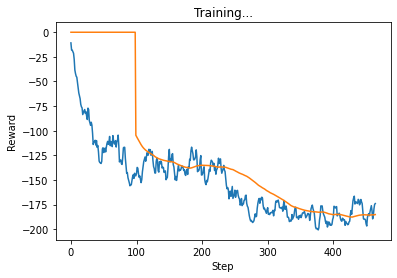

[64.19836956521743, 6.439473134016308, 45.88762122068985, 55.476772236896046]
[64.19836956521743, 6.439473134016308, 45.88762122068985, 55.476772236896046]
set0
show


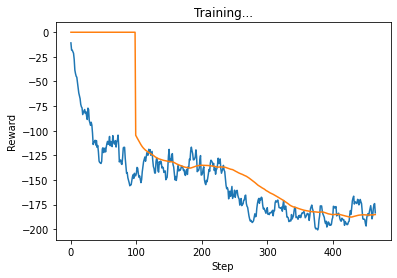

[64.19836956521743, 9.65920970102446, 47.18086966220613, 60.360694432098576]
show


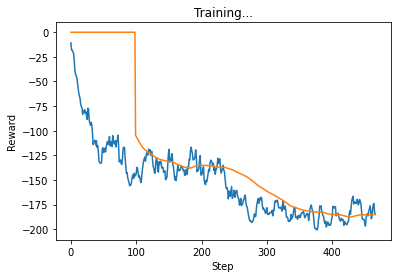

[64.19836956521743, 9.65920970102446, 48.023042185236754, 60.6655525922655]
[64.19836956521743, 9.65920970102446, 48.023042185236754, 60.6655525922655]
set0
show


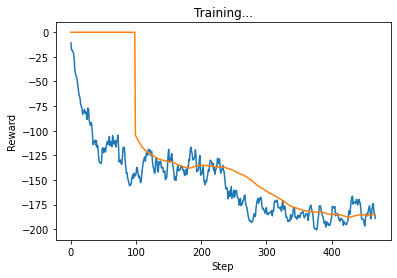

[65.62500000000004, 12.878946268032616, 47.6975643693667, 60.677551135919316]
show


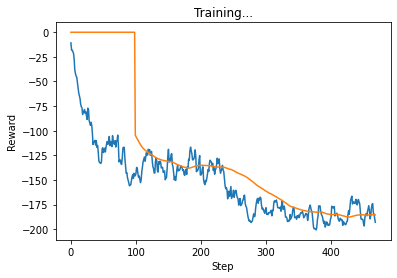

[65.62500000000004, 16.09868283504077, 48.57562088583957, 60.677551135919316]
show


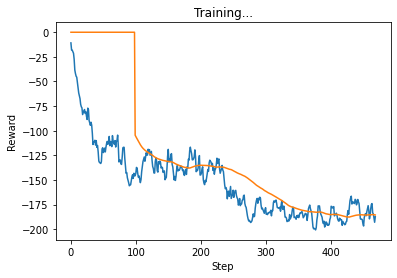

[65.54051616284025, 9.65920970102446, 49.494026268971325, 60.677551135919316]
[65.54051616284025, 9.65920970102446, 49.494026268971325, 60.677551135919316]
set0
show


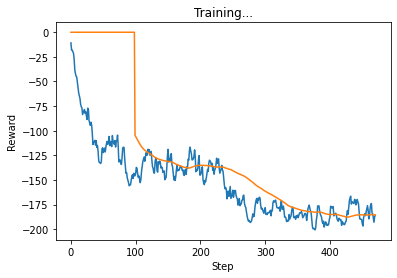

[64.53073153169899, 6.439473134016308, 51.828293008328686, 61.21571466734273]
[64.53073153169899, 6.439473134016308, 51.828293008328686, 61.21571466734273]
set2
show


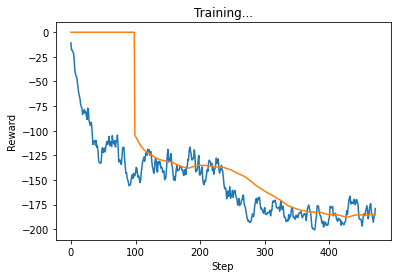

[64.19836956521743, 0.0, 51.23003549099334, 61.60558965066594]
show


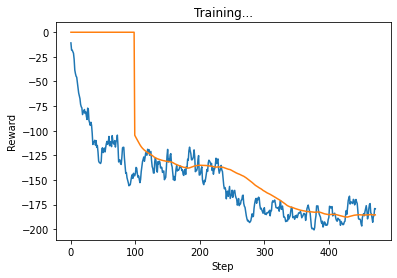

[64.19836956521743, 0.0, 51.223414624752166, 61.78826155784503]
[64.19836956521743, 0.0, 51.223414624752166, 61.78826155784503]
set2
show


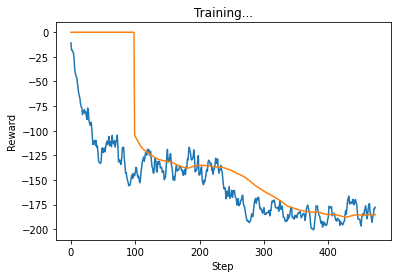

[64.19836956521743, 0.0, 49.67368970241243, 61.78826155784503]
show


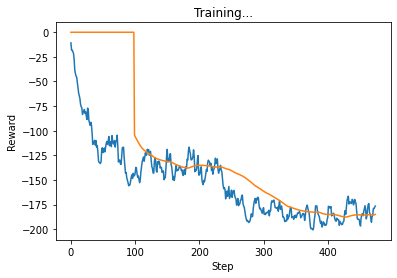

[64.19836956521743, 0.0, 48.55015363768999, 61.78826155784503]
show


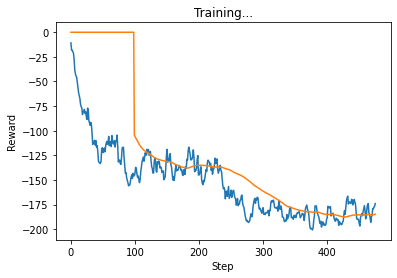

[64.19836956521743, 0.0, 45.93999596939803, 61.78826155784503]
[64.19836956521743, 0.0, 45.93999596939803, 61.78826155784503]
set0
show


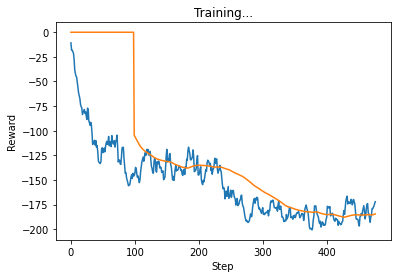

[64.19836956521743, 0.0, 44.10682825086585, 61.78826155784503]
show


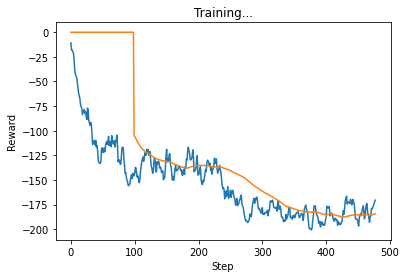

[64.19836956521743, 0.0, 42.52855327162489, 61.78826155784503]
[64.19836956521743, 0.0, 42.52855327162489, 61.78826155784503]
set0
show


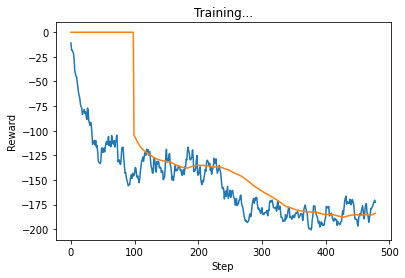

[64.19836956521743, 3.219736567008154, 41.44436250631337, 61.78826155784503]
show


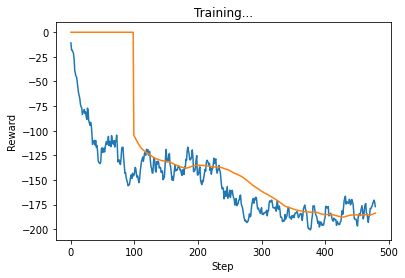

[64.19836956521743, 6.439473134016308, 42.61628781585444, 61.78826155784503]
[64.19836956521743, 6.439473134016308, 42.61628781585444, 61.78826155784503]
set0
show


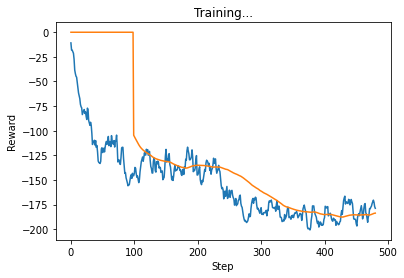

[64.19836956521743, 6.439473134016308, 44.35448673538234, 61.78826155784503]
show


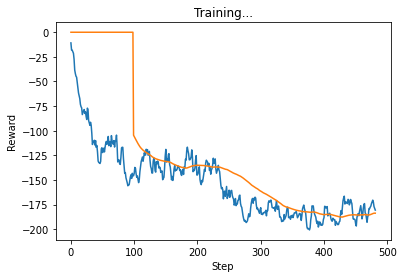

[64.19836956521743, 9.65920970102446, 42.98509494249968, 61.78826155784503]
[64.19836956521743, 9.65920970102446, 42.98509494249968, 61.78826155784503]
set0
show


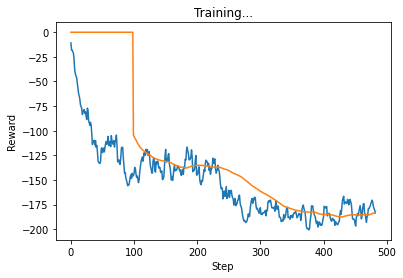

[64.19836956521743, 12.188708006915254, 42.72864759311761, 61.78826155784503]
show


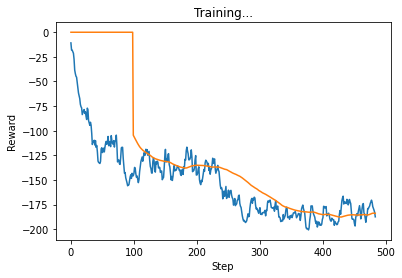

[64.66614914036222, 16.09868283504077, 42.899170611163996, 61.78826155784503]
[64.66614914036222, 16.09868283504077, 42.899170611163996, 61.78826155784503]
set0
show


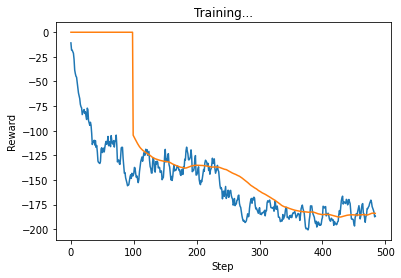

[65.62500000000004, 16.09868283504077, 41.25190418475617, 61.78826155784503]
show


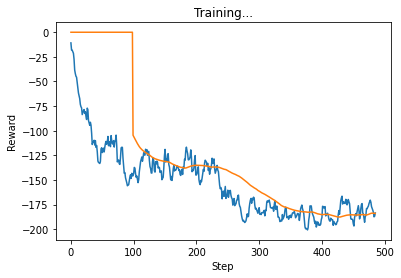

[65.62500000000004, 12.878946268032616, 41.25204926859758, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 41.25204926859758, 61.78826155784503]
set0
show


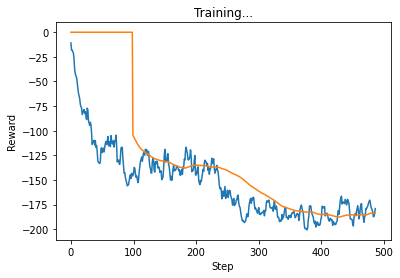

[65.62500000000004, 9.65920970102446, 40.0312205107054, 61.78826155784503]
show


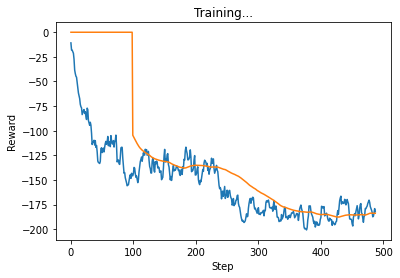

[65.62500000000004, 11.31306231139972, 41.60271883844284, 61.78826155784503]
show


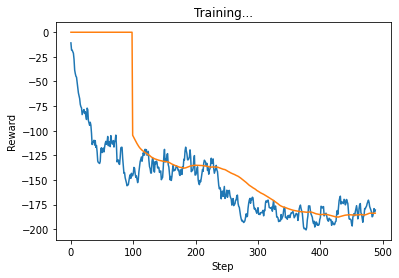

[65.62500000000004, 9.65920970102446, 41.43200676643524, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 41.43200676643524, 61.78826155784503]
set0
show


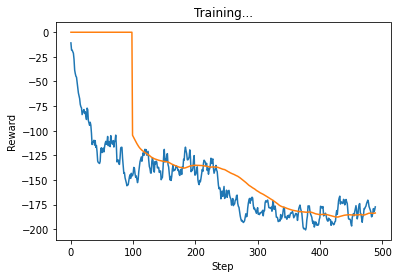

[65.62500000000004, 6.439473134016308, 41.483798993135906, 61.78826155784503]
show


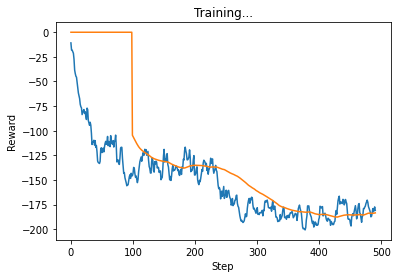

[65.62500000000004, 9.574124780415952, 41.93143441605703, 61.78826155784503]
[65.62500000000004, 9.574124780415952, 41.93143441605703, 61.78826155784503]
set0
show


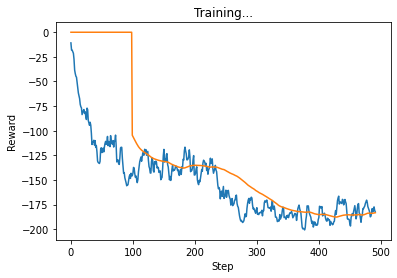

[65.62500000000004, 12.878946268032616, 40.15032034455365, 61.78826155784503]
show


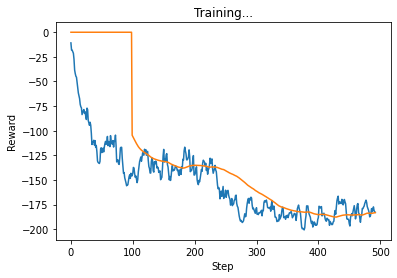

[65.62500000000004, 12.878946268032616, 40.56984562118714, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 40.56984562118714, 61.78826155784503]
set0
show


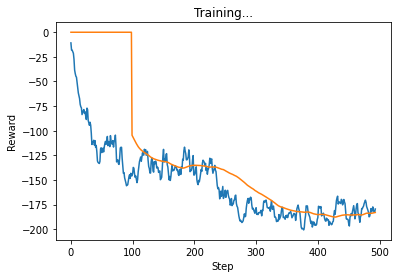

[65.62500000000004, 8.910492718412701, 41.17270029637437, 61.78826155784503]
show


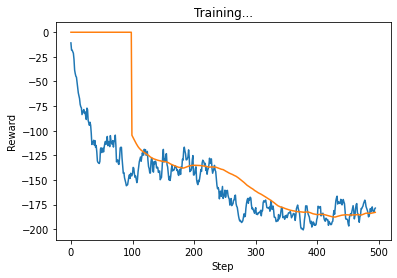

[65.62500000000004, 9.65920970102446, 39.51488914103683, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 39.51488914103683, 61.78826155784503]
set0
show


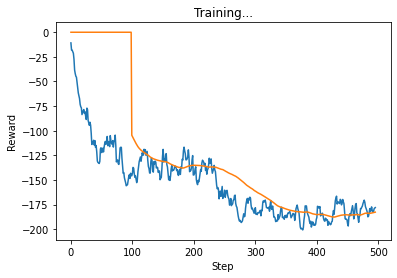

[65.62500000000004, 9.65920970102446, 39.02034989951414, 61.78826155784503]
show


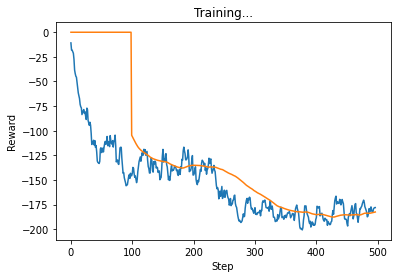

[65.62500000000004, 9.65920970102446, 38.98926017189593, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 38.98926017189593, 61.78826155784503]
set0
show


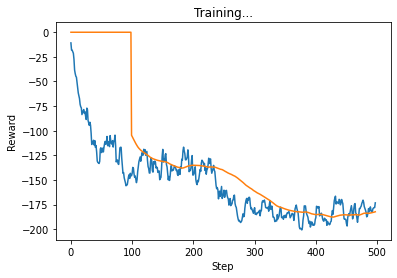

[65.62500000000004, 6.439473134016308, 37.40641790795184, 61.78826155784503]
show


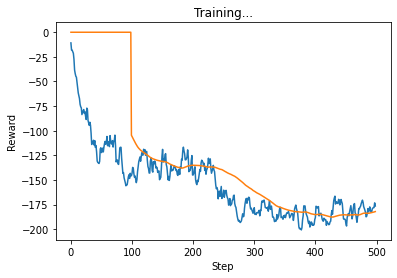

[65.62500000000004, 6.439473134016308, 40.64699627370437, 61.78826155784503]
[65.62500000000004, 6.439473134016308, 40.64699627370437, 61.78826155784503]
set0
show


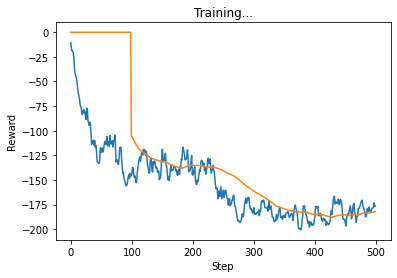

[65.62500000000004, 6.439473134016308, 43.33538534802362, 59.226291835669024]
show


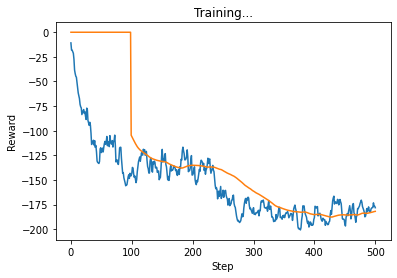

[65.62500000000004, 10.900442070007879, 43.00735502786033, 56.66432211349301]
show


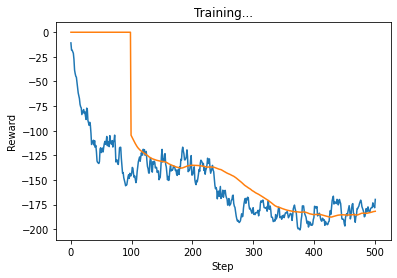

[65.62500000000004, 9.65920970102446, 42.20241259264719, 50.28669332293246]
[65.62500000000004, 9.65920970102446, 42.20241259264719, 50.28669332293246]
set0
show


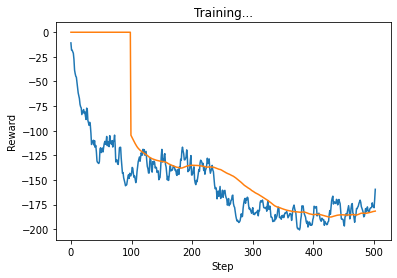

[65.62500000000004, 9.65920970102446, 40.256414260568974, 41.97087771880373]
show


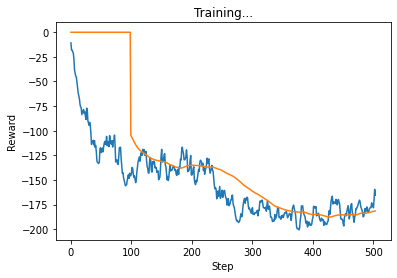

[65.62500000000004, 6.439473134016308, 48.33861748380191, 43.13890298877078]
[65.62500000000004, 6.439473134016308, 48.33861748380191, 43.13890298877078]
set0
show


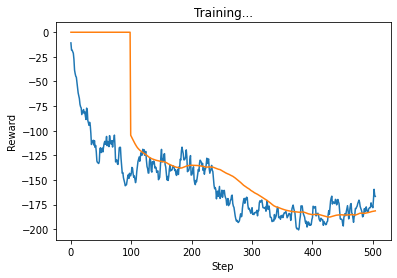

[65.62500000000004, 7.889987118871668, 48.729188878244415, 42.46838688786716]
show


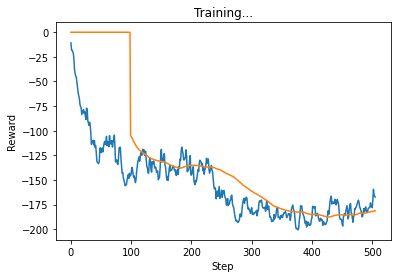

[65.62500000000004, 10.61659473992292, 48.79200676059886, 40.29613005949912]
[65.62500000000004, 10.61659473992292, 48.79200676059886, 40.29613005949912]
set0
show


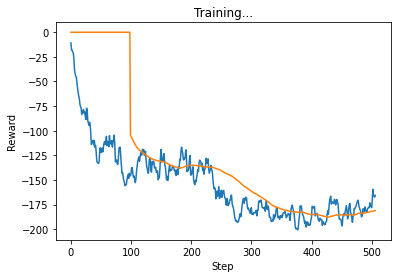

[65.62500000000004, 11.330627217537062, 48.70224023455631, 38.021789471563174]
show


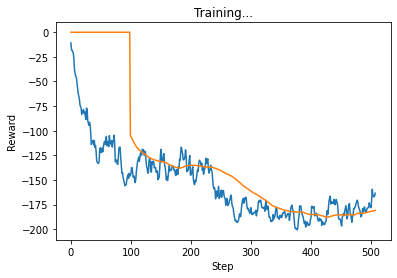

[65.62500000000004, 12.878946268032616, 48.75580239486536, 34.1824917453327]
[65.62500000000004, 12.878946268032616, 48.75580239486536, 34.1824917453327]
set0
show


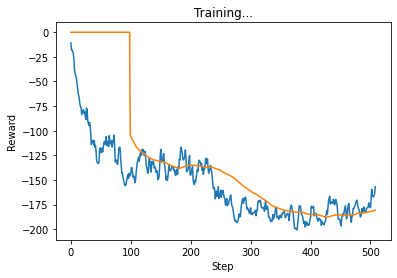

[65.62500000000004, 6.439473134016308, 48.43110936275282, 34.40683146716017]
show


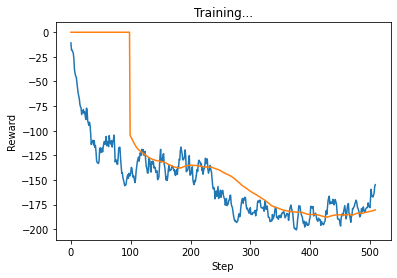

[65.62500000000004, 3.219736567008154, 48.188184287870925, 35.73728882458445]
[65.62500000000004, 3.219736567008154, 48.188184287870925, 35.73728882458445]
set0
show


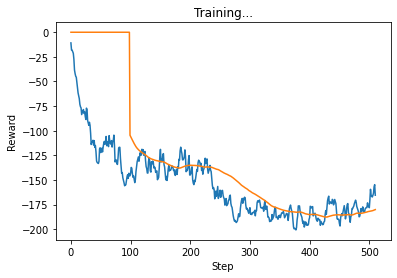

[65.62500000000004, 6.439473134016308, 52.860109734268335, 38.60131149602062]
[65.62500000000004, 6.439473134016308, 52.860109734268335, 38.60131149602062]
set2
show


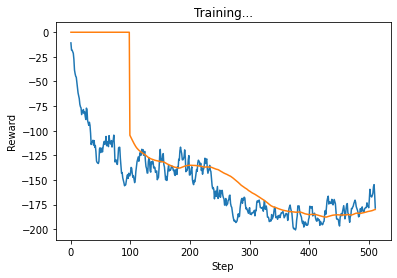

[65.62500000000004, 12.878946268032616, 50.775946081607394, 47.29501521911741]
show


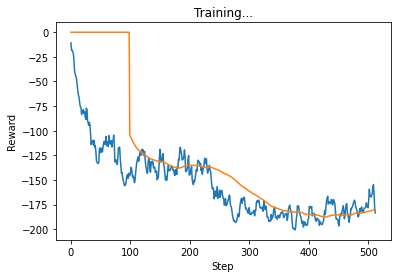

[65.62500000000004, 14.060128873090772, 49.65063432694869, 52.137129231504126]
show


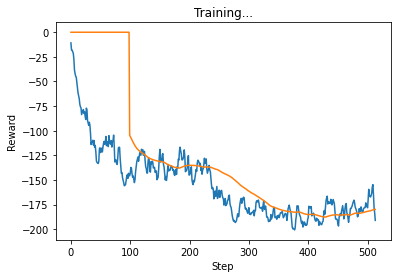

[65.62500000000004, 16.153629203009608, 50.34545814628451, 56.97158544465057]
[65.62500000000004, 16.153629203009608, 50.34545814628451, 56.97158544465057]
set0
show


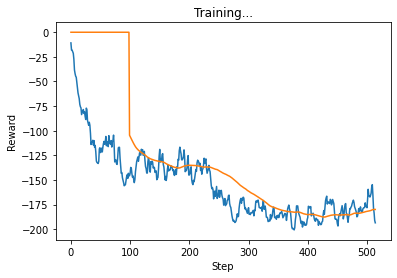

[65.62500000000004, 16.09868283504077, 51.044364295780404, 58.75898591126376]
[65.62500000000004, 16.09868283504077, 51.044364295780404, 58.75898591126376]
set2
show


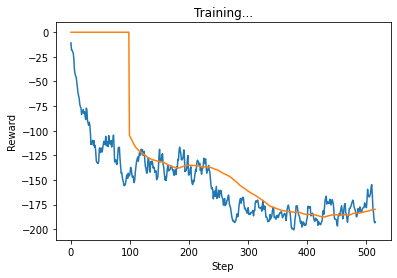

[65.62500000000004, 16.09868283504077, 47.911157317176304, 60.98234411429406]
show


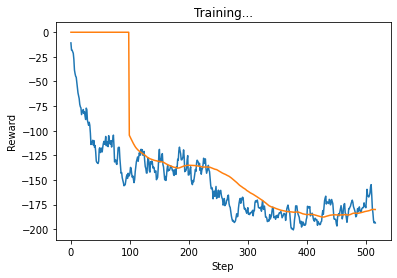

[65.62500000000004, 16.09868283504077, 47.647477146524764, 62.29476091159314]
show


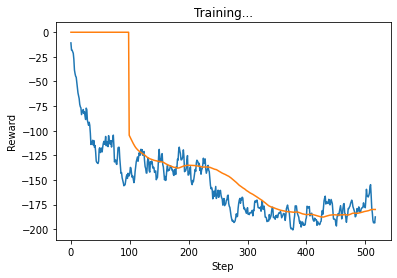

[65.62500000000004, 9.65920970102446, 46.69936790629871, 63.570736730356565]
[65.62500000000004, 9.65920970102446, 46.69936790629871, 63.570736730356565]
set0
show


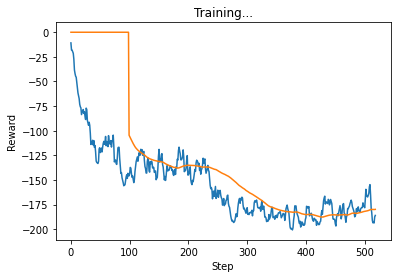

[65.62500000000004, 9.65920970102446, 44.016317243843616, 64.73898405000378]
show


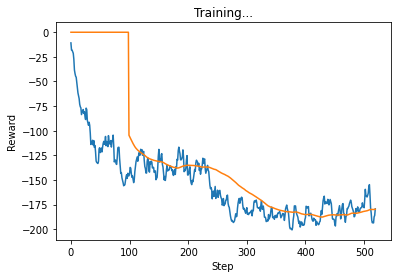

[65.62500000000004, 3.219736567008154, 43.14731539251227, 65.37235593292546]
[65.62500000000004, 3.219736567008154, 43.14731539251227, 65.37235593292546]
set0
show


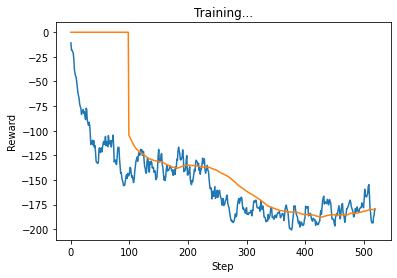

[65.62500000000004, 3.219736567008154, 43.52756977293693, 65.42530012746087]
show


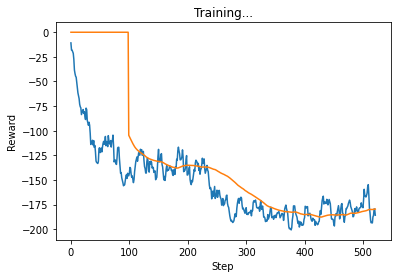

[65.62500000000004, 6.439473134016308, 46.352387849812764, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 46.352387849812764, 65.42530012746087]
set0
show


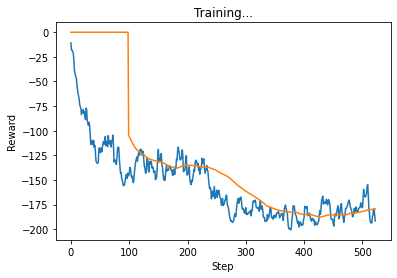

[65.62500000000004, 12.878946268032616, 45.65964414130084, 65.42530012746087]
show


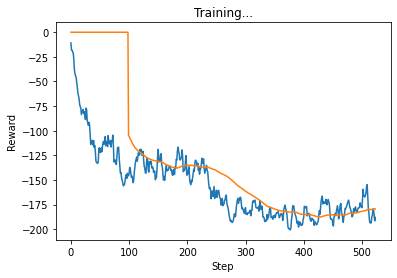

[65.62500000000004, 9.65920970102446, 45.258799680791256, 65.42530012746087]
[65.62500000000004, 9.65920970102446, 45.258799680791256, 65.42530012746087]
set0
show


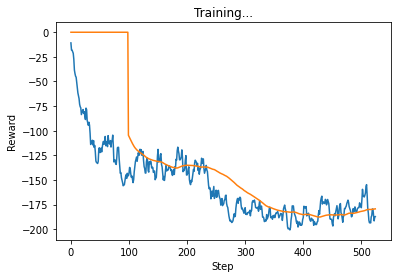

[65.62500000000004, 7.093926870989718, 47.13544130612611, 65.42530012746087]
show


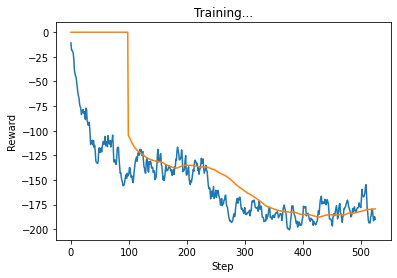

[65.62500000000004, 9.65920970102446, 47.27493168011422, 65.42530012746087]
[65.62500000000004, 9.65920970102446, 47.27493168011422, 65.42530012746087]
set0
show


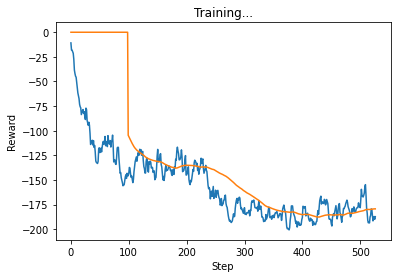

[65.62500000000004, 6.439473134016308, 47.7814268248798, 65.42530012746087]
show


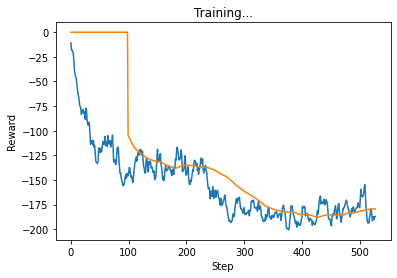

[65.62500000000004, 6.439473134016308, 47.576496773771794, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 47.576496773771794, 65.42530012746087]
set0
show


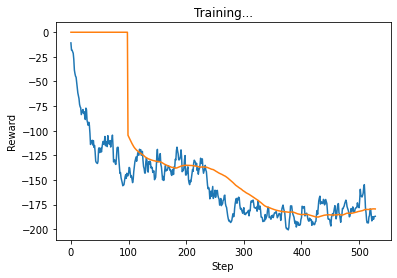

[65.62500000000004, 6.439473134016308, 47.440664724490105, 65.42530012746087]
show


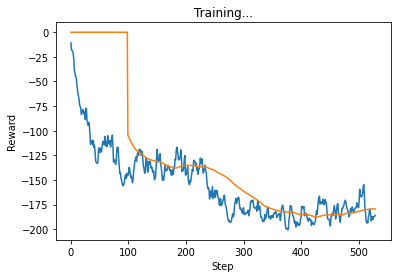

[65.62500000000004, 6.439473134016308, 46.4718633962125, 65.42530012746087]
show


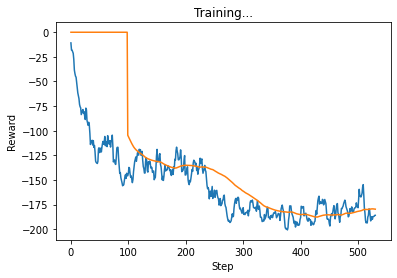

[65.62500000000004, 6.439473134016308, 46.43247785475364, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 46.43247785475364, 65.42530012746087]
set0
show


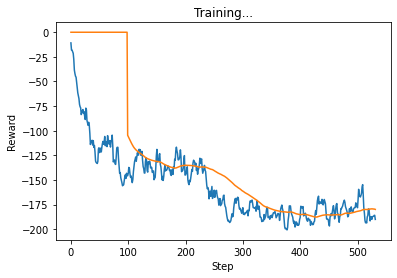

[65.62500000000004, 9.65920970102446, 47.34978386739769, 65.42530012746087]
show


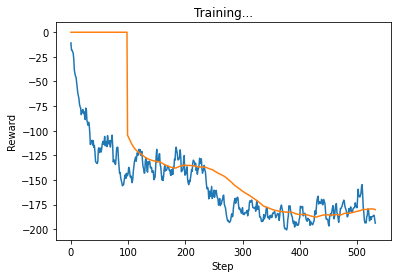

[65.62500000000004, 14.599730967610386, 46.23397171649337, 65.42530012746087]
[65.62500000000004, 14.599730967610386, 46.23397171649337, 65.42530012746087]
set0
show


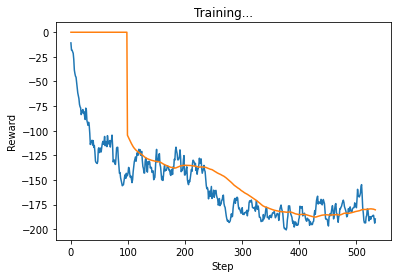

[65.62500000000004, 9.65920970102446, 46.896705733088766, 65.42530012746087]
show


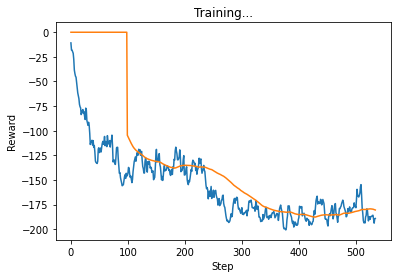

[65.62500000000004, 9.65920970102446, 46.4327377405337, 65.42530012746087]
[65.62500000000004, 9.65920970102446, 46.4327377405337, 65.42530012746087]
set0
show


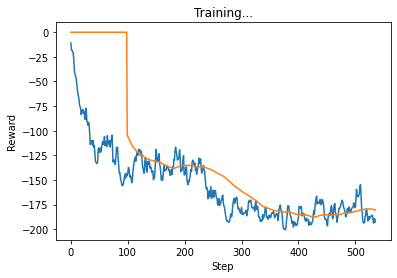

[65.62500000000004, 12.878946268032616, 46.81274124068688, 65.42530012746087]
show


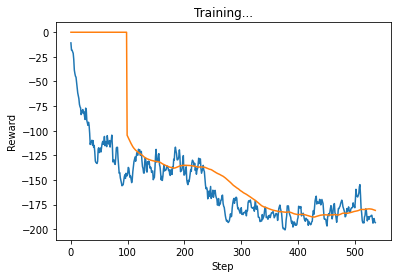

[65.62500000000004, 12.878946268032616, 47.40959949581479, 65.42530012746087]
[65.62500000000004, 12.878946268032616, 47.40959949581479, 65.42530012746087]
set0
show


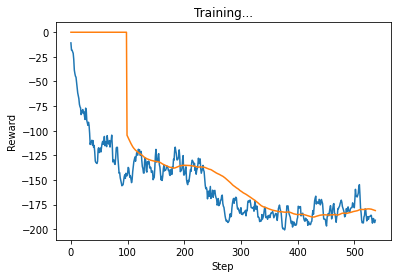

[65.62500000000004, 9.65920970102446, 48.19250696433295, 65.42530012746087]
show


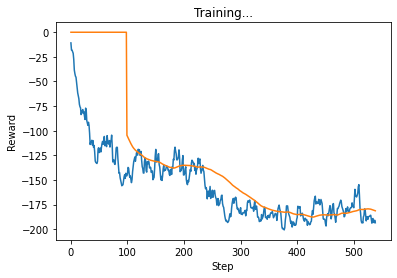

[65.62500000000004, 12.878946268032616, 47.554644956171316, 65.42530012746087]
[65.62500000000004, 12.878946268032616, 47.554644956171316, 65.42530012746087]
set0
show


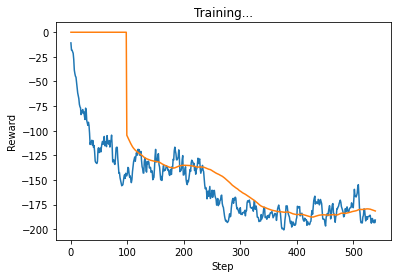

[65.62500000000004, 9.65920970102446, 48.03242710448702, 65.42530012746087]
show


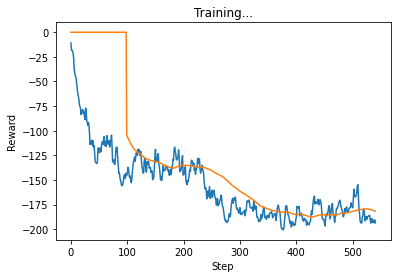

[65.62500000000004, 12.878946268032616, 47.62076403060732, 65.42530012746087]
[65.62500000000004, 12.878946268032616, 47.62076403060732, 65.42530012746087]
set0
show


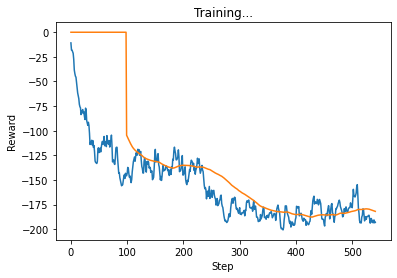

[65.62500000000004, 12.878946268032616, 47.05755858594642, 65.42530012746087]
show


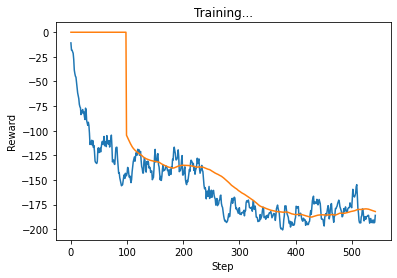

[65.62500000000004, 6.439473134016308, 46.48754819057548, 65.42530012746087]
show


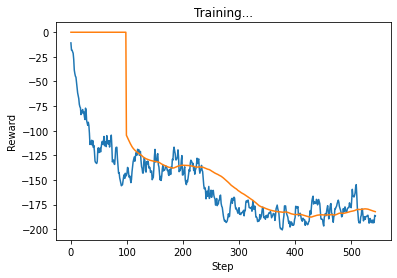

[65.62500000000004, 6.439473134016308, 47.03106534280988, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 47.03106534280988, 65.42530012746087]
set0
show


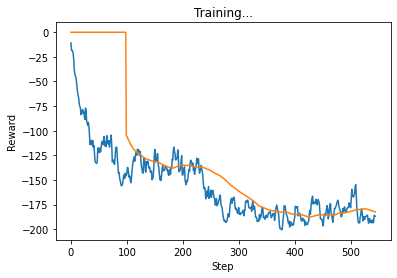

[65.62500000000004, 6.439473134016308, 47.24529855944766, 65.42530012746087]
show


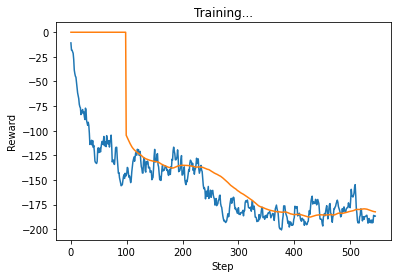

[65.62500000000004, 6.439473134016308, 47.23048138770882, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 47.23048138770882, 65.42530012746087]
set0
show


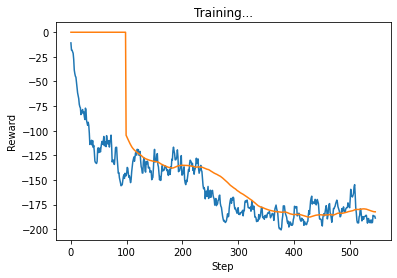

[65.62500000000004, 9.65920970102446, 46.02614897211657, 65.42530012746087]
show


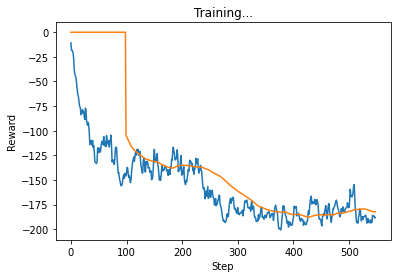

[65.62500000000004, 8.765560445484173, 46.3970286648049, 65.42530012746087]
[65.62500000000004, 8.765560445484173, 46.3970286648049, 65.42530012746087]
set0
show


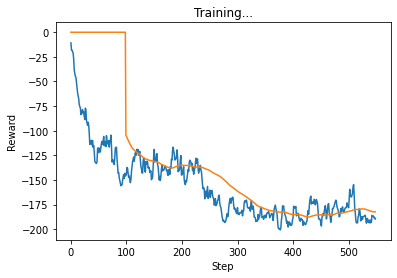

[65.62500000000004, 9.65920970102446, 47.00645612807843, 65.42530012746087]
show


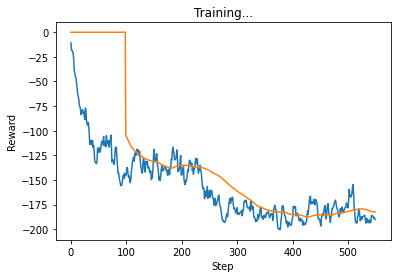

[65.62500000000004, 10.002308840787077, 47.00645612807843, 65.42530012746087]
[65.62500000000004, 10.002308840787077, 47.00645612807843, 65.42530012746087]
set0
show


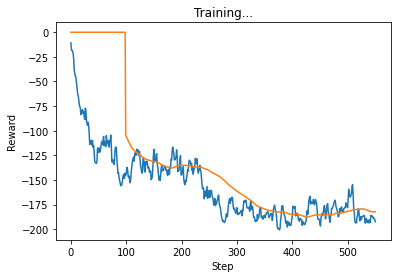

[65.62500000000004, 12.878946268032616, 46.582152095892575, 65.42530012746087]
show


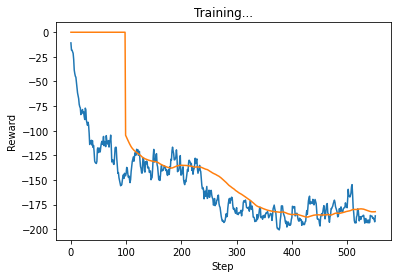

[65.62500000000004, 6.439473134016308, 47.00645612807843, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 47.00645612807843, 65.42530012746087]
set0
show


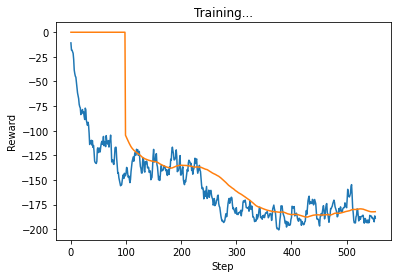

[65.62500000000004, 9.0941082474117, 46.49625638587535, 65.42530012746087]
show


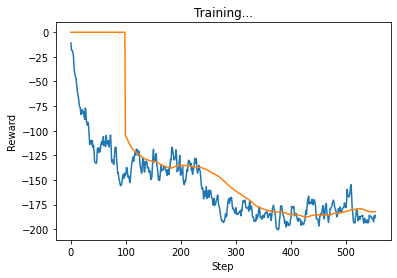

[65.62500000000004, 6.439473134016308, 46.418602942380495, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 46.418602942380495, 65.42530012746087]
set0
show


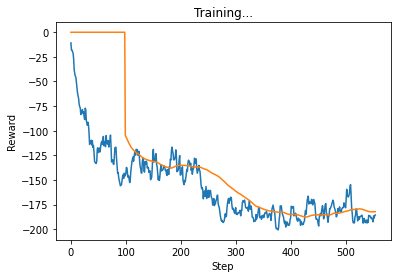

[65.62500000000004, 6.439473134016308, 46.14067485519695, 65.42530012746087]
show


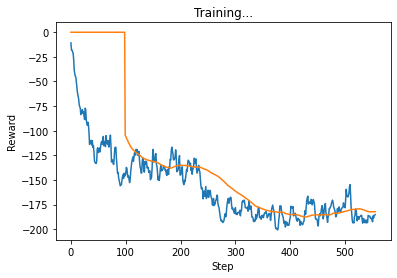

[65.62500000000004, 6.439473134016308, 45.74909167113488, 65.42530012746087]
show


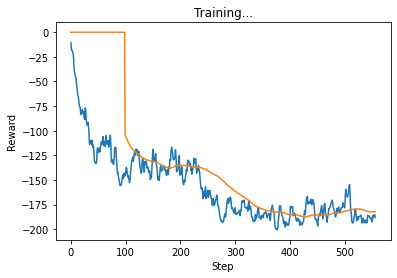

[65.62500000000004, 9.65920970102446, 45.3569475211325, 65.42530012746087]
[65.62500000000004, 9.65920970102446, 45.3569475211325, 65.42530012746087]
set0
show


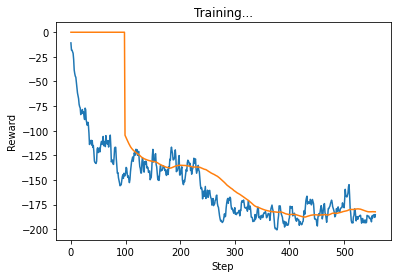

[65.62500000000004, 7.115449658442441, 45.109877594900766, 65.42530012746087]
show


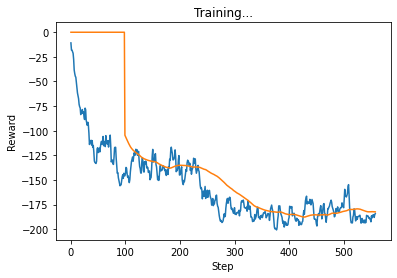

[65.62500000000004, 6.439473134016308, 44.717769767042384, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 44.717769767042384, 65.42530012746087]
set0
show


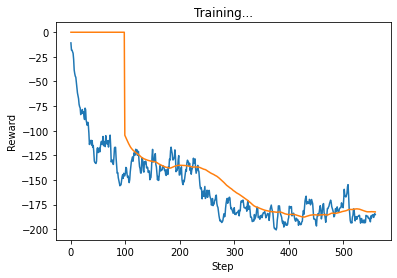

[65.62500000000004, 6.533756173186959, 45.65622955066567, 65.42530012746087]
show


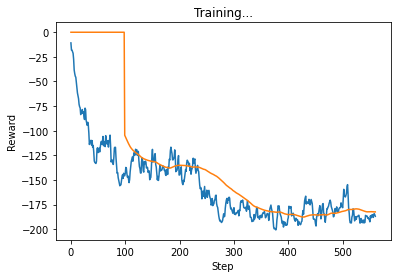

[65.62500000000004, 8.815299345008654, 45.126683022498945, 65.42530012746087]
[65.62500000000004, 8.815299345008654, 45.126683022498945, 65.42530012746087]
set0
show


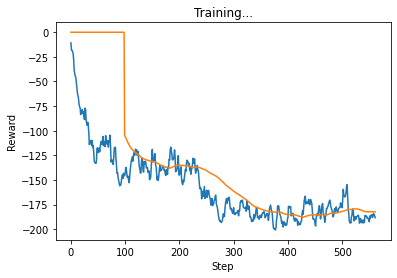

[65.62500000000004, 9.65920970102446, 45.662456295503574, 65.42530012746087]
show


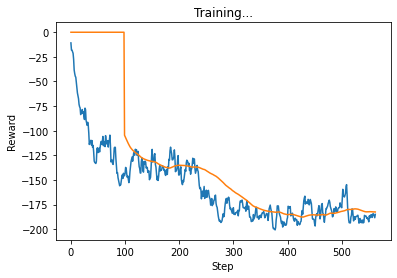

[65.62500000000004, 6.439473134016308, 45.44569563902499, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 45.44569563902499, 65.42530012746087]
set0
show


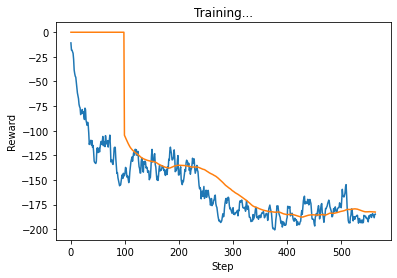

[65.62500000000004, 6.439473134016308, 45.23804287637205, 65.42530012746087]
show


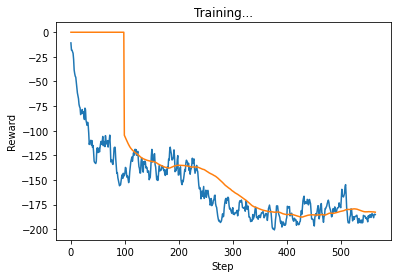

[65.62500000000004, 6.439473134016308, 45.662456295503574, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 45.662456295503574, 65.42530012746087]
set0
show


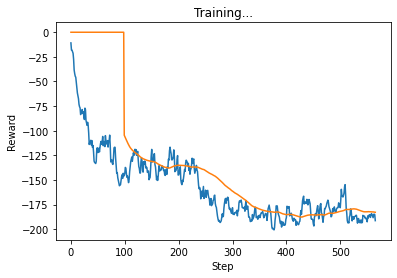

[65.62500000000004, 12.878946268032616, 45.40200256475599, 65.42530012746087]
show


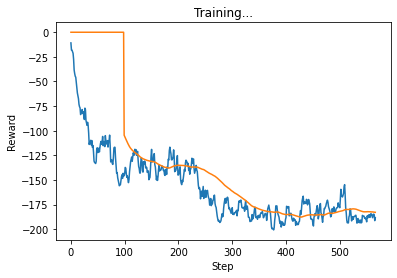

[65.62500000000004, 9.65920970102446, 45.552971266556085, 65.42530012746087]
[65.62500000000004, 9.65920970102446, 45.552971266556085, 65.42530012746087]
set0
show


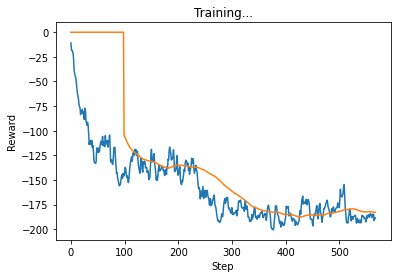

[65.62500000000004, 10.726559578466688, 44.88181042613038, 65.42530012746087]
show


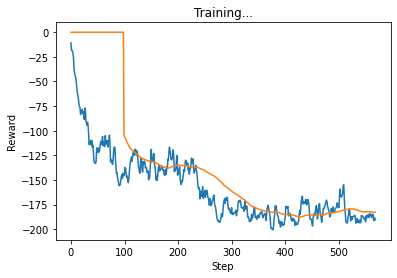

[65.62500000000004, 12.878946268032616, 44.562043881605845, 65.42530012746087]
show


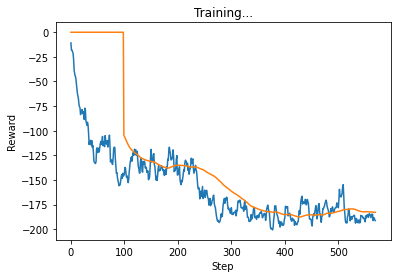

[65.62500000000004, 12.878946268032616, 45.34872002627, 65.42530012746087]
[65.62500000000004, 12.878946268032616, 45.34872002627, 65.42530012746087]
set0
show


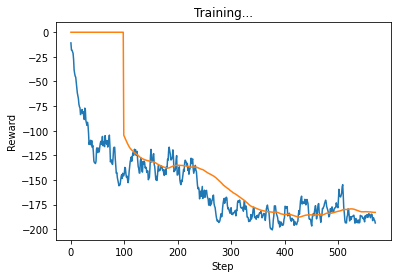

[65.62500000000004, 15.857928286909678, 44.79480810361939, 65.42530012746087]
show


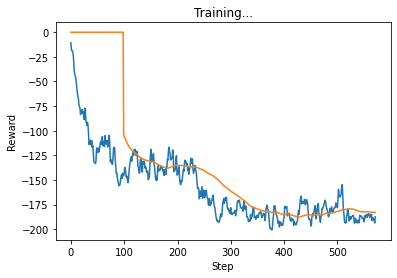

[65.62500000000004, 10.433681255264151, 43.97895918983855, 65.42530012746087]
[65.62500000000004, 10.433681255264151, 43.97895918983855, 65.42530012746087]
set0
show


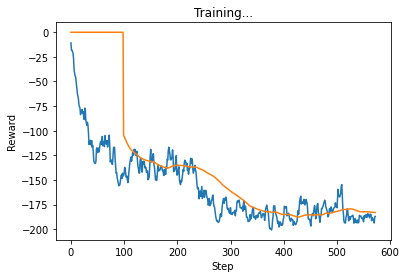

[65.62500000000004, 9.65920970102446, 44.36611311311431, 65.42530012746087]
show


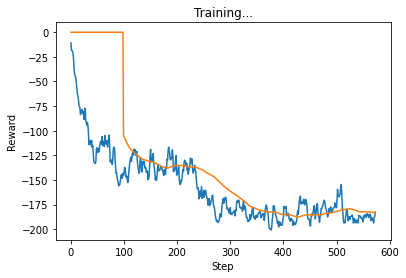

[65.62500000000004, 6.439473134016308, 43.08174783030887, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 43.08174783030887, 65.42530012746087]
set0
show


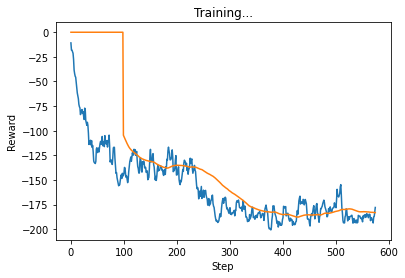

[65.62500000000004, 3.219736567008154, 41.68387269112539, 65.42530012746087]
show


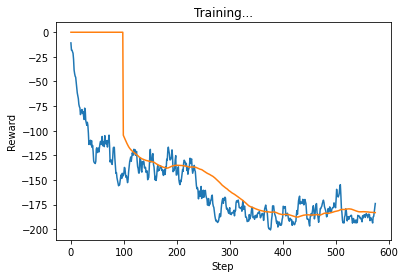

[65.62500000000004, 0.0, 40.90457550704761, 65.42530012746087]
[65.62500000000004, 0.0, 40.90457550704761, 65.42530012746087]
set0
show


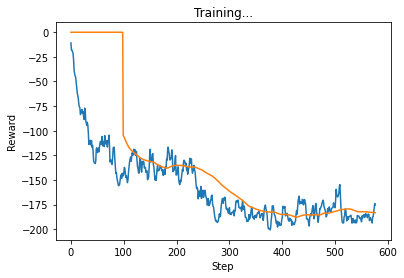

[65.62500000000004, 0.0, 42.270185079973544, 65.42530012746087]
show


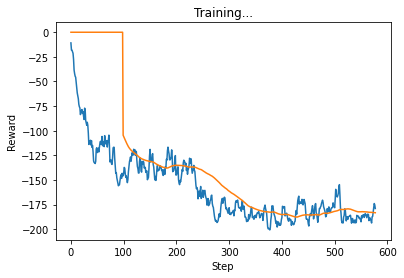

[65.62500000000004, 1.9348219401321465, 44.00135917109995, 65.42530012746087]
[65.62500000000004, 1.9348219401321465, 44.00135917109995, 65.42530012746087]
set0
show


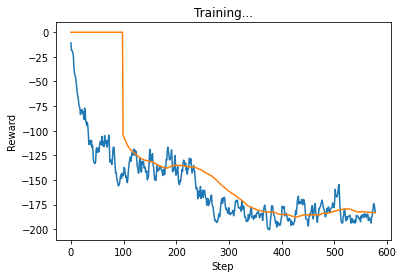

[65.62500000000004, 6.439473134016308, 43.45776874767223, 65.42530012746087]
show


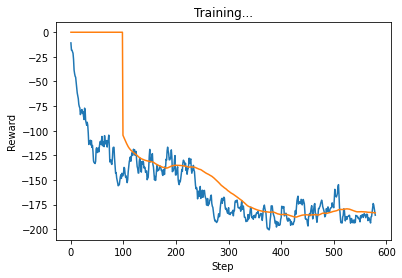

[65.62500000000004, 9.65920970102446, 43.05716252363568, 65.42530012746087]
[65.62500000000004, 9.65920970102446, 43.05716252363568, 65.42530012746087]
set0
show


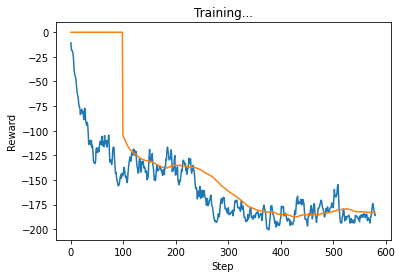

[65.62500000000004, 9.65920970102446, 43.175365664806066, 65.42530012746087]
show


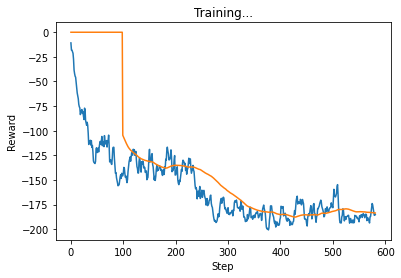

[65.62500000000004, 9.65920970102446, 42.279139196709465, 65.42530012746087]
show


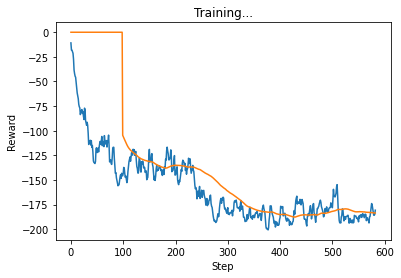

[65.62500000000004, 6.439473134016308, 41.229105614799536, 65.42530012746087]
[65.62500000000004, 6.439473134016308, 41.229105614799536, 65.42530012746087]
set0
show


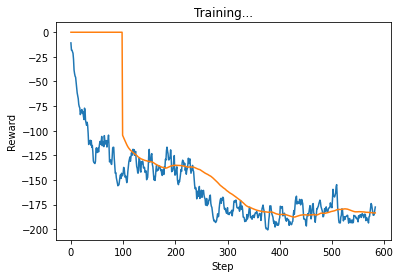

[65.62500000000004, 3.219736567008154, 41.23417668578227, 65.42530012746087]
show


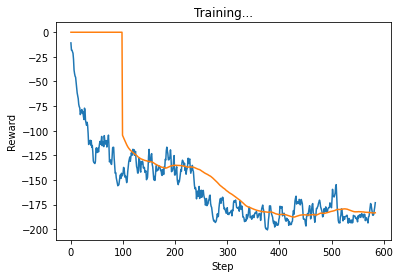

[65.62500000000004, 0.0, 40.044628604304805, 65.42530012746087]
[65.62500000000004, 0.0, 40.044628604304805, 65.42530012746087]
set0
show


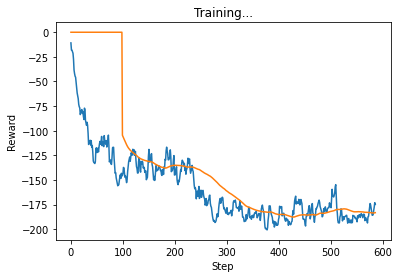

[65.62500000000004, 0.0, 41.813782485549254, 65.42530012746087]
show


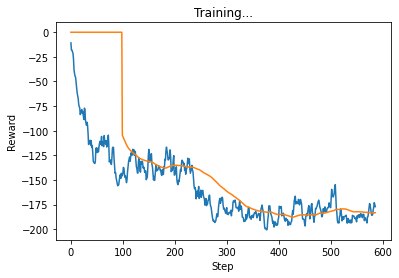

[65.62500000000004, 0.0, 44.103597639870614, 65.42530012746087]
[65.62500000000004, 0.0, 44.103597639870614, 65.42530012746087]
set0
show


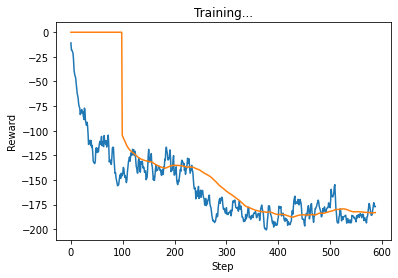

[65.62500000000004, 0.0, 44.049446469551256, 65.42530012746087]
show


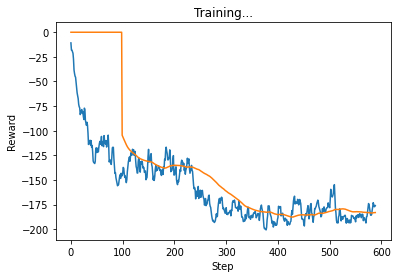

[65.62500000000004, 0.0, 42.96261763524328, 65.42530012746087]
[65.62500000000004, 0.0, 42.96261763524328, 65.42530012746087]
set0
show


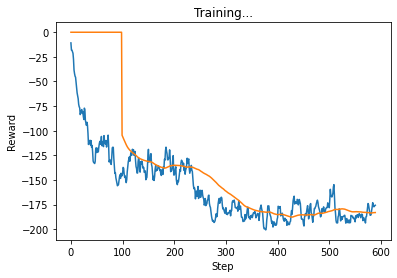

[65.62500000000004, 0.0, 42.64374664892017, 65.42530012746087]
show


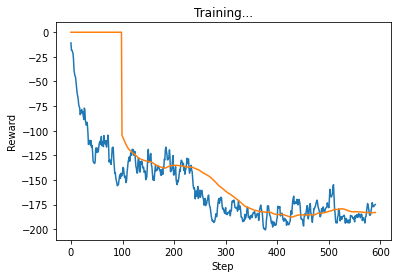

[65.62500000000004, 0.0, 41.89424329627818, 65.42530012746087]
[65.62500000000004, 0.0, 41.89424329627818, 65.42530012746087]
set0
show


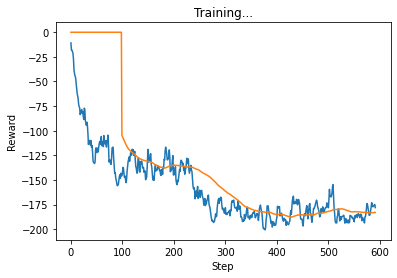

[65.62500000000004, 0.0, 45.05436085130178, 65.42530012746087]
show


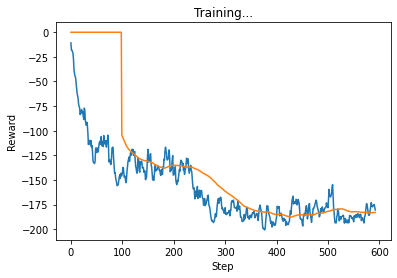

[65.62500000000004, 3.219736567008154, 44.21182072121047, 65.42530012746087]
[65.62500000000004, 3.219736567008154, 44.21182072121047, 65.42530012746087]
set0
show


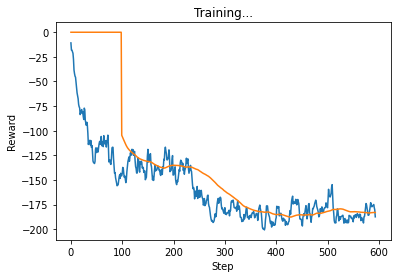

[65.62500000000004, 9.65920970102446, 44.74265757833694, 65.42530012746087]
show


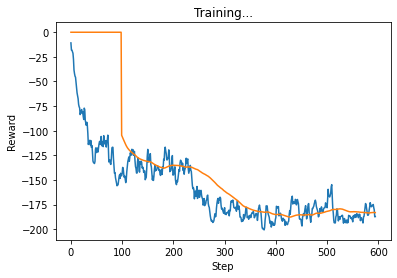

[65.62500000000004, 9.65920970102446, 44.53223464807412, 65.42530012746087]
show


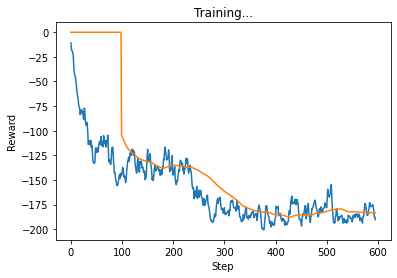

[65.62500000000004, 12.878946268032616, 44.35549761081768, 65.42530012746087]
[65.62500000000004, 12.878946268032616, 44.35549761081768, 65.42530012746087]
set0
show


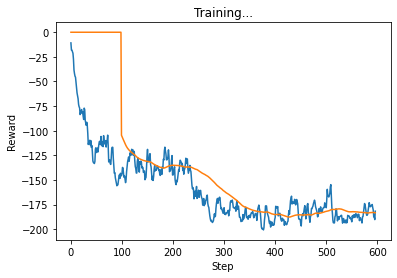

[65.62500000000004, 6.439473134016308, 42.22336018160222, 65.42530012746087]
show


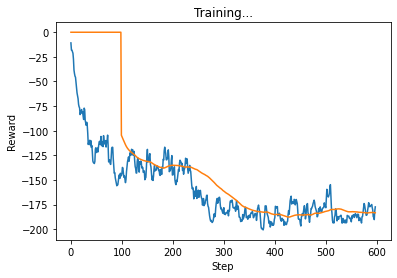

[65.62500000000004, 3.219736567008154, 41.0724300269203, 65.42530012746087]
[65.62500000000004, 3.219736567008154, 41.0724300269203, 65.42530012746087]
set0
show


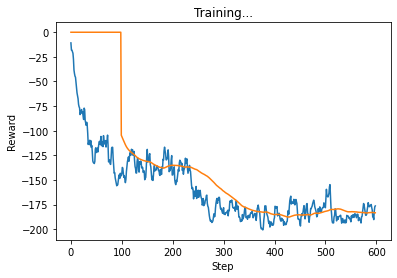

[65.62500000000004, 1.0199320643529959, 42.311840391356355, 65.42530012746087]
show


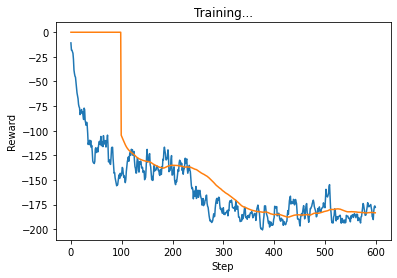

[65.62500000000004, 5.015014463244745, 42.36636118615206, 62.86333040528486]
[65.62500000000004, 5.015014463244745, 42.36636118615206, 62.86333040528486]
set0
show


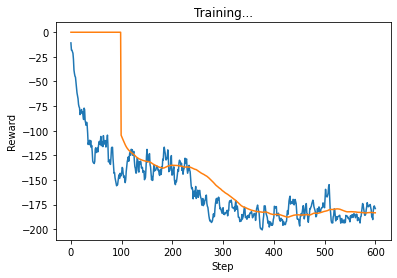

[65.62500000000004, 9.65920970102446, 40.4697826529744, 61.3172485232202]
show


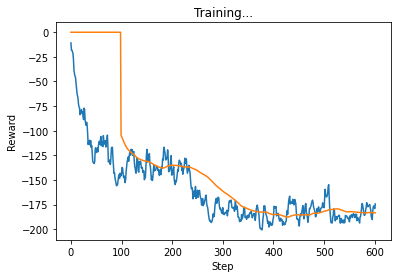

[65.62500000000004, 12.878946268032616, 41.02236135357721, 52.848663045108474]
[65.62500000000004, 12.878946268032616, 41.02236135357721, 52.848663045108474]
set0
show


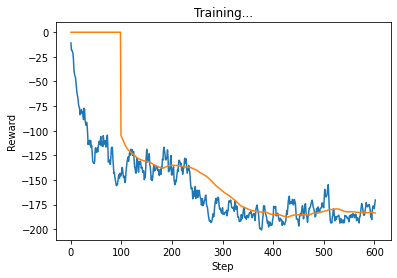

[65.62500000000004, 16.09868283504077, 41.02236135357721, 45.64820887603878]
show


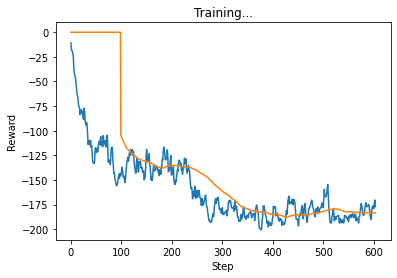

[65.62500000000004, 16.09868283504077, 45.77088814540947, 47.67718310240101]
[65.62500000000004, 16.09868283504077, 45.77088814540947, 47.67718310240101]
set0
show


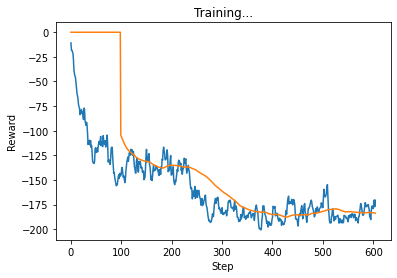

[65.62500000000004, 12.878946268032616, 44.75994248869354, 45.410297194117426]
show


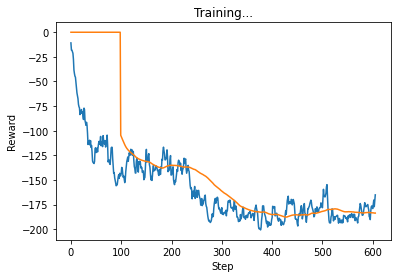

[65.62500000000004, 6.439473134016308, 44.767825961213916, 46.31595527642688]
[65.62500000000004, 6.439473134016308, 44.767825961213916, 46.31595527642688]
set0
show


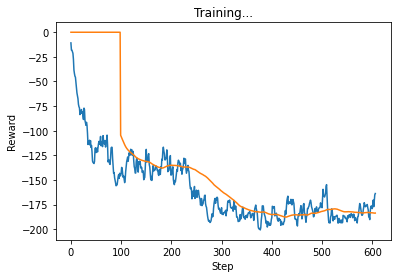

[65.62500000000004, 3.219736567008154, 45.04940594688704, 47.89375713727196]
show


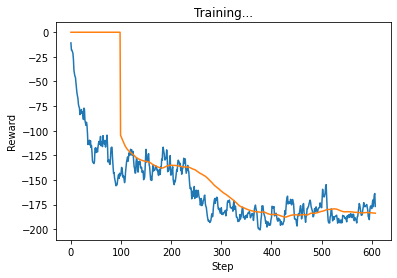

[65.62500000000004, 9.65920970102446, 44.958489345148436, 54.644055148922554]
show


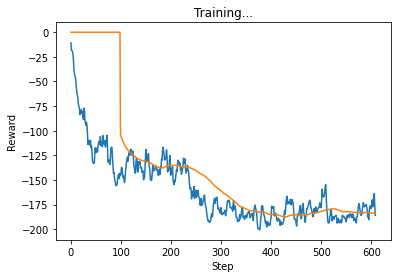

[65.62500000000004, 16.09868283504077, 44.622945931407, 57.497621287929974]
[65.62500000000004, 16.09868283504077, 44.622945931407, 57.497621287929974]
set0
show


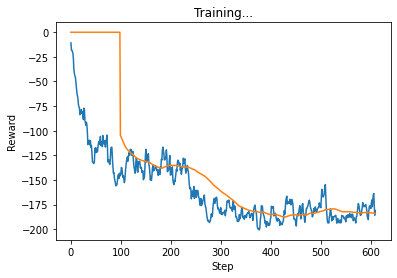

[65.62500000000004, 9.773788777770987, 44.66573074420384, 59.052463687347334]
show


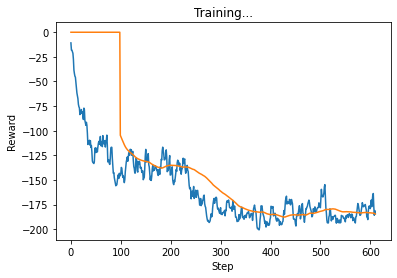

[65.62500000000004, 11.995495208350276, 44.27508940787767, 60.547436733784906]
[65.62500000000004, 11.995495208350276, 44.27508940787767, 60.547436733784906]
set0
show


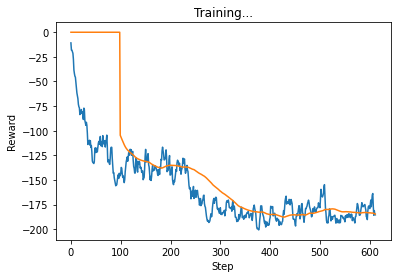

[65.62500000000004, 12.424170031939012, 43.39437099600239, 61.97370246502269]
show


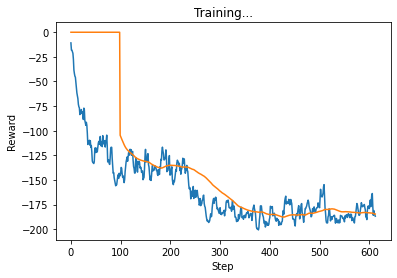

[65.62500000000004, 13.824774477878787, 42.02223986863678, 63.35868487356864]
[65.62500000000004, 13.824774477878787, 42.02223986863678, 63.35868487356864]
set0
show


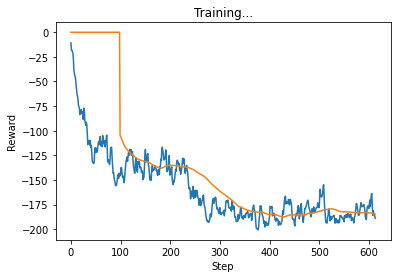

[65.62500000000004, 14.627911475702874, 42.75841941350154, 63.88212833977175]
show


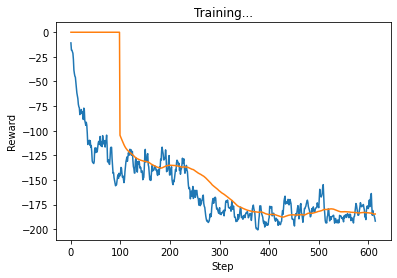

[65.62500000000004, 16.09868283504077, 44.03260548753097, 64.05112983050857]
[65.62500000000004, 16.09868283504077, 44.03260548753097, 64.05112983050857]
set0
show


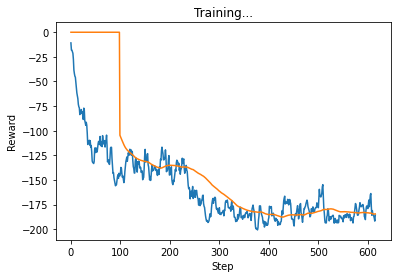

[65.62500000000004, 9.65920970102446, 44.28269598721249, 64.0512276770491]
show


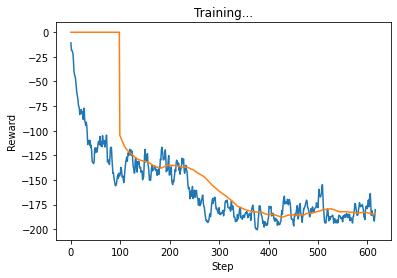

[65.62500000000004, 5.475017861775404, 42.995964233443544, 64.0512276770491]
[65.62500000000004, 5.475017861775404, 42.995964233443544, 64.0512276770491]
set0
show


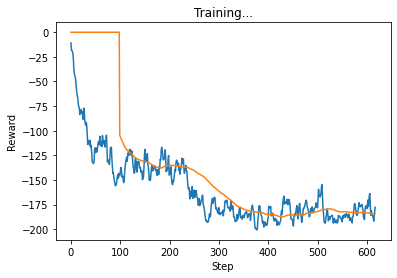

[65.62500000000004, 3.219736567008154, 42.81620827318421, 64.0512276770491]
show


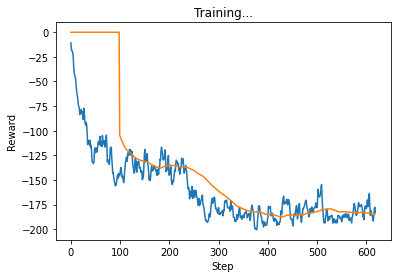

[65.62500000000004, 9.461025070510773, 41.79912545241949, 64.0512276770491]
[65.62500000000004, 9.461025070510773, 41.79912545241949, 64.0512276770491]
set0
show


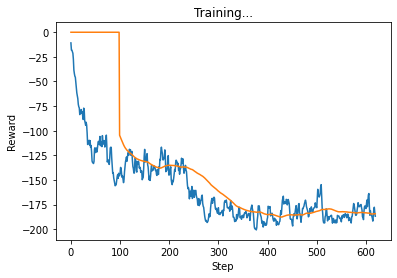

[65.62500000000004, 12.878946268032616, 42.29999513215888, 64.0512276770491]
show


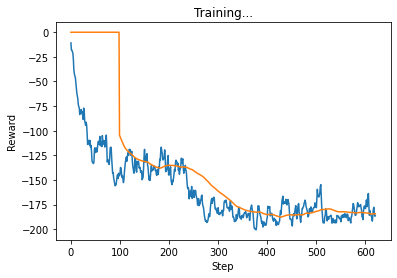

[65.62500000000004, 11.15202215903525, 43.65914465190522, 64.0512276770491]
show


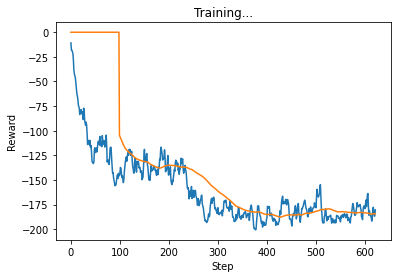

[65.62500000000004, 6.439473134016308, 42.305475261628985, 64.0512276770491]
[65.62500000000004, 6.439473134016308, 42.305475261628985, 64.0512276770491]
set0
show


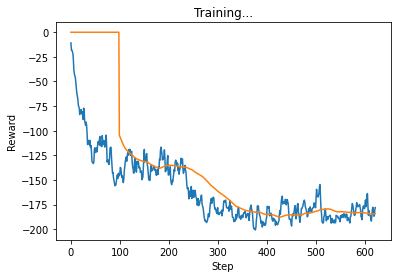

[65.62500000000004, 3.219736567008154, 43.116935983092915, 64.0512276770491]
show


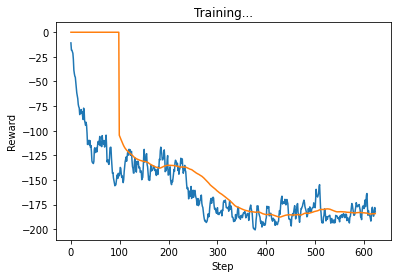

[65.62500000000004, 9.65920970102446, 41.213703036263524, 64.0512276770491]
[65.62500000000004, 9.65920970102446, 41.213703036263524, 64.0512276770491]
set0
show


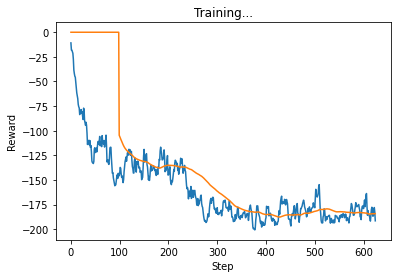

[65.62500000000004, 12.878946268032616, 46.94799834598615, 64.0512276770491]
show


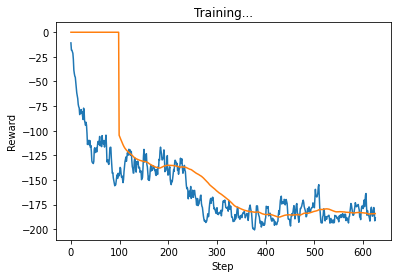

[65.62500000000004, 12.878946268032616, 47.83482648034117, 60.25950720404521]
[65.62500000000004, 12.878946268032616, 47.83482648034117, 60.25950720404521]
set0
show


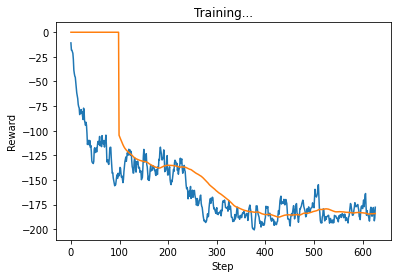

[65.62500000000004, 7.382534530740506, 46.179762036528096, 56.54606473717849]
show


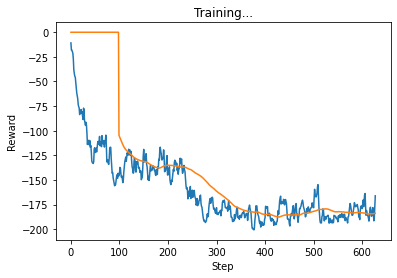

[65.62500000000004, 6.439473134016308, 45.82416994901477, 46.2101746830989]
[65.62500000000004, 6.439473134016308, 45.82416994901477, 46.2101746830989]
set0
show


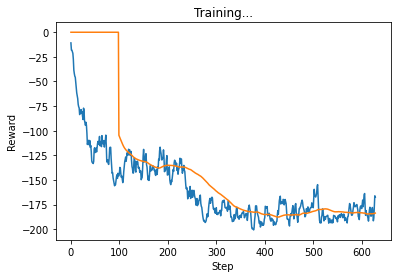

[65.62500000000004, 12.878946268032616, 44.824934429588176, 42.173285273041586]
show


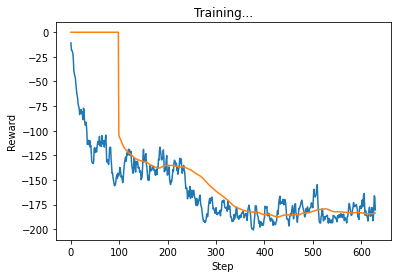

[65.62500000000004, 16.09868283504077, 52.915216160377014, 43.761020250703986]
[65.62500000000004, 16.09868283504077, 52.915216160377014, 43.761020250703986]
set0
show


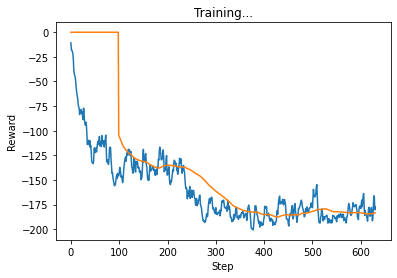

[65.62500000000004, 13.798656116365596, 52.27212642256144, 43.47062959951207]
[65.62500000000004, 13.798656116365596, 52.27212642256144, 43.47062959951207]
set2
show


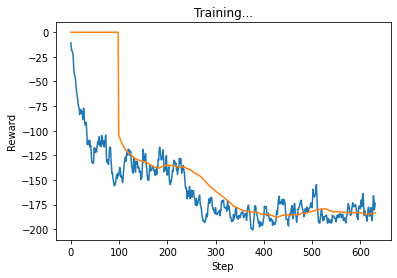

[65.62500000000004, 12.878946268032616, 50.93626782188972, 42.379345423989314]
show


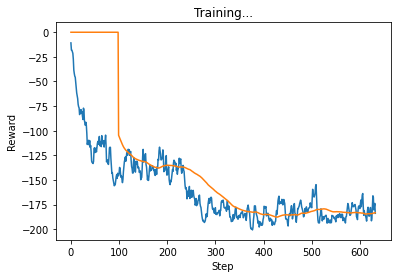

[65.62500000000004, 16.09868283504077, 50.103250997255266, 50.062308879084526]
[65.62500000000004, 16.09868283504077, 50.103250997255266, 50.062308879084526]
set2
show


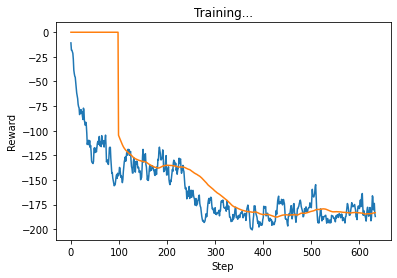

[65.62500000000004, 16.09868283504077, 47.75098622031572, 55.59186696848342]
show


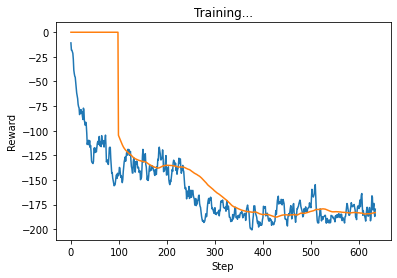

[65.62500000000004, 9.65920970102446, 44.54332145794652, 57.828947672749585]
show


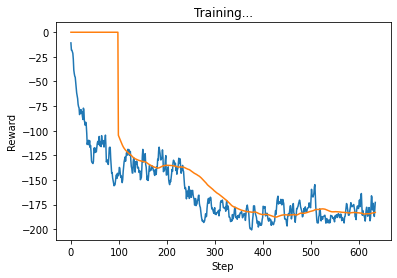

[65.62500000000004, 3.219736567008154, 42.01424849874356, 59.98333317288125]
[65.62500000000004, 3.219736567008154, 42.01424849874356, 59.98333317288125]
set0
show


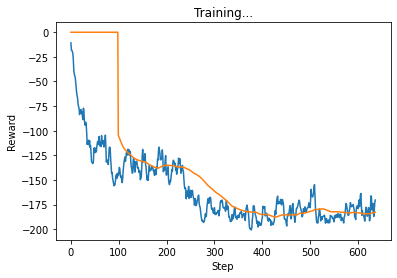

[65.62500000000004, 0.0, 41.46113935257653, 61.28912897581801]
show


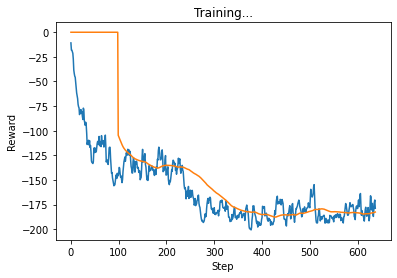

[65.62500000000004, 6.439473134016308, 41.3361089663066, 63.38249978237815]
[65.62500000000004, 6.439473134016308, 41.3361089663066, 63.38249978237815]
set0
show


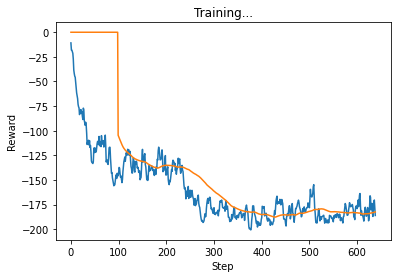

[65.62500000000004, 12.878946268032616, 41.09076882872782, 64.49321020430385]
show


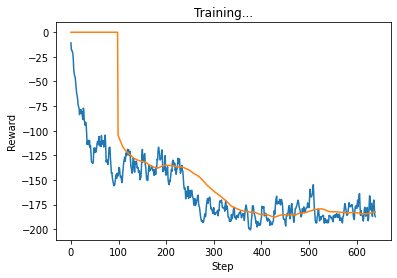

[65.62500000000004, 13.084663699135445, 43.58827996425703, 62.98836951649406]
[65.62500000000004, 13.084663699135445, 43.58827996425703, 62.98836951649406]
set0
show


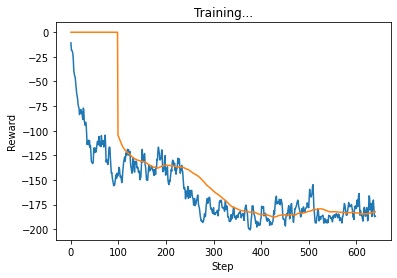

[65.62500000000004, 12.878946268032616, 43.3077710007094, 63.04195090405356]
show


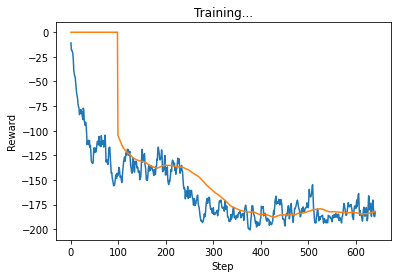

[65.62500000000004, 12.964569574499023, 42.29146734828771, 59.226291835669024]
[65.62500000000004, 12.964569574499023, 42.29146734828771, 59.226291835669024]
set0
show


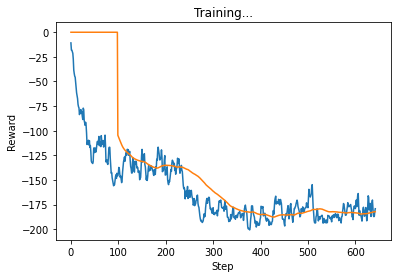

[65.62500000000004, 16.09868283504077, 41.18462732285496, 54.299922345358766]
show


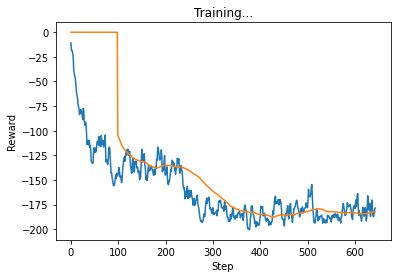

[65.62500000000004, 16.09868283504077, 41.91846528703086, 52.83118695552205]
[65.62500000000004, 16.09868283504077, 41.91846528703086, 52.83118695552205]
set0
show


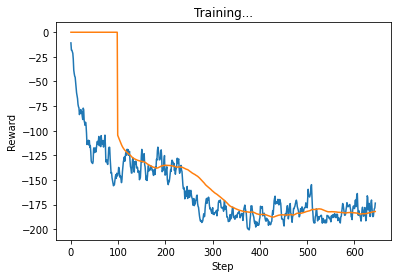

[65.62500000000004, 12.878946268032616, 43.243564821107405, 49.802545760848695]
show


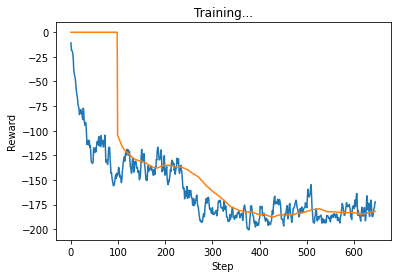

[65.62500000000004, 12.498382733897003, 43.66069684511749, 48.45332764750682]
[65.62500000000004, 12.498382733897003, 43.66069684511749, 48.45332764750682]
set0
show


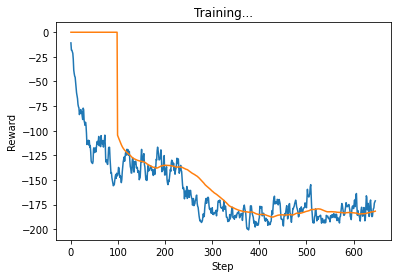

[65.62500000000004, 9.65920970102446, 44.963519686156246, 48.96695258072714]
show


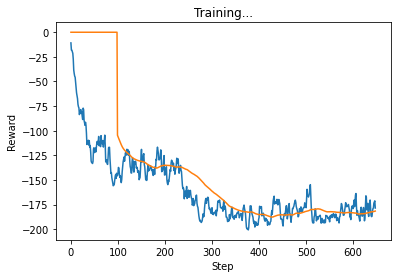

[65.62500000000004, 13.767570406571346, 45.279721654643424, 51.85838528766303]
show


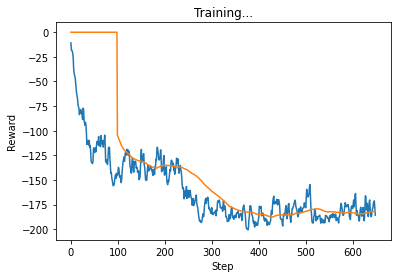

[65.62500000000004, 16.09868283504077, 44.55757607843917, 57.5115050764363]
[65.62500000000004, 16.09868283504077, 44.55757607843917, 57.5115050764363]
set0
show


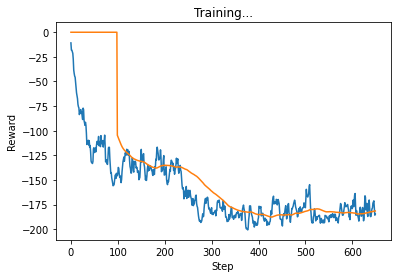

[65.62500000000004, 13.97178601692555, 43.485679505133874, 59.71813654452316]
show


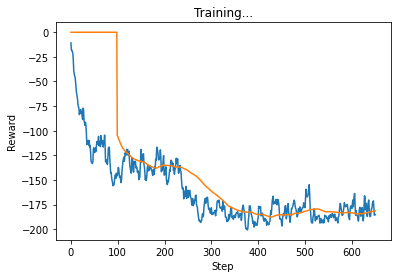

[65.62500000000004, 14.863919774772425, 41.66399480982055, 60.98172038675974]
[65.62500000000004, 14.863919774772425, 41.66399480982055, 60.98172038675974]
set0
show


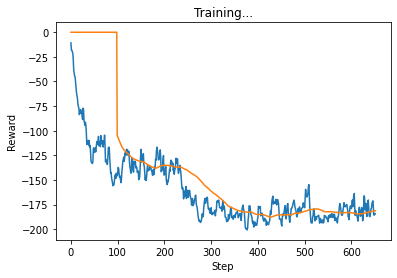

[65.62500000000004, 12.878946268032616, 41.788200713621535, 62.093104815629744]
show


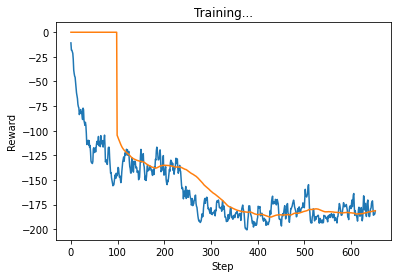

[65.62500000000004, 9.65920970102446, 41.08060312835225, 62.889584542263584]
[65.62500000000004, 9.65920970102446, 41.08060312835225, 62.889584542263584]
set0
show


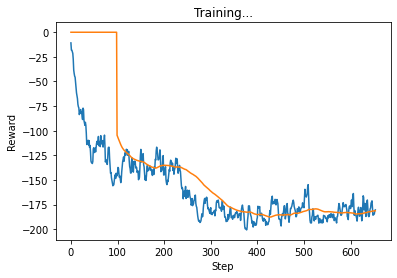

[65.62500000000004, 9.65920970102446, 42.90537867504294, 60.230580323494515]
show


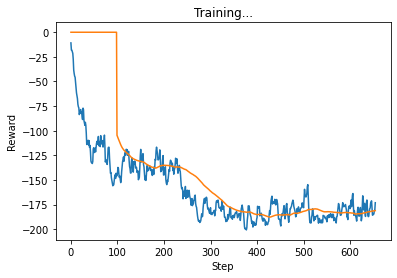

[65.62500000000004, 6.439473134016308, 43.993841792990565, 55.0548149070548]
[65.62500000000004, 6.439473134016308, 43.993841792990565, 55.0548149070548]
set0
show


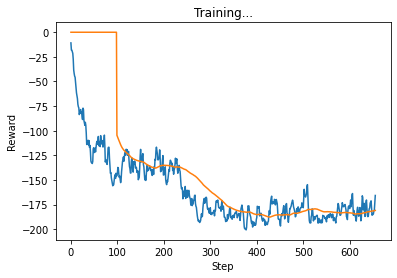

[65.62500000000004, 8.257350448634131, 42.37021082927686, 47.511338555524354]
show


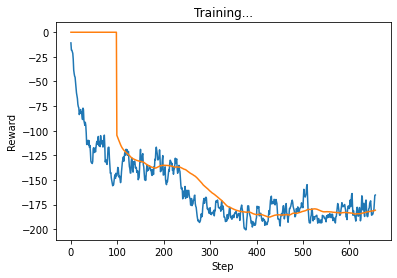

[65.62500000000004, 9.65920970102446, 42.657736571530464, 45.360323832622214]
[65.62500000000004, 9.65920970102446, 42.657736571530464, 45.360323832622214]
set0
show


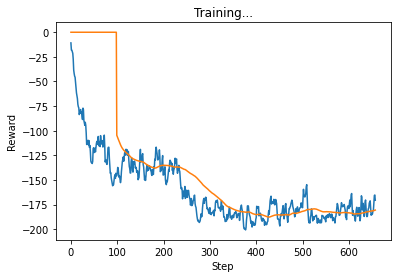

[65.62500000000004, 11.54790772538648, 48.92436932578266, 42.51174734848957]
show


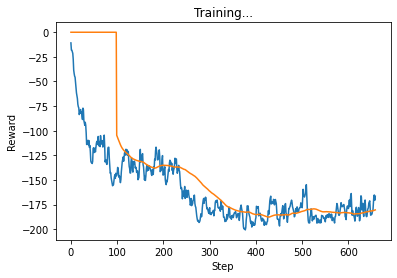

[65.62500000000004, 9.65920970102446, 46.71209695311021, 42.57665774191801]
[65.62500000000004, 9.65920970102446, 46.71209695311021, 42.57665774191801]
set0
show


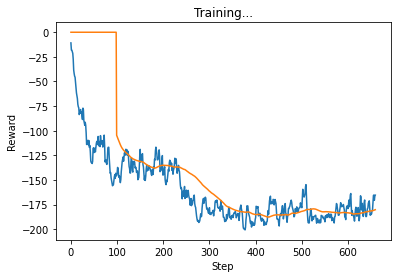

[65.62500000000004, 9.65920970102446, 45.709007750467194, 42.42851582465496]
show


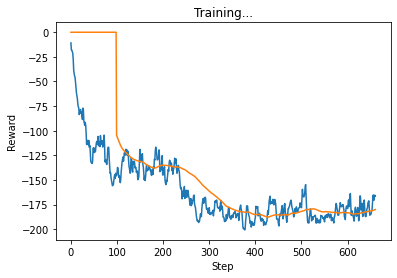

[65.62500000000004, 12.878946268032616, 45.33353023586518, 40.84942486194537]
show


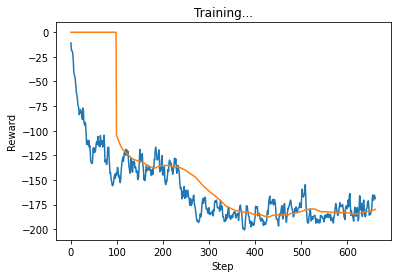

[65.62500000000004, 12.878946268032616, 49.41508140537282, 39.076703057579266]
[65.62500000000004, 12.878946268032616, 49.41508140537282, 39.076703057579266]
set0
show


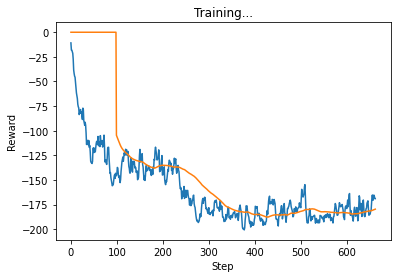

[65.62500000000004, 12.878946268032616, 49.981976530461665, 38.50213765286522]
show


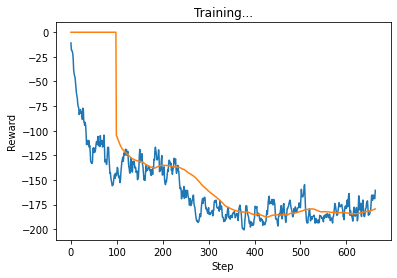

[65.62500000000004, 3.6823926729291774, 49.3050640359303, 39.968481729429236]
[65.62500000000004, 3.6823926729291774, 49.3050640359303, 39.968481729429236]
set0
show


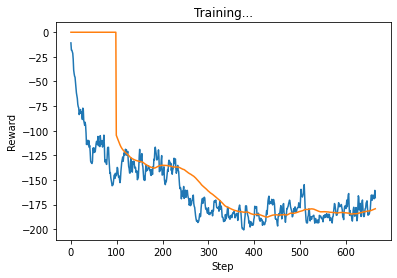

[65.62500000000004, 6.439473134016308, 53.117436702469774, 40.753125868860245]
[65.62500000000004, 6.439473134016308, 53.117436702469774, 40.753125868860245]
set2
show


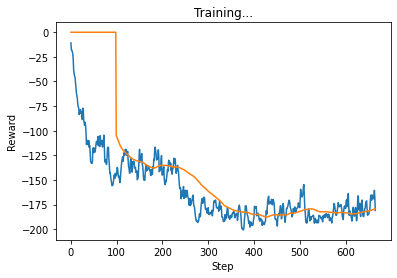

[65.62500000000004, 12.67603930239837, 52.68978995020516, 48.02283289783811]
show


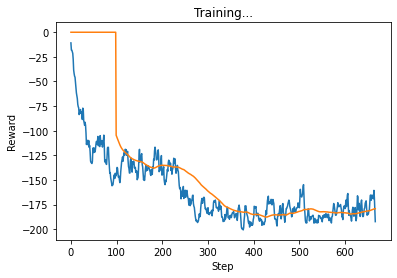

[65.62500000000004, 18.095419161440578, 51.44533857488416, 55.173193208791595]
[65.62500000000004, 18.095419161440578, 51.44533857488416, 55.173193208791595]
set2
show


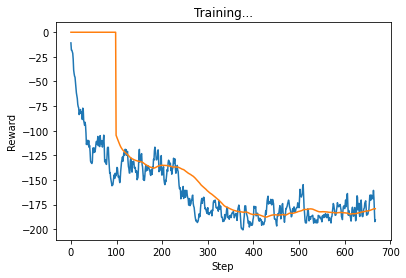

[65.62500000000004, 16.09868283504077, 48.468941376760924, 58.54900298874576]
show


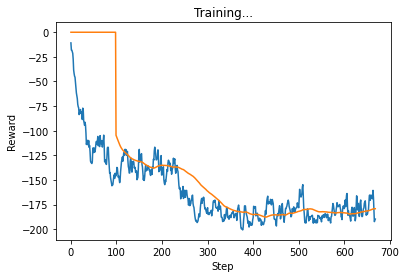

[65.62500000000004, 16.018615817749644, 46.22747979869544, 59.870221014061336]
show


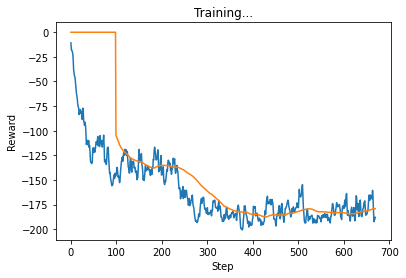

[65.62500000000004, 12.878946268032616, 45.34134281913443, 62.09320255021321]
[65.62500000000004, 12.878946268032616, 45.34134281913443, 62.09320255021321]
set0
show


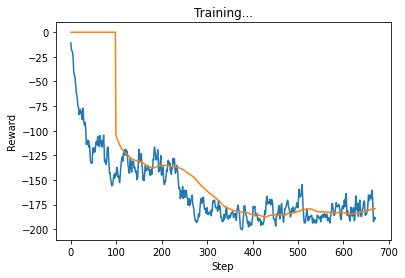

[65.62500000000004, 11.475825577776869, 47.22019325581715, 63.20391297213893]
show


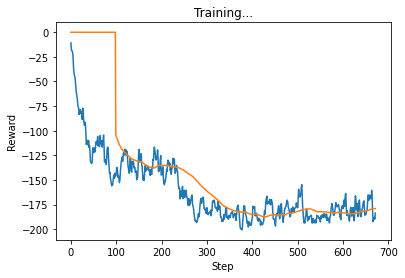

[65.62500000000004, 6.439473134016308, 45.229312667146516, 64.31462339406464]
[65.62500000000004, 6.439473134016308, 45.229312667146516, 64.31462339406464]
set0
show


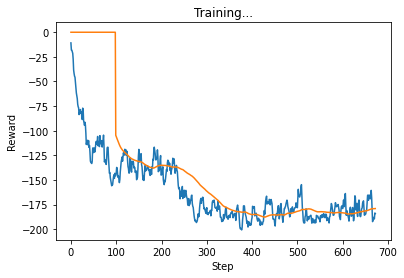

[65.62500000000004, 6.439473134016308, 44.76743352308672, 65.17307880948452]
show


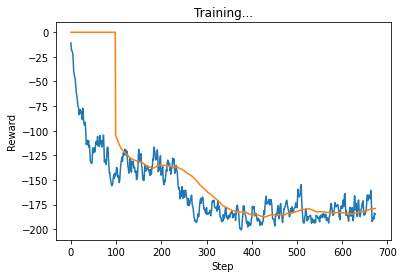

[65.62500000000004, 7.005438914050066, 44.95374146422712, 65.42533381599036]
[65.62500000000004, 7.005438914050066, 44.95374146422712, 65.42533381599036]
set0
show


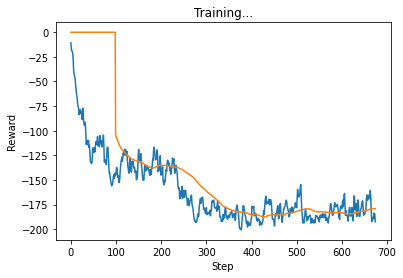

[65.62500000000004, 12.878946268032616, 46.57339381451406, 65.42533381599036]
show


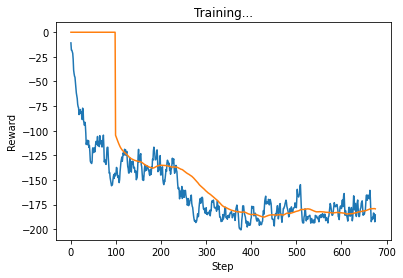

[65.62500000000004, 6.439473134016308, 46.07647861888649, 65.42533381599036]
[65.62500000000004, 6.439473134016308, 46.07647861888649, 65.42533381599036]
set0
show


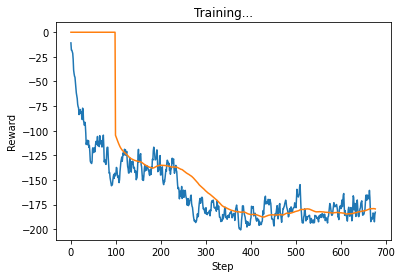

[65.62500000000004, 3.219736567008154, 46.543678566372265, 65.42533381599036]
show


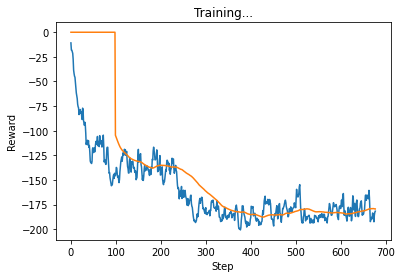

[65.62500000000004, 3.219736567008154, 45.46952587253183, 65.42533381599036]
[65.62500000000004, 3.219736567008154, 45.46952587253183, 65.42533381599036]
set0
show


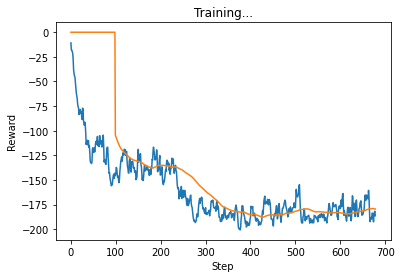

[65.62500000000004, 6.439473134016308, 46.87438138301613, 65.42533381599036]
show


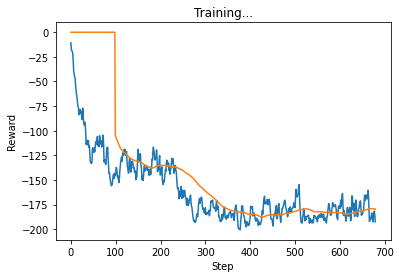

[65.62500000000004, 10.720720167595434, 48.76056621405587, 65.42533381599036]
[65.62500000000004, 10.720720167595434, 48.76056621405587, 65.42533381599036]
set0
show


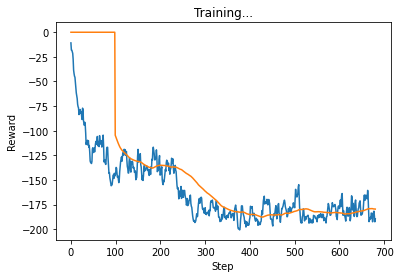

[65.62500000000004, 9.65920970102446, 46.84144437899646, 65.42533381599036]
show


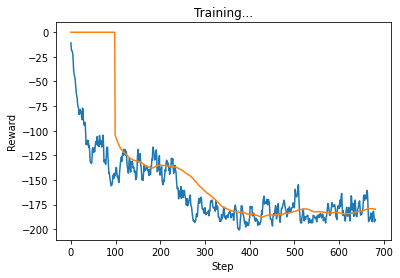

[65.62500000000004, 12.878946268032616, 45.15687776692221, 65.42533381599036]
show


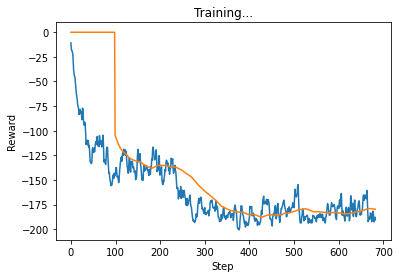

[65.62500000000004, 10.583731394730139, 44.31342068527161, 65.42533381599036]
[65.62500000000004, 10.583731394730139, 44.31342068527161, 65.42533381599036]
set0
show


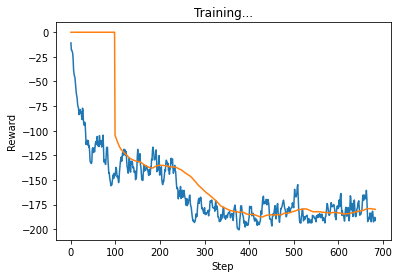

[65.62500000000004, 12.878946268032616, 45.218309444806664, 65.42533381599036]
show


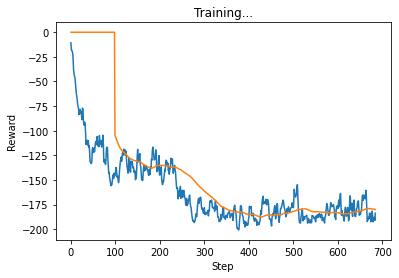

[65.62500000000004, 6.439473134016308, 44.80953682256836, 64.9293935646992]
[65.62500000000004, 6.439473134016308, 44.80953682256836, 64.9293935646992]
set0
show


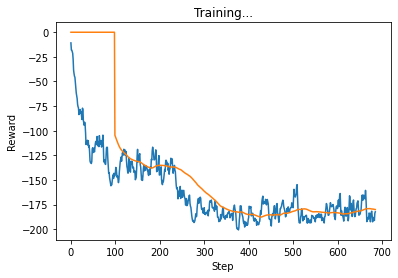

[65.62500000000004, 6.439473134016308, 45.43675387745177, 62.86336409381435]
show


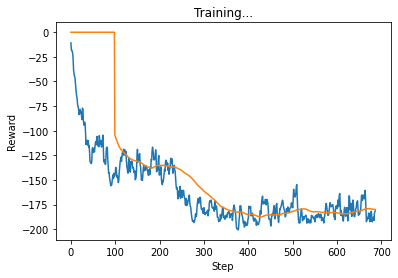

[65.62500000000004, 6.439473134016308, 44.82252550849564, 62.525053932117295]
[65.62500000000004, 6.439473134016308, 44.82252550849564, 62.525053932117295]
set0
show


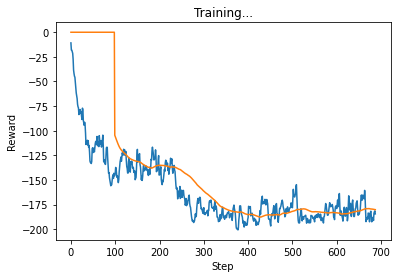

[65.62500000000004, 9.65920970102446, 45.505907727899, 61.675013545818324]
show


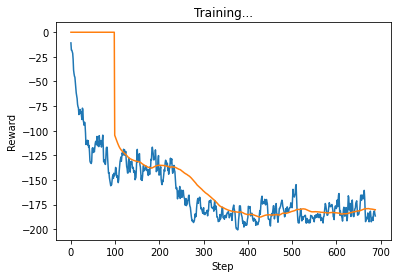

[65.62500000000004, 12.491756648386106, 44.69807690390303, 61.78826155784503]
[65.62500000000004, 12.491756648386106, 44.69807690390303, 61.78826155784503]
set0
show


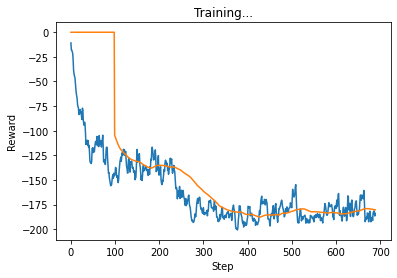

[65.62500000000004, 9.65920970102446, 44.73043440463115, 61.78826155784503]
show


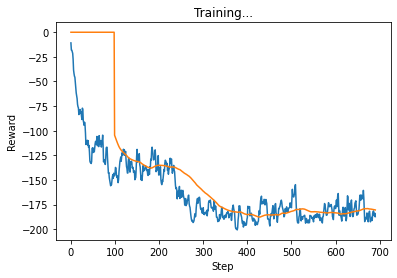

[65.62500000000004, 11.454058879923847, 46.39207419755379, 61.78826155784503]
[65.62500000000004, 11.454058879923847, 46.39207419755379, 61.78826155784503]
set0
show


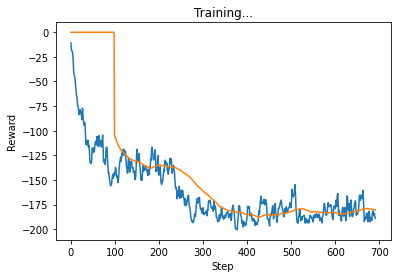

[65.62500000000004, 12.878946268032616, 46.64217883124395, 61.78826155784503]
show


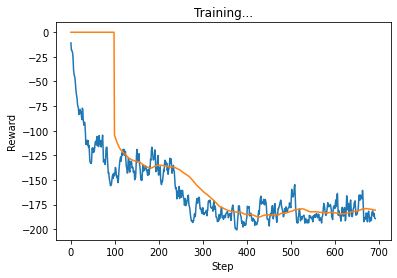

[65.62500000000004, 12.878946268032616, 46.93273793035999, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 46.93273793035999, 61.78826155784503]
set0
show


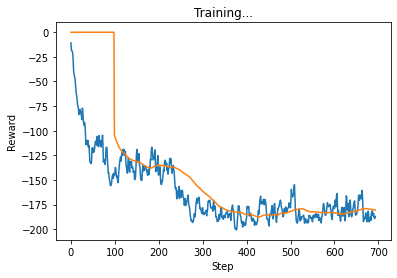

[65.62500000000004, 9.65920970102446, 48.107152045436514, 61.78826155784503]
show


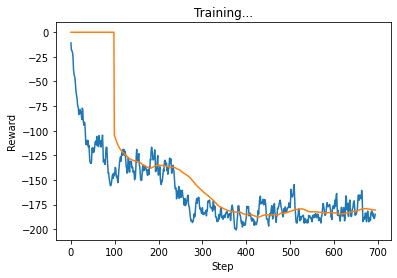

[65.62500000000004, 6.439473134016308, 48.97577438201314, 61.78826155784503]
show


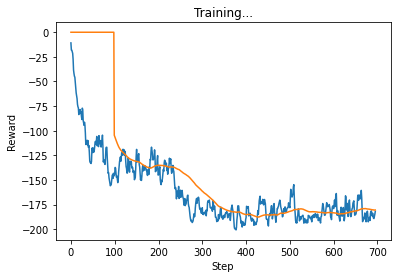

[65.62500000000004, 3.219736567008154, 49.35380008226235, 61.78826155784503]
[65.62500000000004, 3.219736567008154, 49.35380008226235, 61.78826155784503]
set0
show


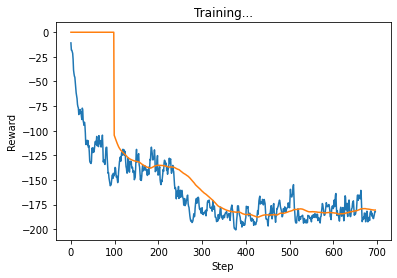

[65.62500000000004, 3.219736567008154, 49.442932245754065, 61.78826155784503]
show


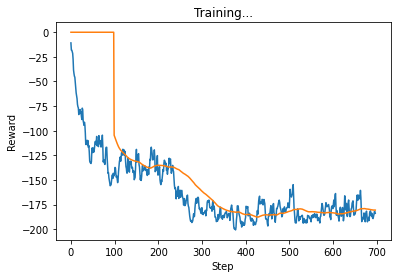

[65.62500000000004, 6.439473134016308, 48.05755342842302, 61.78826155784503]
[65.62500000000004, 6.439473134016308, 48.05755342842302, 61.78826155784503]
set0
show


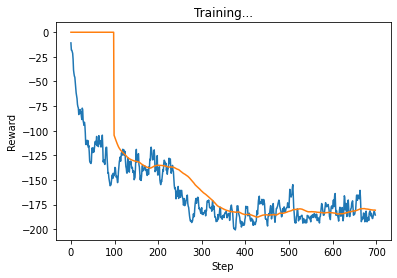

[65.62500000000004, 7.085314952357384, 49.15872935060298, 61.78826155784503]
show


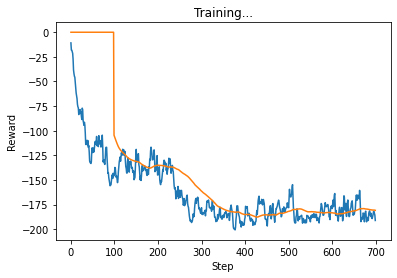

[65.62500000000004, 12.878946268032616, 48.864446363471316, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 48.864446363471316, 61.78826155784503]
set0
show


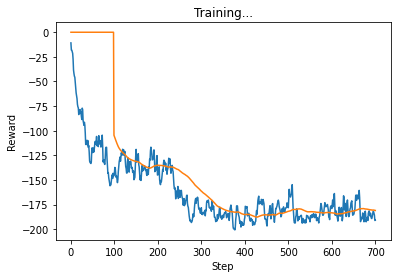

[65.62500000000004, 12.878946268032616, 48.66312398831181, 61.78826155784503]
show


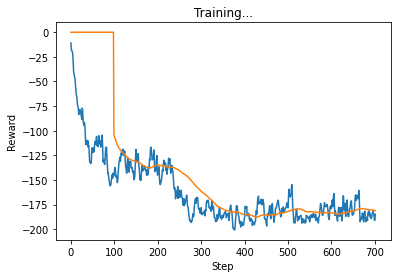

[65.62500000000004, 6.439473134016308, 49.01353948642122, 61.78826155784503]
[65.62500000000004, 6.439473134016308, 49.01353948642122, 61.78826155784503]
set0
show


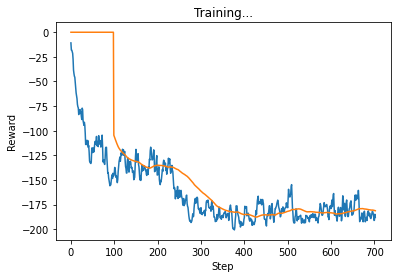

[65.62500000000004, 8.875171101352986, 49.77767991722874, 61.78826155784503]
show


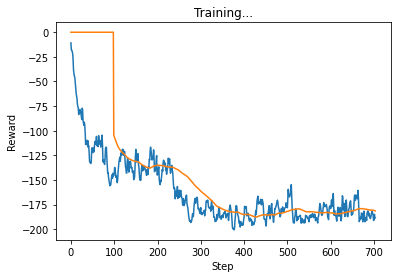

[65.62500000000004, 9.65920970102446, 49.45678957494684, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 49.45678957494684, 61.78826155784503]
set0
show


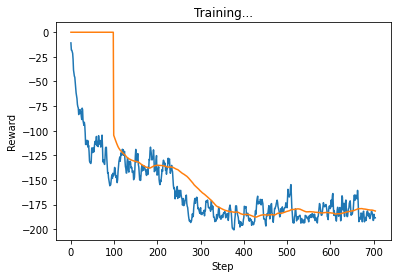

[65.62500000000004, 9.65920970102446, 49.379710489812666, 61.78826155784503]
show


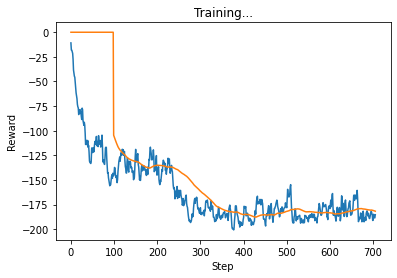

[65.62500000000004, 6.439473134016308, 49.45678957494684, 61.78826155784503]
[65.62500000000004, 6.439473134016308, 49.45678957494684, 61.78826155784503]
set0
show


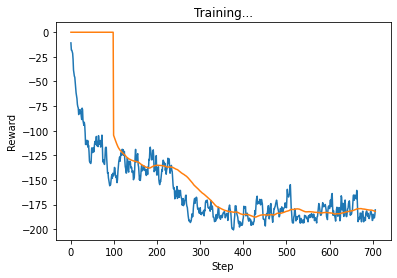

[65.62500000000004, 3.219736567008154, 47.75439575924867, 61.78826155784503]
show


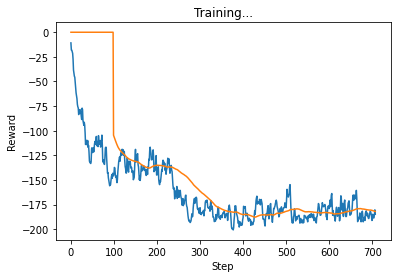

[65.62500000000004, 9.65920970102446, 48.133646376202854, 59.37331131456853]
show


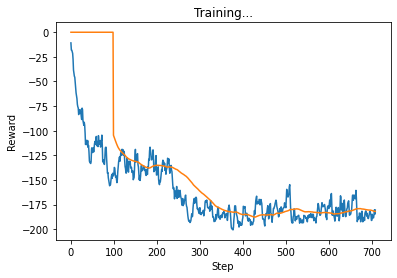

[65.62500000000004, 6.439473134016308, 47.298310547030084, 59.226291835669024]
[65.62500000000004, 6.439473134016308, 47.298310547030084, 59.226291835669024]
set0
show


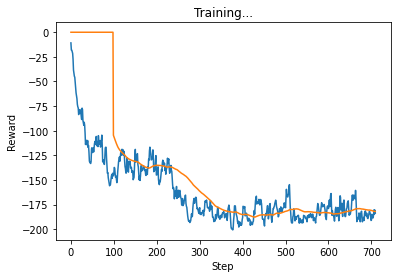

[65.62500000000004, 9.65920970102446, 49.32374751964714, 56.81669874453717]
show


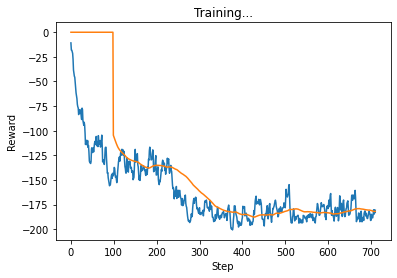

[65.62500000000004, 6.439473134016308, 48.55584466116481, 58.18624272114826]
[65.62500000000004, 6.439473134016308, 48.55584466116481, 58.18624272114826]
set0
show


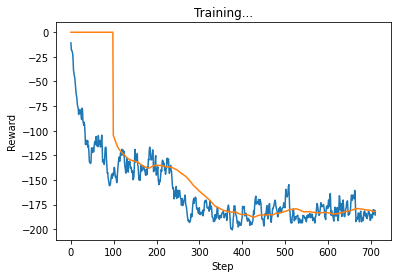

[65.62500000000004, 9.65920970102446, 47.63498172742536, 60.677551135919316]
show


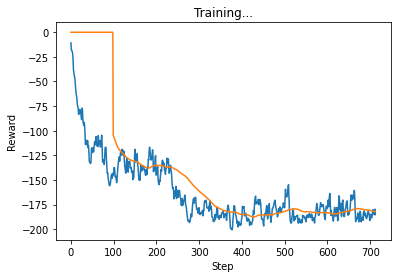

[65.62500000000004, 3.7327940772136454, 47.83806880314248, 60.677551135919316]
[65.62500000000004, 3.7327940772136454, 47.83806880314248, 60.677551135919316]
set0
show


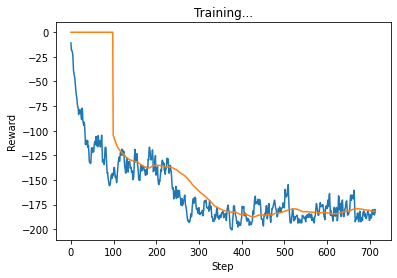

[65.62500000000004, 6.439473134016308, 48.08805990044601, 60.677551135919316]
show


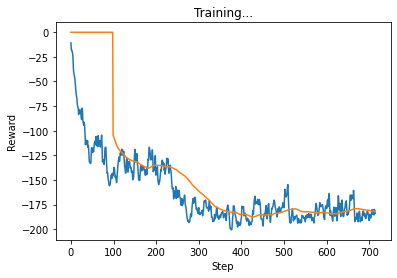

[65.62500000000004, 6.439473134016308, 49.1815889085272, 60.677551135919316]
[65.62500000000004, 6.439473134016308, 49.1815889085272, 60.677551135919316]
set0
show


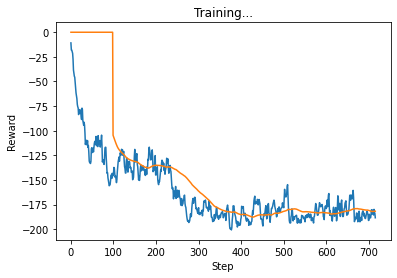

[65.62500000000004, 12.267377499445324, 47.83813508234256, 60.677551135919316]
show


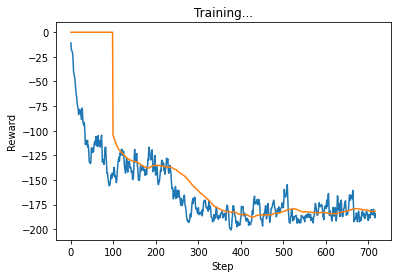

[65.62500000000004, 7.188733861776127, 48.55541907890962, 61.19388110055922]
[65.62500000000004, 7.188733861776127, 48.55541907890962, 61.19388110055922]
set0
show


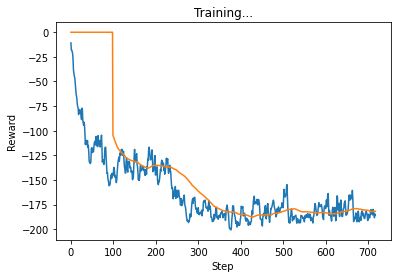

[65.62500000000004, 8.407255584642582, 47.83813508234256, 61.69813860507526]
show


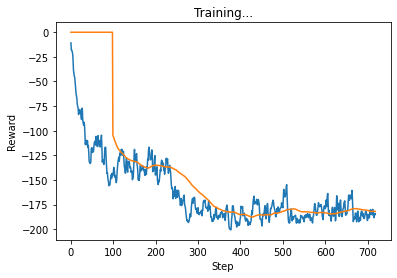

[65.62500000000004, 6.439473134016308, 48.32172404099356, 61.78826155784503]
[65.62500000000004, 6.439473134016308, 48.32172404099356, 61.78826155784503]
set0
show


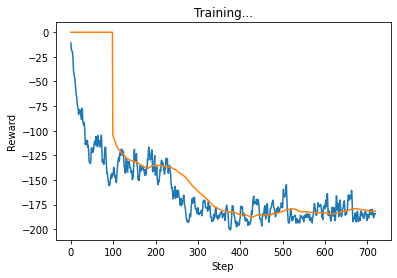

[65.62500000000004, 6.439473134016308, 48.341035914424964, 61.78826155784503]
show


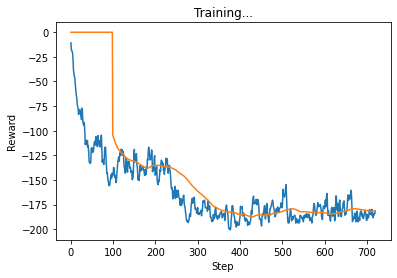

[65.62500000000004, 4.256830022065131, 47.52726115528091, 61.78826155784503]
show


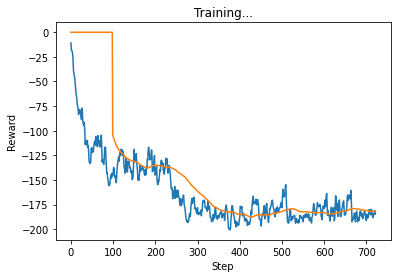

[65.62500000000004, 7.729264453704841, 47.52746883552004, 61.78826155784503]
[65.62500000000004, 7.729264453704841, 47.52746883552004, 61.78826155784503]
set0
show


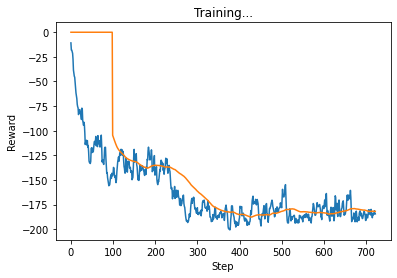

[65.62500000000004, 6.439473134016308, 48.63193816678428, 61.78826155784503]
show


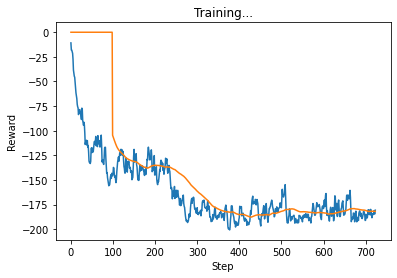

[65.62500000000004, 4.332700596036073, 46.96353747251368, 61.78826155784503]
[65.62500000000004, 4.332700596036073, 46.96353747251368, 61.78826155784503]
set0
show


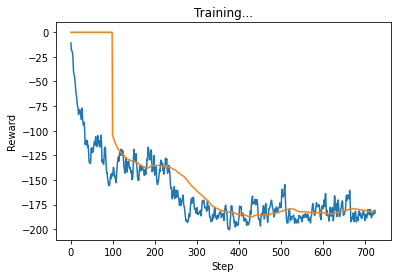

[65.62500000000004, 6.439473134016308, 47.21245735705678, 61.78826155784503]
show


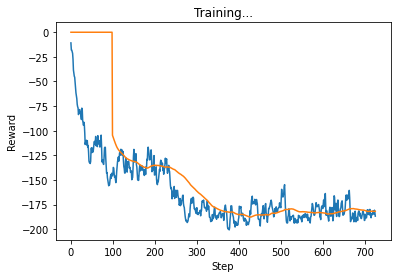

[65.62500000000004, 9.65920970102446, 47.70272844035359, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 47.70272844035359, 61.78826155784503]
set0
show


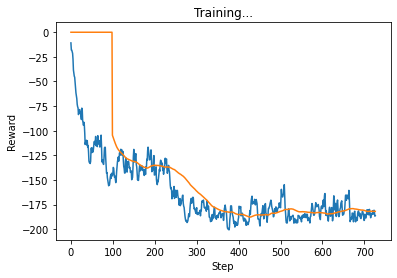

[65.62500000000004, 9.65920970102446, 47.28893490304394, 61.78826155784503]
show


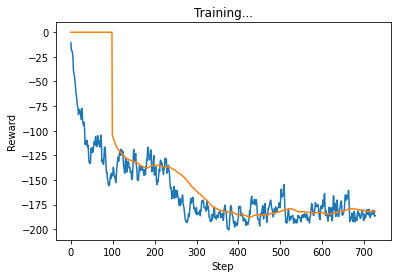

[65.62500000000004, 9.65920970102446, 47.28893490304394, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 47.28893490304394, 61.78826155784503]
set0
show


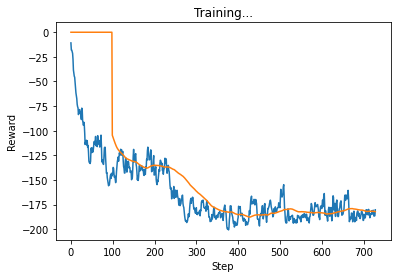

[65.62500000000004, 3.219736567008154, 47.65516448691009, 61.78826155784503]
show


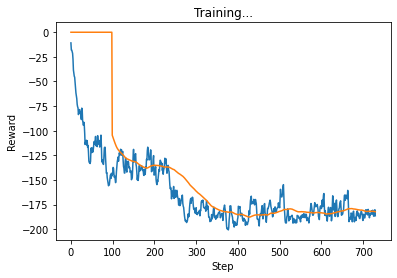

[65.62500000000004, 9.65920970102446, 47.28893490304394, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 47.28893490304394, 61.78826155784503]
set0
show


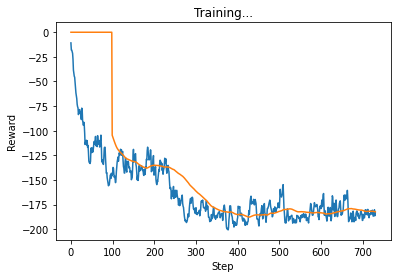

[65.62500000000004, 6.439473134016308, 47.28893490304394, 61.78826155784503]
show


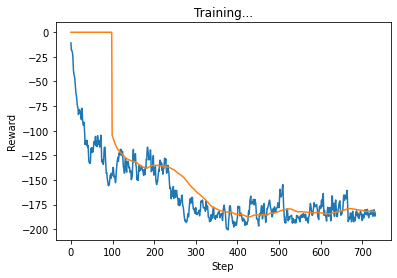

[65.62500000000004, 9.628779957912352, 47.28893490304394, 61.78826155784503]
[65.62500000000004, 9.628779957912352, 47.28893490304394, 61.78826155784503]
set0
show


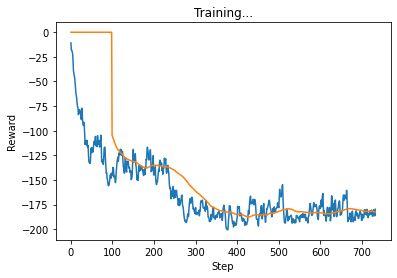

[65.62500000000004, 3.219736567008154, 47.1724480678768, 61.78826155784503]
show


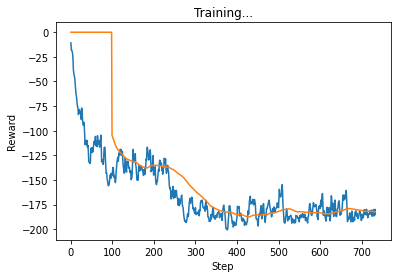

[65.62500000000004, 9.65920970102446, 45.598064379652826, 61.78826155784503]
show


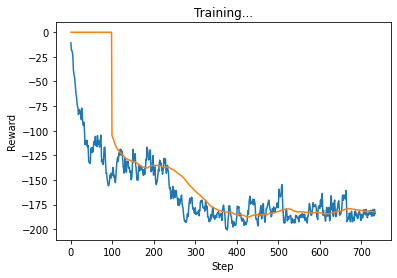

[65.62500000000004, 6.439473134016308, 47.14347457033324, 61.78826155784503]
[65.62500000000004, 6.439473134016308, 47.14347457033324, 61.78826155784503]
set0
show


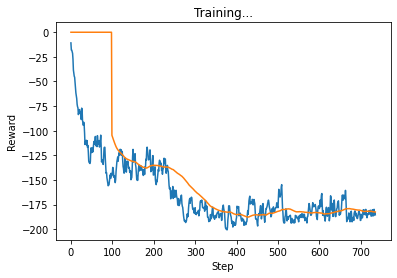

[65.62500000000004, 9.65920970102446, 46.35485723050914, 61.78826155784503]
show


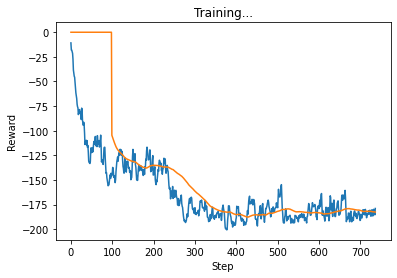

[65.62500000000004, 6.439473134016308, 43.134469957874416, 61.78826155784503]
[65.62500000000004, 6.439473134016308, 43.134469957874416, 61.78826155784503]
set0
show


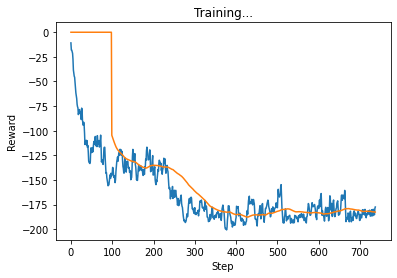

[65.62500000000004, 6.439473134016308, 41.60972563761252, 61.78826155784503]
show


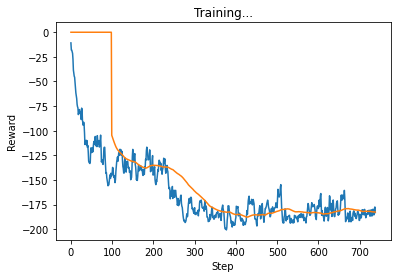

[65.62500000000004, 9.65920970102446, 44.049125395923205, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 44.049125395923205, 61.78826155784503]
set0
show


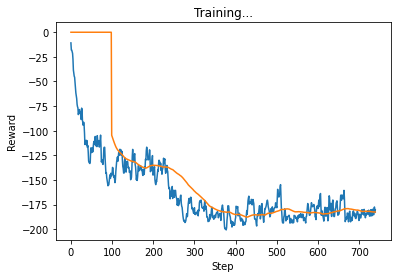

[65.62500000000004, 6.439473134016308, 44.26389626692573, 61.78826155784503]
show


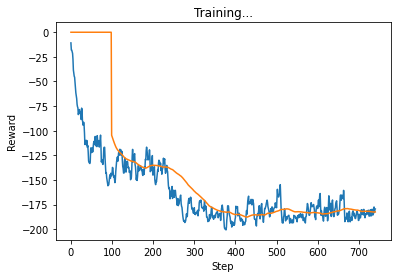

[65.62500000000004, 6.9936956758303275, 43.08314033308394, 61.78826155784503]
[65.62500000000004, 6.9936956758303275, 43.08314033308394, 61.78826155784503]
set0
show


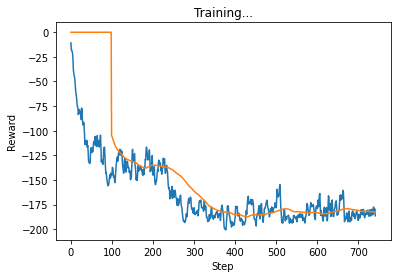

[65.62500000000004, 9.65920970102446, 47.36459759954009, 61.78826155784503]
show


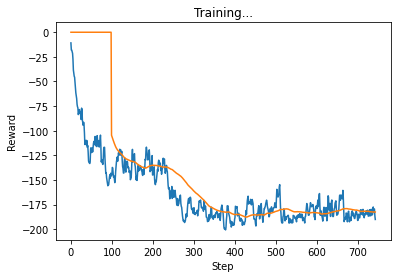

[65.62500000000004, 11.088688289179855, 49.61237573291393, 61.78826155784503]
[65.62500000000004, 11.088688289179855, 49.61237573291393, 61.78826155784503]
set0
show


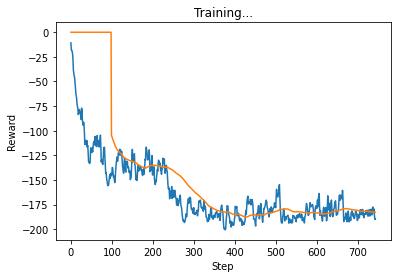

[65.62500000000004, 12.878946268032616, 47.54957681054426, 61.78826155784503]
show


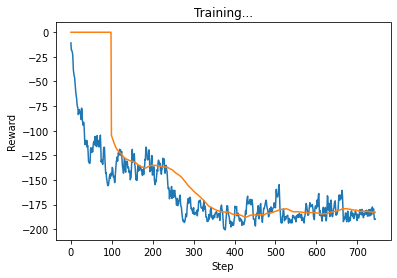

[65.62500000000004, 12.878946268032616, 47.47858285975688, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 47.47858285975688, 61.78826155784503]
set0
show


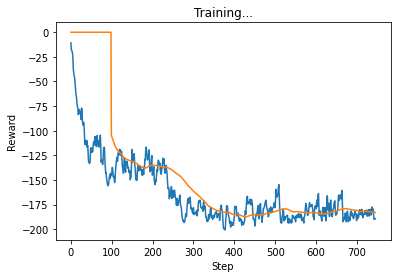

[65.62500000000004, 13.660742099564175, 46.20604256034356, 61.78826155784503]
show


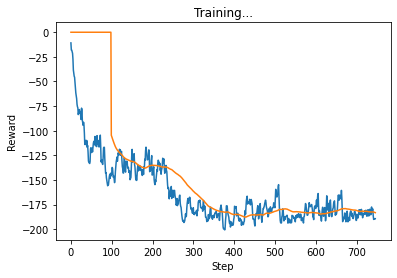

[65.62500000000004, 12.878946268032616, 47.02179450606566, 61.78826155784503]
show


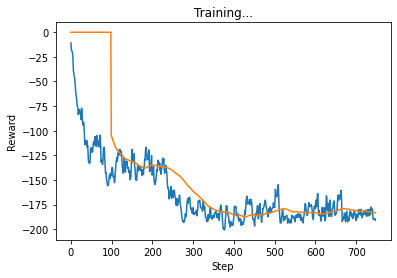

[65.62500000000004, 12.878946268032616, 48.80693908124226, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 48.80693908124226, 61.78826155784503]
set0
show


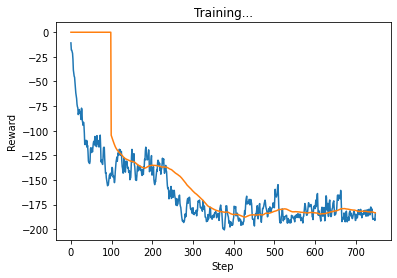

[65.62500000000004, 6.5333606077864275, 48.495102183166125, 61.78826155784503]
show


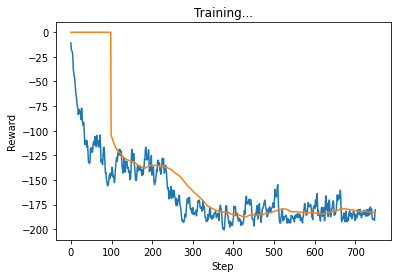

[65.62500000000004, 3.219736567008154, 47.55795997018055, 61.78826155784503]
[65.62500000000004, 3.219736567008154, 47.55795997018055, 61.78826155784503]
set0
show


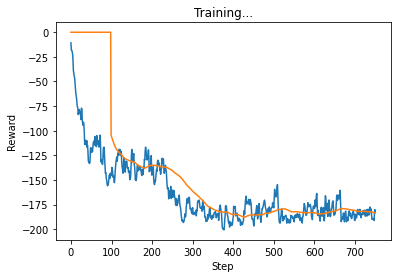

[65.62500000000004, 6.439473134016308, 47.25674528627016, 61.78826155784503]
show


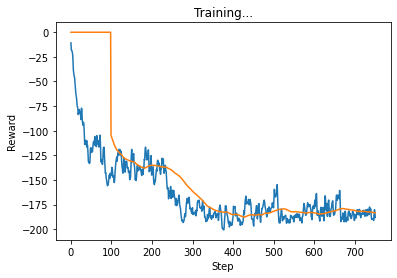

[65.62500000000004, 12.497665666588148, 48.05159299160522, 60.056523038399575]
[65.62500000000004, 12.497665666588148, 48.05159299160522, 60.056523038399575]
set0
show


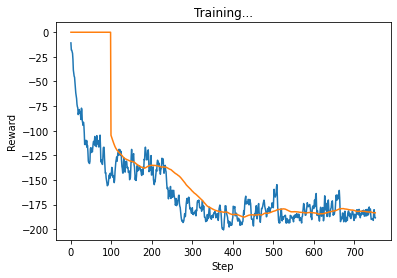

[65.62500000000004, 12.878946268032616, 50.28037816258754, 57.705664656966064]
[65.62500000000004, 12.878946268032616, 50.28037816258754, 57.705664656966064]
set2
show


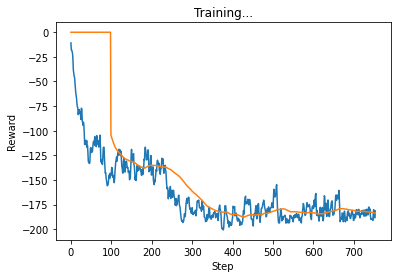

[65.62500000000004, 16.09868283504077, 47.51730632718686, 50.28669332293246]
show


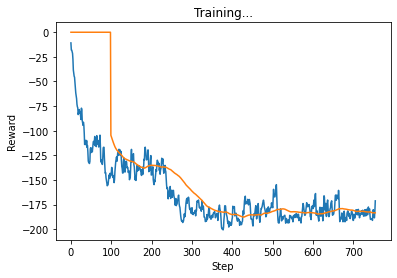

[65.62500000000004, 16.09868283504077, 46.242601420004824, 41.252275849442]
show


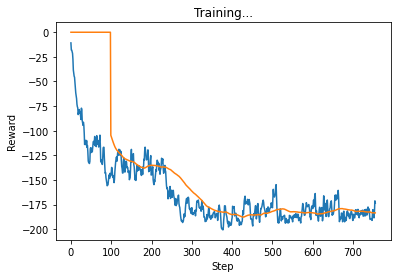

[65.62500000000004, 16.09868283504077, 46.08209062107488, 43.83023334734836]
[65.62500000000004, 16.09868283504077, 46.08209062107488, 43.83023334734836]
set0
show


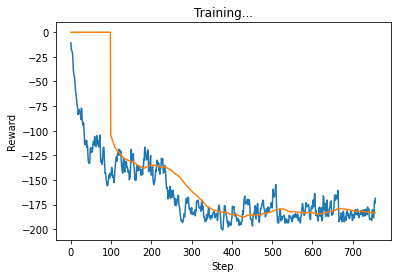

[65.62500000000004, 14.99131150713012, 42.93612622041976, 43.034031037602375]
show


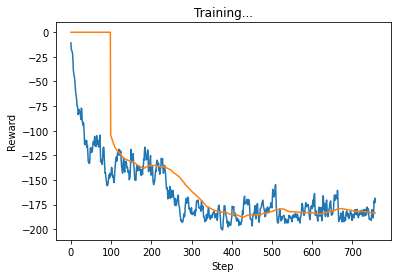

[65.62500000000004, 16.09868283504077, 45.54062266982902, 42.90564474830628]
[65.62500000000004, 16.09868283504077, 45.54062266982902, 42.90564474830628]
set0
show


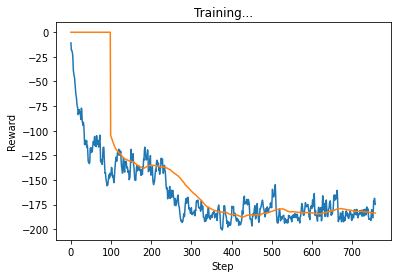

[65.62500000000004, 19.257274725143073, 43.97587579696247, 43.96297966970277]
show


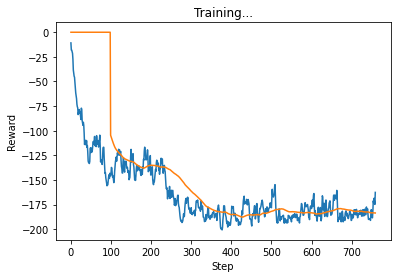

[65.62500000000004, 12.878946268032616, 44.211334708482426, 37.92189640055511]
[65.62500000000004, 12.878946268032616, 44.211334708482426, 37.92189640055511]
set0
show


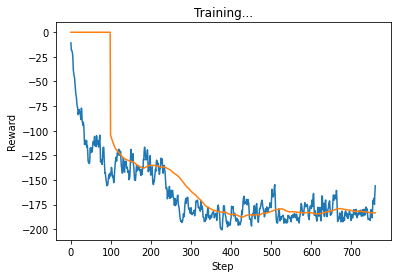

[65.62500000000004, 6.439473134016308, 43.710361018726914, 38.230212884271374]
show


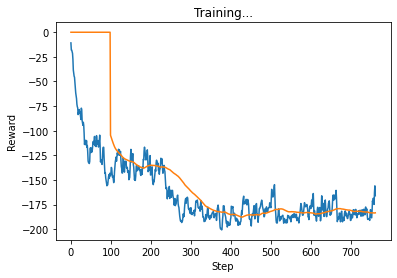

[65.62500000000004, 6.439473134016308, 46.876045546615096, 45.10192047551706]
[65.62500000000004, 6.439473134016308, 46.876045546615096, 45.10192047551706]
set0
show


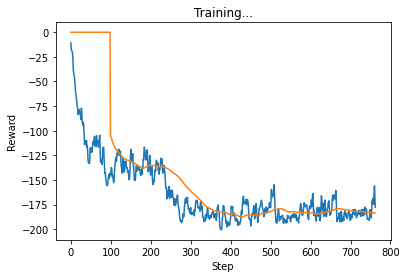

[65.62500000000004, 9.65920970102446, 47.50943592470131, 52.773122628908084]
show


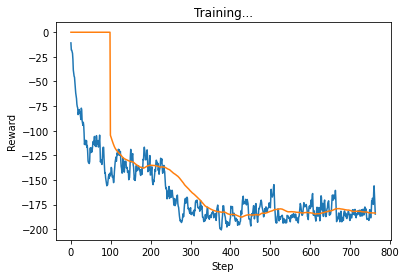

[65.62500000000004, 12.878946268032616, 46.72377463958945, 57.4283687361421]
[65.62500000000004, 12.878946268032616, 46.72377463958945, 57.4283687361421]
set0
show


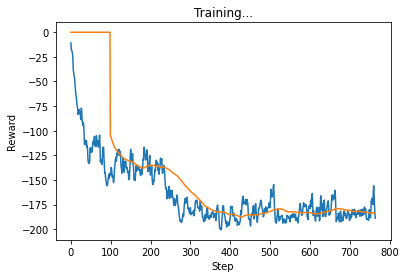

[65.62500000000004, 15.865864992798196, 45.52729011640105, 59.858998640218395]
show


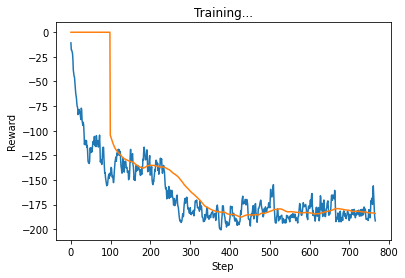

[65.62500000000004, 16.003156864238743, 46.95093938447945, 60.982525703509516]
[65.62500000000004, 16.003156864238743, 46.95093938447945, 60.982525703509516]
set0
show


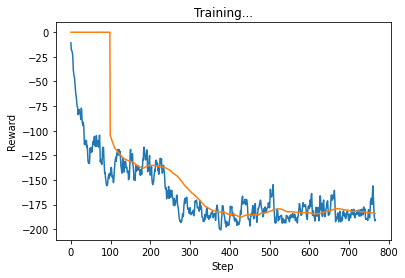

[65.62500000000004, 16.09868283504077, 44.396449598976325, 62.75528635191801]
show


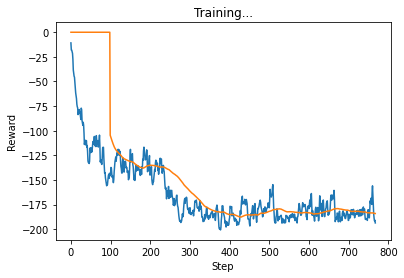

[65.62500000000004, 16.09868283504077, 45.79855203593205, 64.12581921925819]
show


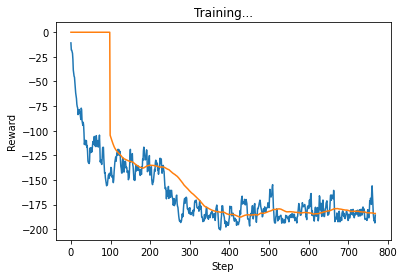

[65.62500000000004, 9.351131631806247, 44.25238896737004, 64.43333514855028]
[65.62500000000004, 9.351131631806247, 44.25238896737004, 64.43333514855028]
set0
show


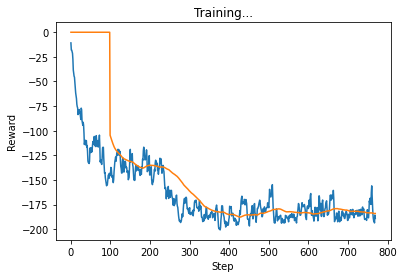

[65.62500000000004, 8.374357975027817, 47.82288289875349, 65.2135947312536]
show


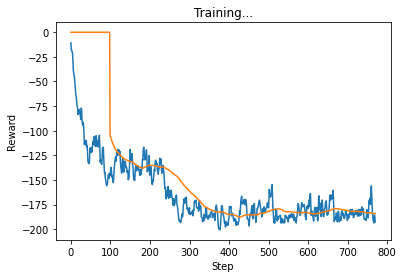

[65.62500000000004, 9.65920970102446, 49.87369492398882, 65.42536739121238]
[65.62500000000004, 9.65920970102446, 49.87369492398882, 65.42536739121238]
set0
show


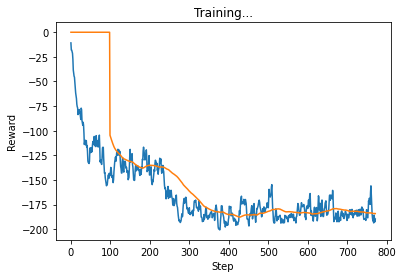

[65.62500000000004, 9.65920970102446, 47.123530221067924, 65.42536739121238]
show


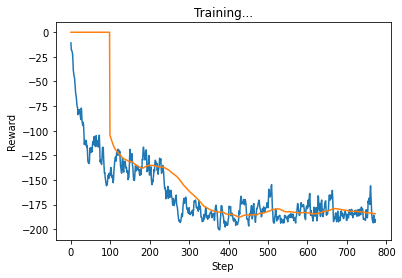

[65.62500000000004, 9.65920970102446, 50.05650894496867, 65.42536739121238]
[65.62500000000004, 9.65920970102446, 50.05650894496867, 65.42536739121238]
set0
show


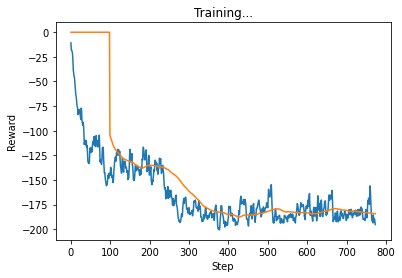

[65.62500000000004, 12.878946268032616, 49.33621427970935, 65.42536739121238]
show


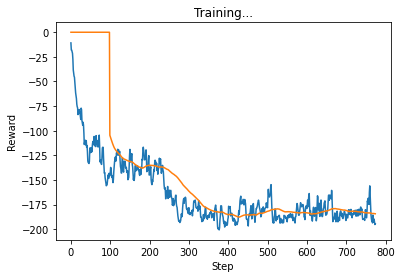

[65.62500000000004, 12.878946268032616, 48.713719206735334, 65.42536739121238]
[65.62500000000004, 12.878946268032616, 48.713719206735334, 65.42536739121238]
set0
show


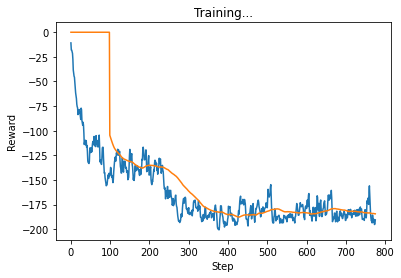

[65.62500000000004, 9.65920970102446, 47.82187710854443, 65.42536739121238]
show


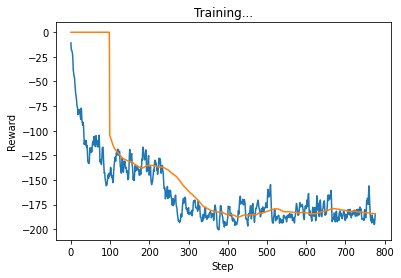

[65.62500000000004, 3.219736567008154, 48.088483018476, 65.42536739121238]
[65.62500000000004, 3.219736567008154, 48.088483018476, 65.42536739121238]
set0
show


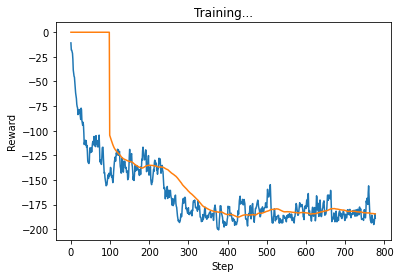

[65.62500000000004, 6.439473134016308, 49.1612541868907, 65.42536739121238]
show


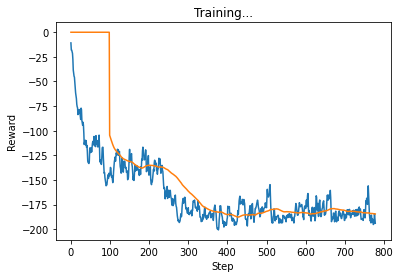

[65.62500000000004, 9.65920970102446, 51.302660492219445, 65.42536739121238]
[65.62500000000004, 9.65920970102446, 51.302660492219445, 65.42536739121238]
set0
show


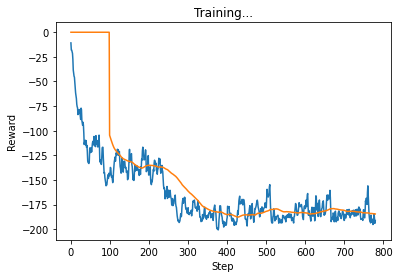

[65.62500000000004, 9.65920970102446, 48.506450272252465, 65.42536739121238]
show


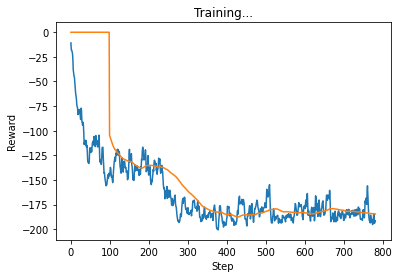

[65.62500000000004, 12.878946268032616, 47.80710189035065, 63.713327514956916]
show


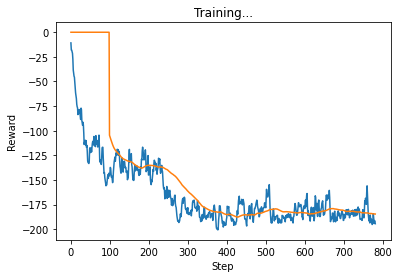

[65.62500000000004, 16.09868283504077, 47.873187410147665, 62.863397669036374]
[65.62500000000004, 16.09868283504077, 47.873187410147665, 62.863397669036374]
set0
show


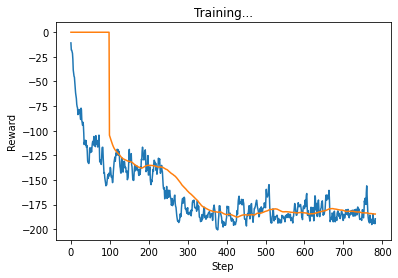

[65.62500000000004, 15.065518164178753, 47.67921928654414, 59.047738600651826]
show


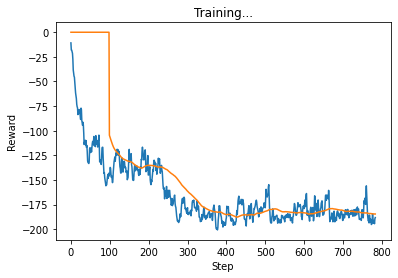

[65.62500000000004, 12.878946268032616, 45.89272125849554, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 45.89272125849554, 61.78826155784503]
set0
show


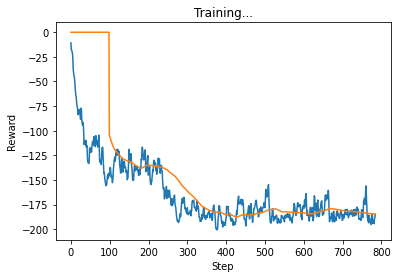

[65.62500000000004, 9.65920970102446, 46.06428978807757, 61.78826155784503]
show


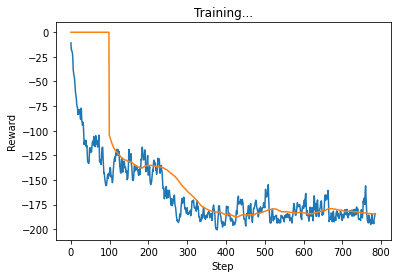

[65.62500000000004, 9.65920970102446, 45.1096858839762, 61.78826155784503]
[65.62500000000004, 9.65920970102446, 45.1096858839762, 61.78826155784503]
set0
show


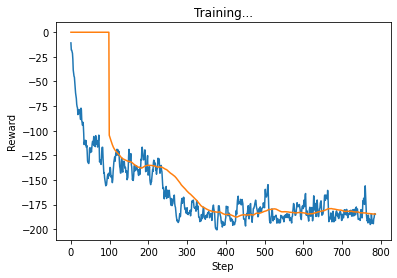

[65.62500000000004, 9.65920970102446, 45.61053462790059, 61.78826155784503]
show


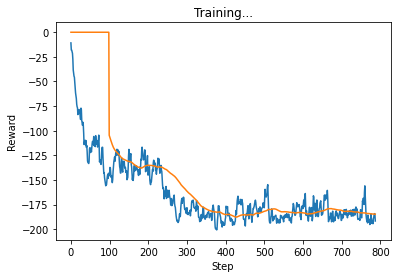

[65.62500000000004, 12.878946268032616, 49.42389740909607, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 49.42389740909607, 61.78826155784503]
set0
show


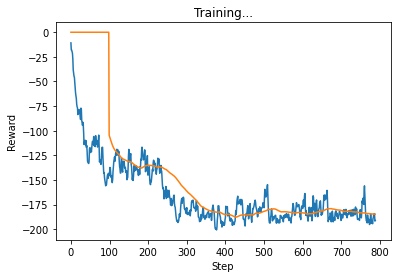

[65.62500000000004, 14.747424086325536, 47.170213010658735, 61.78826155784503]
show


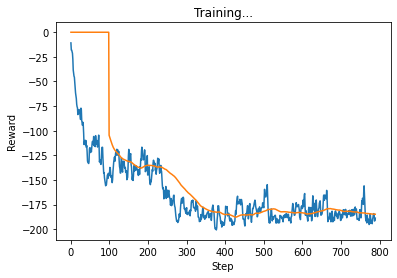

[65.62500000000004, 12.878946268032616, 46.510567652731304, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 46.510567652731304, 61.78826155784503]
set0
show


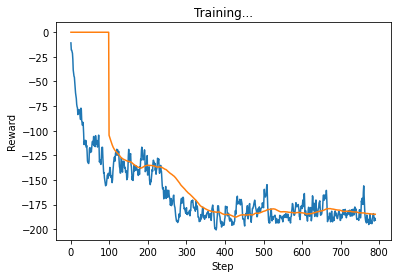

[65.62500000000004, 13.489188052294482, 47.81612069931566, 61.78826155784503]
show


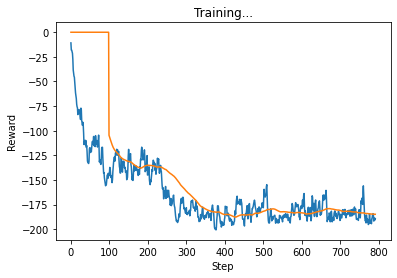

[65.62500000000004, 12.878946268032616, 46.92566197711323, 61.78826155784503]
[65.62500000000004, 12.878946268032616, 46.92566197711323, 61.78826155784503]
set0
show


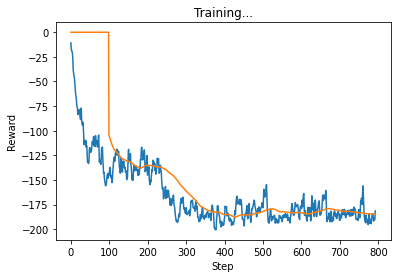

[65.62500000000004, 6.5957978669808615, 45.43925026057603, 61.78826155784503]
show


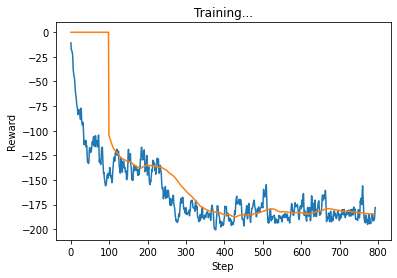

In [ ]:
#episode = 0
reset()
traci.simulationStep()
for seconds in range(1000):
    state = get_state()
    reward = initial(50)
    reward_memory.append(reward)
    plot_durations()
    
traci.close()